In [ ]:
import tensorflow as tf
import cv2
import zipfile
import os
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K
from tensorflow.keras import layers, Input
from tensorflow.keras.layers import Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, Dropout, Concatenate,GlobalAveragePooling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pydot
import datetime
from PIL import Image
from IPython.display import SVG
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from keras.layers import concatenate
from sklearn.metrics import mean_absolute_error

# Dataset and Metadata Retrieval

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd '/content/drive/MyDrive/ML_HD_C2'

/content/drive/.shortcut-targets-by-id/1SdnBZOzsEir7hBdU_PsKhixJYL4F6ZI4/ML_HD_C2


In [ ]:
preprocessed_training_images_raw_dir = 'preprocess/training_raw'
preprocessed_training_images_clahe_dir = 'preprocess/training_clahe'
preprocessed_training_images_clahe_masked_dir = 'preprocess/training_clahe_masked'

preprocessed_validation_images_raw_dir = 'preprocess/validation_raw'
preprocessed_validation_images_clahe_dir = 'preprocess/validation_clahe'
preprocessed_validation_images_clahe_masked_dir = 'preprocess/validation_clahe_masked'

preprocessed_test_images_raw_dir = 'preprocess/test_raw'
preprocessed_test_images_clahe_dir = 'preprocess/test_clahe'
preprocessed_test_images_clahe_masked_dir = 'preprocess/test_clahe_masked'

In [ ]:
current_path = os.getcwd()
dir = preprocessed_training_images_raw_dir
full_path = os.path.join(current_path, dir.lstrip('/'))  # lstrip to remove leading slash

In [ ]:
# #Count the number of image files
# image_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff', '.webp')  # Common image file extensions
# image_count = sum(1 for file in os.listdir(full_path) if file.lower().endswith(image_extensions))

# print(f"Number of images in the {full_path} directory: {image_count}")

## Retrieving ground truth metadata



In [ ]:
#retrieving ground truth labels
ground_truth_dir = 'dataset/'
train_gt_file = 'train.csv'
val_gt_file = 'validation.csv'
test_gt_file = 'test.xlsx'

gt_dir = os.path.join(current_path, ground_truth_dir)
full_gt_traing_path = os.path.join(gt_dir, train_gt_file)
full_gt_validation_path = os.path.join(gt_dir, val_gt_file)
full_gt_test_path = os.path.join(gt_dir, test_gt_file)

train_metadata_df = pd.read_csv(full_gt_traing_path)
validation_metadata_df = pd.read_csv(full_gt_validation_path)
test_metadata_df = pd.read_excel(full_gt_test_path)

In [ ]:
print(train_metadata_df.count())
print(validation_metadata_df.count())
print(test_metadata_df.count())

id         12611
boneage    12611
male       12611
dtype: int64
Image ID             1425
male                 1425
Bone Age (months)    1425
dtype: int64
Case ID                           200
Sex                               200
Ground truth bone age (months)    200
dtype: int64


In [ ]:
train_male = train_metadata_df['male'].sum()
validation_male = validation_metadata_df['male'].sum()
test_male = test_metadata_df[test_metadata_df['Sex'] == 'M'].count()['Sex']

Train Female: 5778
Train Male: 6833


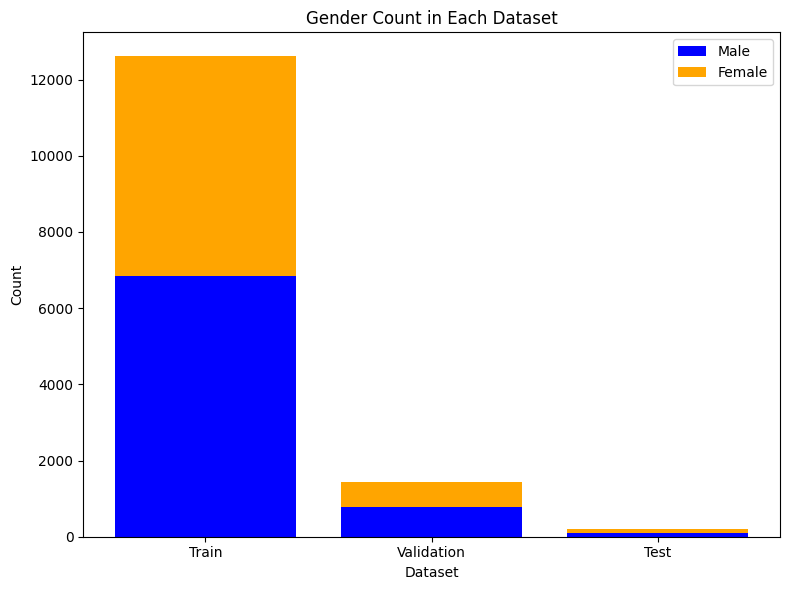

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data from the provided output
train_total = 12611
train_female = train_total - train_male
print("Train Female:", train_female)
print("Train Male:", train_male)

validation_total = 1425
validation_female = validation_total - validation_male

test_total = 200
test_female = test_total - test_male

# Data preparation
datasets = ['Train', 'Validation', 'Test']
male_counts = [train_male, validation_male, test_male]
female_counts = [train_female, validation_female, test_female]

# Plotting
fig, ax = plt.subplots(figsize=(8, 6))

# Stacked bar plot
ax.bar(datasets, male_counts, label='Male', color='blue')
ax.bar(datasets, female_counts, bottom=male_counts, label='Female', color='orange')

# Add labels and title
ax.set_ylabel('Count')
ax.set_xlabel('Dataset')
ax.set_title('Gender Count in Each Dataset')
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()


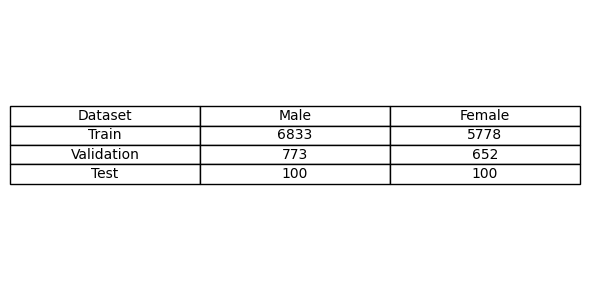

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data from the provided output
train_total = 12611
train_female = train_total - train_male

validation_total = 1425
validation_female = validation_total - validation_male

test_total = 200
test_female = test_total - test_male

# Data preparation
datasets = ['Train', 'Validation', 'Test']
male_counts = [train_male, validation_male, test_male]
female_counts = [train_female, validation_female, test_female]

# Create a table
fig, ax = plt.subplots(figsize=(6, 3))

# Hide the axes
ax.axis('off')

# Create a list of column headers and row data
columns = ['Dataset', 'Male', 'Female']
rows = [
    ['Train', train_male, train_female],
    ['Validation', validation_male, validation_female],
    ['Test', test_male, test_female]
]

# Create the table and add it to the figure
table = ax.table(cellText=rows, colLabels=columns, cellLoc='center', loc='center')

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
train_metadata_df.head()

,id,boneage,male
0,1377,180,False
1,1378,12,False
2,1379,94,False
3,1380,120,True
4,1381,82,False


In [ ]:
#retrieve the image names under the directory
training_images_names = os.listdir(os.path.join(current_path, preprocessed_training_images_raw_dir))
validation_images_names = os.listdir(os.path.join(current_path, preprocessed_validation_images_raw_dir))
test_images_names = os.listdir(os.path.join(current_path, preprocessed_test_images_raw_dir))

In [ ]:
#! the first cell of preprocessing part must be run before this
labels = []
sexes = []
for training_image_name in training_images_names:
  case_id = int(re.search(r'\d+', os.path.basename(training_image_name)).group())
  label = train_metadata_df.loc[train_metadata_df['id'] == case_id, "boneage"].values[0]
  sex = train_metadata_df.loc[train_metadata_df['id'] == case_id, 'male'].values[0]
  labels.append(label)
  sexes.append(sex)

min_label = min(labels)
max_label = max(labels)
labels = [(label - min_label) / (max_label - min_label) for label in labels]
labels = np.array(labels)

#create a dataframe out of (img_paths,labels,sex)
train_raw_imdir = os.path.join(current_path, preprocessed_training_images_raw_dir)
training_raw_images_names = [os.path.join(train_raw_imdir, filename) for filename in training_images_names]

train_clahe_imdir = os.path.join(current_path, preprocessed_training_images_clahe_dir)
#training_clahe_images_names = [os.path.join(train_clahe_imdir, filename.split('/')[7]) for filename in training_images_names]
training_clahe_images_names = [os.path.join(train_clahe_imdir, filename) for filename in training_images_names]

train_clahe_masked_imdir = os.path.join(current_path, preprocessed_training_images_clahe_masked_dir)
training_clahe_masked_images_names = [os.path.join(train_clahe_masked_imdir, filename) for filename in training_images_names]

train_raw_dfd = pd.DataFrame({'img_path': training_raw_images_names, 'boneage': labels, 'male': sexes})
train_clahe_dfd = pd.DataFrame({'img_path': training_clahe_images_names, 'boneage':labels, 'male':sexes})
train_clahe_masked_dfd =  pd.DataFrame({'img_path': training_clahe_masked_images_names, 'boneage':labels, 'male':sexes})


In [ ]:
#! the first cell of preprocessing part must be run before this
labels = []
sexes = []
for validation_image_name in validation_images_names:
  case_id = int(re.search(r'\d+', os.path.basename(validation_image_name)).group())
  label = validation_metadata_df.loc[validation_metadata_df['Image ID'] == case_id, "Bone Age (months)"].values[0]
  sex = validation_metadata_df.loc[validation_metadata_df['Image ID'] == case_id, 'male'].values[0]
  labels.append(label)
  sexes.append(sex)

labels = [(label - min_label) / (max_label - min_label) for label in labels]
labels = np.array(labels)

#create a dataframe out of (img_paths,labels,sex)
validation_raw_imdir = os.path.join(current_path, preprocessed_validation_images_raw_dir)
validation_raw_images_names = [os.path.join(validation_raw_imdir, filename) for filename in validation_images_names]

validation_clahe_imdir = os.path.join(current_path, preprocessed_validation_images_clahe_dir)
validation_clahe_images_names = [os.path.join(validation_clahe_imdir, filename) for filename in validation_images_names]

validation_clahe_masked_imdir = os.path.join(current_path, preprocessed_validation_images_clahe_masked_dir)
validation_clahe_masked_images_names = [os.path.join(validation_clahe_masked_imdir, filename) for filename in validation_images_names]

valid_raw_dfd = pd.DataFrame({'img_path': validation_raw_images_names, 'boneage': labels, 'male': sexes})
valid_clahe_dfd = pd.DataFrame({'img_path': validation_clahe_images_names, 'boneage':labels, 'male':sexes})
valid_clahe_masked_dfd =  pd.DataFrame({'img_path': validation_clahe_masked_images_names, 'boneage':labels, 'male':sexes})


In [ ]:
#! the first cell of preprocessing part must be run before this
labels = []
sexes = []
for test_image_name in test_images_names:
  case_id = int(re.search(r'\d+', os.path.basename(test_image_name)).group())
  label = test_metadata_df.loc[test_metadata_df['Case ID'] == case_id, "Ground truth bone age (months)"].values[0]
  sex = test_metadata_df.loc[test_metadata_df['Case ID'] == case_id, 'Sex'].values[0]
  if sex == 'M':
    sex = True
  else:
    sex = False
  labels.append(label)
  sexes.append(sex)

labels = [(label - min_label) / (max_label - min_label) for label in labels]
labels = np.array(labels)

#create a dataframe out of (img_paths,labels,sex)
test_raw_imdir = os.path.join(current_path, preprocessed_test_images_raw_dir)
test_raw_images_names = [os.path.join(test_raw_imdir, filename) for filename in test_images_names]

test_clahe_imdir = os.path.join(current_path, preprocessed_test_images_clahe_dir)
test_clahe_images_names = [os.path.join(test_clahe_imdir, filename) for filename in test_images_names]

test_clahe_masked_imdir = os.path.join(current_path, preprocessed_test_images_clahe_masked_dir)
test_clahe_masked_images_names = [os.path.join(test_clahe_masked_imdir, filename) for filename in test_images_names]

test_raw_dfd = pd.DataFrame({'img_path': test_raw_images_names, 'boneage': labels, 'male': sexes})
test_clahe_dfd = pd.DataFrame({'img_path': test_clahe_images_names, 'boneage':labels, 'male':sexes})
test_clahe_masked_dfd =  pd.DataFrame({'img_path': test_clahe_masked_images_names, 'boneage':labels, 'male':sexes})


In [ ]:
train_clahe_dfd

,img_path,boneage,male
0,/content/drive/.shortcut-targets-by-id/1SdnBZO...,0.577093,False
1,/content/drive/.shortcut-targets-by-id/1SdnBZO...,0.682819,True
2,/content/drive/.shortcut-targets-by-id/1SdnBZO...,0.356828,False
3,/content/drive/.shortcut-targets-by-id/1SdnBZO...,0.709251,True
4,/content/drive/.shortcut-targets-by-id/1SdnBZO...,0.682819,True
...,...,...,...
12606,/content/drive/.shortcut-targets-by-id/1SdnBZO...,0.709251,True
12607,/content/drive/.shortcut-targets-by-id/1SdnBZO...,0.462555,True
12608,/content/drive/.shortcut-targets-by-id/1SdnBZO...,0.629956,False
12609,/content/drive/.shortcut-targets-by-id/1SdnBZO...,0.709251,True


## Calculating augmentation numbers for balanced dataset

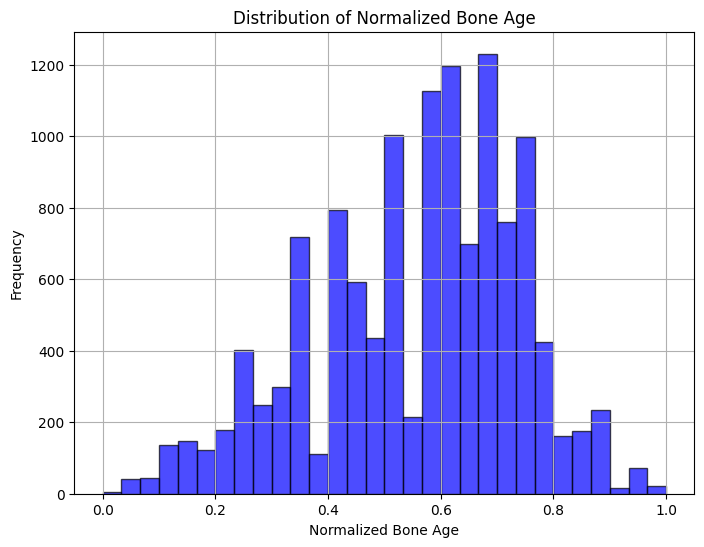

In [ ]:
#distribution plot of boneage
plt.figure(figsize=(8, 6))
plt.hist(train_raw_dfd['boneage'], bins=30, alpha=0.7, color='blue', edgecolor='black')
plt.title('Distribution of Normalized Bone Age')
plt.xlabel('Normalized Bone Age')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [ ]:
# Step 2: Assign bins to boneage values
bin_edges = np.linspace(0, 1, 11)  # 10 bins between 0 and 1
train_raw_dfd['bin'] = pd.cut(train_raw_dfd['boneage'], bins=bin_edges, labels=False)

# Step 3: Calculate frequency per bin
bin_counts = train_raw_dfd['bin'].value_counts().sort_index()

# Step 4: Determine augmentation factors
# The bin with the highest frequency gets 1 augmentation
# Less frequent bins get higher augmentation factors
max_count = bin_counts.max()
augmentation_factors = {bin_idx: int(max_count / count) for bin_idx, count in bin_counts.items()}

# Step 5: Assign augmentation counts to each entry
train_raw_dfd['augmentations_needed'] = train_raw_dfd['bin'].map(augmentation_factors)
train_clahe_dfd['augmentations_needed'] = train_raw_dfd['bin'].map(augmentation_factors)
train_clahe_masked_dfd['augmentations_needed'] = train_raw_dfd['bin'].map(augmentation_factors)
# Step 6: Inspect the resulting DataFrame
print(train_raw_dfd[['boneage', 'bin', 'augmentations_needed']].head())

# Optional: Check distribution of augmentations
augmentation_distribution = train_raw_dfd['augmentations_needed'].value_counts().sort_index()
print("Augmentation distribution:")
print(augmentation_distribution)

    boneage  bin  augmentations_needed
0  0.577093  5.0                   1.0
1  0.682819  6.0                   1.0
2  0.356828  3.0                   2.0
3  0.709251  7.0                   1.0
4  0.682819  6.0                   1.0
Augmentation distribution:
augmentations_needed
1.0     9476
2.0     1127
3.0      831
5.0      571
7.0      406
28.0     109
34.0      90
Name: count, dtype: int64


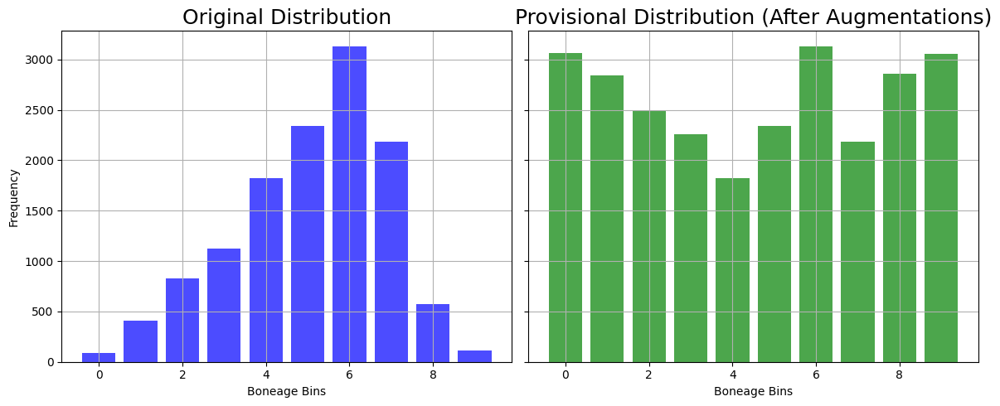

Provisional Distribution (After Augmentations):
bin
0.0    3060
1.0    2842
2.0    2493
3.0    2254
4.0    1824
5.0    2344
6.0    3126
7.0    2182
8.0    2855
9.0    3052
Name: count, dtype: int64
Total number of data points in provisional distribution: 26032


In [ ]:
# Step 1: Calculate the provisional counts after augmentation
# Add the original counts plus the augmentations for each bin
provisional_bin_counts = bin_counts.copy()

# Add augmentations to the provisional counts
for bin_idx, count in bin_counts.items():
    augmentations_per_bin = (augmentation_factors[bin_idx] - 1) * count
    provisional_bin_counts[bin_idx] += augmentations_per_bin

# Step 2: Visualize the original and provisional distributions
fig, ax = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Plot original distribution
ax[0].bar(bin_counts.index, bin_counts.values, color="blue", alpha=0.7)
ax[0].set_title("Original Distribution", fontsize=18)
ax[0].set_xlabel("Boneage Bins")
ax[0].set_ylabel("Frequency")
ax[0].grid(True)

# Plot provisional distribution
ax[1].bar(provisional_bin_counts.index, provisional_bin_counts.values, color="green", alpha=0.7)
ax[1].set_title("Provisional Distribution (After Augmentations)", fontsize=18)
ax[1].set_xlabel("Boneage Bins")
ax[1].grid(True)

plt.tight_layout()
plt.show()

# Step 3: Print the new distribution values
print("Provisional Distribution (After Augmentations):")
print(provisional_bin_counts)

# Step 2: Calculate the total number of data points in the provisional distribution
total_provisional_count = provisional_bin_counts.sum()

# Step 3: Print the total count
print("Total number of data points in provisional distribution:", total_provisional_count)


## Downloading the dataset to local

In [ ]:
test_raw_imdir

'/content/drive/.shortcut-targets-by-id/1SdnBZOzsEir7hBdU_PsKhixJYL4F6ZI4/ML_HD_C2/preprocess/test_raw'

In [ ]:
#delete everything under /content/datasets
import shutil

# Delete the directory and its contents
shutil.rmtree('/content/datasets', ignore_errors=True)

# Verify if the directory is deleted
if not os.path.exists('/content/datasets'):
    print("Directory '/content/datasets' and its contents have been deleted.")
else:
    print("Failed to delete directory '/content/datasets'.")

Directory '/content/datasets' and its contents have been deleted.


Below takes around 7.5 minutes

In [ ]:
#copy folder from drive to local
import shutil

shutil.copytree(train_clahe_imdir, '/content/datasets/training_clahe')
shutil.copytree(validation_clahe_imdir, '/content/datasets/validation_clahe')
shutil.copytree(test_clahe_imdir, '/content/datasets/test_clahe')

'/content/datasets/test_clahe'

In [ ]:
#only for demo
import shutil
shutil.copytree(test_clahe_imdir, '/content/datasets/test_clahe')

'/content/datasets/test_clahe'

In [ ]:
# #copy folder from drive to local
# import shutil

# shutil.copytree(train_clahe_masked_imdir, '/content/datasets/training_clahe_masked')
# shutil.copytree(validation_clahe_masked_imdir, '/content/datasets/validation_clahe_masked')
# shutil.copytree(test_clahe_masked_imdir, '/content/datasets/test_clahe_masked')



# Tensorflow Dataset

In [ ]:
def load_image(img_path):
    # Load PNG image lazily and decode it as grayscale
    img = tf.io.read_file(img_path)
    img = tf.image.decode_png(img, channels=1)  # Grayscale (1 channel)
    return img

def preprocess_image(img, sex, label):
    # Return the processed image and label
    return (img, tf.expand_dims(sex, axis=-1)), label  # Ensure `sex` has shape (1,)


def augment_image(img, sex, label, aug_rot_range):

    # img = tf.image.convert_image_dtype(img, dtype=tf.float32)

    # Apply augmentations (e.g., random rotations)
    img = tf.image.random_flip_left_right(img)

    # # Add Gaussian noise
    # noise = tf.random.normal(shape=tf.shape(img), mean=0.0, stddev=0.1, dtype=img.dtype)
    # img = img + noise
    # img = tf.clip_by_value(img, 0.0, 1.0)  # Ensure pixel values stay in [0, 1]

    inputs = (img, tf.expand_dims(sex, axis=-1))  # Combine image and sex into inputs
    return inputs, label

def load_and_preprocess(img_path, sex, label, aug_num, aug_rot_range, is_validation=False):
    # Load the image
    img = load_image(img_path)

    # Preprocess the image
    inputs, label = preprocess_image(img, sex, label)

    if is_validation:
        # For validation, wrap the tuple in a single-element Dataset
        return tf.data.Dataset.from_tensors((inputs, label))

    # Create multiple augmentations for training
    def augment_fn(_):
        return augment_image(img, sex, label, aug_rot_range)

    augmentations_ds = tf.data.Dataset.range(aug_num).map(augment_fn)
    return augmentations_ds

def create_dataset(df, batch_size, is_validation = False, shuffle=True):
    img_paths = df['img_path'].values
    labels = df['boneage'].values
    sexes = df['male'].values
    aug_nums = None
    if is_validation:
      aug_nums = np.zeros(len(labels))
    else:
      aug_nums = df['augmentations_needed'].values

    # Create a Dataset object from the metadata
    metadata_ds = tf.data.Dataset.from_tensor_slices((img_paths, sexes, labels, aug_nums))

    # Load and preprocess images lazily
    dataset = metadata_ds.flat_map(
        lambda img_path, sex, label, aug_num: load_and_preprocess(img_path, sex, label, aug_num, aug_rot_range=10,is_validation = is_validation)
    )

    # Shuffle if needed
    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)

    # Batch the dataset
    dataset = dataset.batch(batch_size=batch_size)

    # Prefetch for performance
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

In [ ]:
train_clahe_masked_dfd["augmentations_needed"] = train_clahe_masked_dfd["augmentations_needed"].fillna(1)
#cast augmentations_needed to int
train_clahe_masked_dfd['augmentations_needed'] = train_clahe_masked_dfd['augmentations_needed'].astype(int)

import re

train_clahe_masked_dfd["img_path"] = train_clahe_masked_dfd["img_path"].str.replace(r".*?preprocess", "/content/datasets", regex=True)
valid_clahe_masked_dfd["img_path"] = valid_clahe_masked_dfd["img_path"].str.replace(r".*?preprocess", "/content/datasets", regex=True)

In [ ]:
#replace nan values of dfd["augmentations_needed"] with 1
train_clahe_dfd["augmentations_needed"] = train_clahe_dfd["augmentations_needed"].fillna(1)
#cast augmentations_needed to int
train_clahe_dfd['augmentations_needed'] = train_clahe_dfd['augmentations_needed'].astype(int)

In [ ]:
#change the img_path to local datasets
train_clahe_dfd["img_path"] = train_clahe_dfd["img_path"].str.replace("/content/drive/MyDrive/ML_HD_C2/preprocess","/content/datasets")

In [ ]:
valid_clahe_dfd["img_path"] = valid_clahe_dfd["img_path"].str.replace("/content/drive/MyDrive/ML_HD_C2/preprocess","/content/datasets")

In [ ]:
import re

train_clahe_dfd["img_path"] = train_clahe_dfd["img_path"].str.replace(r".*?preprocess", "/content/datasets", regex=True)
valid_clahe_dfd["img_path"] = valid_clahe_dfd["img_path"].str.replace(r".*?preprocess", "/content/datasets", regex=True)

In [ ]:
#create dataset
batch_size = 32
train_dataset = create_dataset(train_clahe_dfd, batch_size)
val_dataset = create_dataset(valid_clahe_dfd, batch_size, is_validation = True)


# Models

## 4 Conv2D (3x3)

In [ ]:
# Define custom RMSE loss function
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
def create_deeper_model(input_shape_image=(256, 256, 1), input_shape_gender=(1,)):
    image_input = layers.Input(shape=input_shape_image)
    gender_input = layers.Input(shape=input_shape_gender)

    # Add preprocessing layer for random rotation
    # Rotation range in radians (10 degrees = 10 * π/180)
    rotation_layer = layers.RandomRotation(
        factor=(-10 / 360, 10 / 360),  # Random rotation in ±10 degrees
        fill_mode='nearest'           # Fill missing pixels after rotation
    )
    rotated_image = rotation_layer(image_input)

    # # Ensure pixel values stay in 0-255 range
    # scaled_image = tf.clip_by_value(rotated_image, 0, 255)

    # CNN part for image processing
    def conv_block(x, filters, kernel_size=(3, 3), strides=(1, 1), padding='same', use_bn=True):
        x_shortcut = x
        x = layers.Conv2D(filters, kernel_size, strides=strides, padding=padding,
                          kernel_regularizer=regularizers.l2(1e-4))(x)
        if use_bn:
            x = layers.BatchNormalization()(x)
        x = layers.ELU()(x)
        return x + x_shortcut if x.shape == x_shortcut.shape else x

    # Initial Convolutional Block
    x = layers.Conv2D(32, (3, 3), padding='same')(rotated_image)
    x = layers.BatchNormalization()(x)
    x = layers.ELU()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Deeper Convolutional Layers with Residual Blocks
    for filters in [64, 128, 256]:
        x = conv_block(x, filters)
        x = layers.MaxPooling2D((2, 2))(x)

    # Global Average Pooling
    x = layers.GlobalAveragePooling2D()(x)

    # Dense layers for image features
    x = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.4)(x)

    # Dense layer for gender input
    gender = layers.Dense(64, activation='relu')(gender_input)

    # Combine image features and gender
    combined = layers.concatenate([x, gender])

    # Additional dense layers for combined information
    combined = layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)
    combined = layers.Dropout(0.3)(combined)
    combined = layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)

    # Output layer for regression (months)
    output = layers.Dense(1, activation='sigmoid')(combined)

    # Model
    model = models.Model(inputs=[image_input, gender_input], outputs=output)

    # Set a specific learning rate
    learning_rate = 0.0001  # Lower learning rate for deeper models
    optimizer = Adam(learning_rate=learning_rate)

    # Compile the model
    model.compile(optimizer=optimizer, loss=rmse_loss, metrics=['mae'])

    return model



## InceptionV4

### Helper Conv2d_bn block

In [ ]:
# FUNCTION: conv2d_bn block
def conv2d_bn(X_input, filters, kernel_size, strides, padding='same', activation=None,
              name=None):
    """
    Implementation of a conv block as defined above

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)
    filters -- integer, defining the number of filters in the CONV layer
    kernel_size -- (f1, f2) tuple of integers, specifying the shape of the CONV kernel
    s -- integer, specifying the stride to be used
    padding -- padding approach to be used
    name -- name for the layers

    Returns:
    X -- output of the conv2d_bn block, tensor of shape (n_H, n_W, n_C)
    """

    # defining name basis
    conv_name_base = 'conv_'
    bn_name_base = 'bn_'

    X = Conv2D(filters = filters, kernel_size = kernel_size, strides = strides,
               padding = padding, name = conv_name_base + name,
               kernel_initializer = glorot_uniform(seed=0))(X_input)
    X = BatchNormalization(axis = 3, name = bn_name_base + name)(X)
    if activation is not None:
        X = Activation(activation)(X)
    return X

### Stem Block

In [ ]:
# FUNCTION: stem_block

def stem_block(X_input):
    """
    Implementation of the stem block as defined above

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)

    Returns:
    X -- output of the stem block, tensor of shape (n_H, n_W, n_C)
    """

    ### START CODE HERE ###

    # First conv
    X = conv2d_bn(X_input, filters = 32, kernel_size = (3, 3), strides = (2, 2),
                  padding = 'valid', activation='relu', name = 'stem_1th')

    # Second conv
    X = conv2d_bn(X, filters = 32, kernel_size = (3, 3), strides = (1, 1),
                  padding = 'valid', activation='relu', name = 'stem_2nd')

    # Third conv
    X = conv2d_bn(X, filters = 64, kernel_size = (3, 3), strides = (1, 1),
                  padding = 'same', activation='relu', name =  'stem_3rd')

    # First branch: max pooling
    branch1 = MaxPooling2D(pool_size = (3, 3), strides = (2, 2),
                           padding = 'valid', name = 'stem_1stbranch_1')(X)

    # Second branch: conv
    branch2 = conv2d_bn(X, filters = 96, kernel_size = (3, 3),
                        strides = (2, 2), padding = 'valid', activation='relu',
                        name = 'stem_1stbranch_2')

    # Concatenate (1) branch1 and branch2 along the channel axis
    X = Concatenate(axis=3)([branch1, branch2])

    # First branch: 2 convs
    branch1 = conv2d_bn(X, filters = 64, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'stem_2ndbranch_1_1')
    branch1 = conv2d_bn(branch1, filters = 96, kernel_size = (3, 3),
                        strides = (1, 1), padding = 'valid', activation='relu',
                        name = 'stem_2ndbranch_1_2')

    # Second branch: 4 convs
    branch2 = conv2d_bn(X, filters = 64, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'stem_2ndbranch_2_1')
    branch2 = conv2d_bn(branch2, filters = 64, kernel_size = (7, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'stem_2ndbranch_2_2')
    branch2 = conv2d_bn(branch2, filters = 64, kernel_size = (1, 7),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'stem_2ndbranch_2_3')
    branch2 = conv2d_bn(branch2, filters = 96, kernel_size = (3, 3),
                        strides = (1, 1), padding = 'valid', activation='relu',
                        name = 'stem_2ndbranch_2_4')

    # Concatenate (2) branch1 and branch2 along the channel axis
    X = Concatenate(axis=3)([branch1, branch2])

    # First branch: conv
    branch1 = conv2d_bn(X, filters = 192, kernel_size = (3, 3),
                        strides = (2, 2), padding = 'valid', activation='relu',
                        name = 'stem_3rdbranch_1')

    # Second branch: max pooling
    branch2 = MaxPooling2D(pool_size = (3, 3), strides = (2, 2),
                           padding = 'valid', name = 'stem_3rdbranch_2')(X)

    # Concatenate (3) branch1 and branch2 along the channel axis
    X = Concatenate(axis=3)([branch1, branch2])

    ### END CODE HERE ###

    return X

In [ ]:
tf.random.set_seed(1)
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

X_out = stem_block(X_inp)
print("shape output" + str(X_out.shape))
print("out = " + str(X_out[:, 0, 0, 0]))

shape output(4, 10, 10, 384)
out = tf.Tensor([0.01137414 0.         0.01842475 0.        ], shape=(4,), dtype=float32)


### The Inception-A block

In [ ]:
# FUNCTION: Inception-A block

def inception_a_block(X_input, base_name):
    """
    Implementation of the Inception-A block

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)

    Returns:
    X -- output of the block, tensor of shape (n_H, n_W, n_C)
    """

    ### START CODE HERE ###

    # Branch 1
    branch1 = AveragePooling2D(pool_size = (3, 3), strides = (1, 1),
                           padding = 'same', name = base_name + 'ia_branch_1_1')(X_input)
    branch1 = conv2d_bn(branch1, filters = 96, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ia_branch_1_2')

    # Branch 2
    branch2 = conv2d_bn(X_input, filters = 96, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ia_branch_2_1')

    # Branch 3
    branch3 = conv2d_bn(X_input, filters = 64, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ia_branch_3_1')
    branch3 = conv2d_bn(branch3, filters = 96, kernel_size = (3, 3),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ia_branch_3_2')

    # Branch 4
    branch4 = conv2d_bn(X_input, filters = 64, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ia_branch_4_1')
    branch4 = conv2d_bn(branch4, filters = 96, kernel_size = (3, 3),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ia_branch_4_2')
    branch4 = conv2d_bn(branch4, filters = 96, kernel_size = (3, 3),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ia_branch_4_3')

    # Concatenate branch1, branch2, branch3 and branch4 along the channel axis
    X = Concatenate(axis=3)([branch1, branch2, branch3, branch4])

    ### END CODE HERE ###

    return X

In [ ]:
tf.random.set_seed(1)
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

X_out = inception_a_block(X_inp, 'a')
print("shape output" + str(X_out.shape))
print("out = " + str(X_out[:, 0, 0, 0]))

shape output(4, 100, 100, 384)
out = tf.Tensor([0.09909102 0.18648544 0.01800423 0.        ], shape=(4,), dtype=float32)


### The Inception-B block

In [ ]:
# FUNCTION: Inception-B block

def inception_b_block(X_input, base_name):
    """
    Implementation of the Inception-B block

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)

    Returns:
    X -- output of the block, tensor of shape (n_H, n_W, n_C)
    """

    ### START CODE HERE ###

    # Branch 1
    branch1 = AveragePooling2D(pool_size = (3, 3), strides = (1, 1),
                           padding = 'same', name = base_name + 'ib_branch_1_1')(X_input)
    branch1 = conv2d_bn(branch1, filters = 128, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_1_2')

    # Branch 2
    branch2 = conv2d_bn(X_input, filters = 384, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_2_1')

    # Branch 3
    branch3 = conv2d_bn(X_input, filters = 192, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_3_1')
    branch3 = conv2d_bn(branch3, filters = 224, kernel_size = (1, 7),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_3_2')
    branch3 = conv2d_bn(branch3, filters = 256, kernel_size = (7, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_3_3')

    # Branch 4
    branch4 = conv2d_bn(X_input, filters = 192, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_4_1')
    branch4 = conv2d_bn(branch4, filters = 192, kernel_size = (1, 7),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_4_2')
    branch4 = conv2d_bn(branch4, filters = 224, kernel_size = (7, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_4_3')
    branch4 = conv2d_bn(branch4, filters = 224, kernel_size = (1, 7),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_4_4')
    branch4 = conv2d_bn(branch4, filters = 256, kernel_size = (7, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ib_branch_4_5')

    # Concatenate branch1, branch2, branch3 and branch4 along the channel axis
    X = Concatenate(axis=3)([branch1, branch2, branch3, branch4])

    ### END CODE HERE ###

    return X

In [ ]:
tf.random.set_seed(1)
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

X_out = inception_b_block(X_inp, 'b')
print("shape output" + str(X_out.shape))
print("out = " + str(X_out[:, 0, 0, 0]))

shape output(4, 100, 100, 1024)
out = tf.Tensor([0.09139544 0.11461768 0.         0.03276341], shape=(4,), dtype=float32)


### The Inception-C block

In [ ]:
# FUNCTION: Inception-C block

def inception_c_block(X_input, base_name):
    """
    Implementation of the Inception-C block

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)

    Returns:
    X -- output of the block, tensor of shape (n_H, n_W, n_C)
    """

    ### START CODE HERE ###

    # Branch 1
    branch1 = AveragePooling2D(pool_size = (3, 3), strides = (1, 1),
                           padding = 'same', name = base_name + 'ic_branch_1_1')(X_input)
    branch1 = conv2d_bn(branch1, filters = 256, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_1_2')

    # Branch 2
    branch2 = conv2d_bn(X_input, filters = 256, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_2_1')

    # Branch 3
    branch3 = conv2d_bn(X_input, filters = 384, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_3_1')
    branch3_1 = conv2d_bn(branch3, filters = 256, kernel_size = (1, 3),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_3_2')
    branch3_2 = conv2d_bn(branch3, filters = 256, kernel_size = (3, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_3_3')

    # Branch 4
    branch4 = conv2d_bn(X_input, filters = 384, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_4_1')
    branch4 = conv2d_bn(branch4, filters = 448, kernel_size = (1, 3),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_4_2')
    branch4 = conv2d_bn(branch4, filters = 512, kernel_size = (3, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_4_3')
    branch4_1 = conv2d_bn(branch4, filters = 256, kernel_size = (3, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_4_4')
    branch4_2 = conv2d_bn(branch4, filters = 256, kernel_size = (1, 3),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = base_name + 'ic_branch_4_5')

    # Concatenate branch1, branch2, branch3_1, branch3_2, branch4_1 and branch4_2 along the channel axis
    X = Concatenate(axis=3)([branch1, branch2, branch3_1, branch3_2, branch4_1,
                          branch4_2])

    ### END CODE HERE ###

    return X

In [ ]:
tf.random.set_seed(1)
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

X_out = inception_c_block(X_inp, 'c')
print("shape output" + str(X_out.shape))
print("out = " + str(X_out[:, 0, 0, 0]))

shape output(4, 100, 100, 1536)
out = tf.Tensor([0.04224636 0.12964049 0.0542384  0.        ], shape=(4,), dtype=float32)


### The Reduction-A block

In [ ]:
# FUNCTION: Reduction-A block

def reduction_a_block(X_input):
    """
    Implementation of the Reduction-A block

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)

    Returns:
    X -- output of the block, tensor of shape (n_H, n_W, n_C)
    """

    ### START CODE HERE ###

    # Branch 1
    branch1 = MaxPooling2D(pool_size = (3, 3), strides = (2, 2),
                           padding = 'valid', name = 'ra_branch_1_1')(X_input)

    # Branch 2
    branch2 = conv2d_bn(X_input, filters = 384, kernel_size = (3, 3),
                        strides = (2, 2), padding = 'valid', activation='relu',
                        name = 'ra_branch_2_1')

    # Branch 3
    branch3 = conv2d_bn(X_input, filters = 192, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'ra_branch_3_1')
    branch3 = conv2d_bn(branch3, filters = 224, kernel_size = (3, 3),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'ra_branch_3_2')
    branch3 = conv2d_bn(branch3, filters = 256, kernel_size = (3, 3),
                        strides = (2, 2), padding = 'valid', activation='relu',
                        name = 'ra_branch_3_3')

    # Concatenate branch1, branch2 and branch3 along the channel axis
    X = Concatenate(axis=3)([branch1, branch2, branch3])

    ### END CODE HERE ###

    return X

In [ ]:
tf.random.set_seed(1)
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

X_out = reduction_a_block(X_inp)
print("shape output" + str(X_out.shape))
print("out = " + str(X_out[:, 0, 0, 0]))

shape output(4, 49, 49, 643)
out = tf.Tensor([1.3573772  0.54856557 1.4745579  0.3727632 ], shape=(4,), dtype=float32)


### The Reduction-B block

In [ ]:
# FUNCTION: Reduction-B block

def reduction_b_block(X_input):
    """
    Implementation of the Reduction-B block

    Arguments:
    X_input -- input tensor of shape (m, n_H_prev, n_W_prev, n_C_prev)

    Returns:
    X -- output of the block, tensor of shape (n_H, n_W, n_C)
    """

    ### START CODE HERE ###

    # Branch 1
    branch1 = MaxPooling2D(pool_size = (3, 3), strides = (2, 2),
                           padding = 'valid', name = 'rb_branch_1_1')(X_input)

    # Branch 2
    branch2 = conv2d_bn(X_input, filters = 192, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'rb_branch_2_1')
    branch2 = conv2d_bn(branch2, filters = 192, kernel_size = (3, 3),
                        strides = (2, 2), padding = 'valid', activation='relu',
                        name = 'rb_branch_2_2')

    # Branch 3
    branch3 = conv2d_bn(X_input, filters = 256, kernel_size = (1, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'rb_branch_3_1')
    branch3 = conv2d_bn(branch3, filters = 256, kernel_size = (1, 7),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'rb_branch_3_2')
    branch3 = conv2d_bn(branch3, filters = 320, kernel_size = (7, 1),
                        strides = (1, 1), padding = 'same', activation='relu',
                        name = 'rb_branch_3_3')
    branch3 = conv2d_bn(branch3, filters = 320, kernel_size = (3, 3),
                        strides = (2, 2), padding = 'valid', activation='relu',
                        name = 'rb_branch_3_4')

    # Concatenate branch1, branch2 and branch3 along the channel axis
    X = Concatenate(axis=3)([branch1, branch2, branch3])

    ### END CODE HERE ###

    return X

In [ ]:
tf.random.set_seed(1)
X_inp = tf.random.normal((4, 100, 100, 3), dtype=tf.dtypes.float32)

X_out = reduction_b_block(X_inp)
print("shape output" + str(X_out.shape))
print("out = " + str(X_out[:, 0, 0, 0]))

shape output(4, 49, 49, 515)
out = tf.Tensor([1.3573772  0.54856557 1.4745579  0.3727632 ], shape=(4,), dtype=float32)


### Network with gender incorporated

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
def Inceptionv4_with_gender(input_shape_image, input_shape_gender):
    """
    Implementation of the Inception-v4 architecture with gender integration.

    Arguments:
    input_shape_image -- shape of the images of the dataset
    input_shape_gender -- shape of the gender input (e.g., (1,))

    Returns:
    model -- a Model() instance in Keras
    """
    # Image Input
    X_input = Input(input_shape_image)

    # Gender Input
    gender_input = Input(input_shape_gender)

    # Stem block
    X = stem_block(X_input)

    # Four Inception A blocks
    X = inception_a_block(X, 'a1')
    X = inception_a_block(X, 'a2')
    X = inception_a_block(X, 'a3')
    X = inception_a_block(X, 'a4')

    # Reduction A block
    X = reduction_a_block(X)

    # Seven Inception B blocks
    X = inception_b_block(X, 'b1')
    X = inception_b_block(X, 'b2')
    X = inception_b_block(X, 'b3')
    X = inception_b_block(X, 'b4')
    X = inception_b_block(X, 'b5')
    X = inception_b_block(X, 'b6')
    X = inception_b_block(X, 'b7')

    # Reduction B block
    X = reduction_b_block(X)

    # Three Inception C blocks
    X = inception_c_block(X, 'c1')
    X = inception_c_block(X, 'c2')
    X = inception_c_block(X, 'c3')

    # Average Pooling
    X = AveragePooling2D((1, 1), name='avg_pool')(X)
    #X = Flatten()(X)
    X = GlobalAveragePooling2D()(X)
    # Dropout
    X = Dropout(rate=0.2)(X)

    # Dense layers for image features
    X = Dense(512, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(X)

    # Dense layers for gender
    gender_features = Dense(64, activation='relu')(gender_input)

    # Combine image and gender features
    combined = concatenate([X, gender_features])

    # Additional dense layers for combined information
    combined = Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)
    combined = Dropout(0.3)(combined)
    combined = Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)

    # Output layer for regression (age in months)
    output = Dense(1, activation='sigmoid', name='fc')(combined)

    # Create model
    model = Model(inputs=[X_input, gender_input], outputs=output, name='Inceptionv4_with_gender')

    # Compile the model
    learning_rate = 0.0001  # Lower learning rate for deeper models
    optimizer = Adam(learning_rate=learning_rate)
    #optimizer = tf.keras.optimizers.SGD(learning_rate=0.005)
    model.compile(optimizer=optimizer, loss=rmse_loss, metrics=['mae'])

    return model


## Attention-CNN with CBAMs

In [ ]:
def cbam_block(x, ratio=8):
    """
    Convolutional Block Attention Module (CBAM):
    Adds channel and spatial attention mechanisms.
    """
    # Channel Attention
    channel_avg_pool = layers.GlobalAveragePooling2D()(x)  # Shape: (batch_size, channels)
    channel_max_pool = layers.GlobalMaxPooling2D()(x)      # Shape: (batch_size, channels)

    # Shared Dense Layer for Bottleneck
    shared_dense_1 = layers.Dense(x.shape[-1] // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)
    shared_dense_2 = layers.Dense(x.shape[-1], activation='sigmoid', kernel_initializer='he_normal', use_bias=False)

    # Process Pooled Features
    channel_avg = shared_dense_1(channel_avg_pool)           # Reduce dimensions
    channel_avg = shared_dense_2(channel_avg)               # Restore dimensions

    channel_max = shared_dense_1(channel_max_pool)           # Reduce dimensions
    channel_max = shared_dense_2(channel_max)               # Restore dimensions

    # Combine and Apply Attention
    channel_attention = layers.Add()([channel_avg, channel_max])
    channel_attention = layers.Reshape((1, 1, x.shape[-1]))(channel_attention)  # Shape: (1, 1, channels)
    x = layers.Multiply()([x, channel_attention])         # Element-wise multiplication

    # Spatial Attention
    def spatial_avg(x): return tf.reduce_mean(x, axis=-1, keepdims=True)
    def spatial_max(x): return tf.reduce_max(x, axis=-1, keepdims=True)

    spatial_avg_pool = layers.Lambda(spatial_avg)(x)  # Shape: (batch_size, height, width, 1)
    spatial_max_pool = layers.Lambda(spatial_max)(x)  # Shape: (batch_size, height, width, 1)

    spatial_concat = layers.Concatenate(axis=-1)([spatial_avg_pool, spatial_max_pool])  # Shape: (batch_size, height, width, 2)

    spatial_attention = layers.Conv2D(1, kernel_size=7, padding='same', activation='sigmoid', kernel_initializer='he_normal')(spatial_concat)
    x = layers.Multiply()([x, spatial_attention])         # Element-wise multiplication

    return x



In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
def attention_cnn(input_shape_image=(256, 256, 1), input_shape_gender=(1,)):
    image_input = layers.Input(shape=input_shape_image)
    gender_input = layers.Input(shape=input_shape_gender)

    # Add preprocessing layer for random rotation
    rotation_layer = layers.RandomRotation(
        factor=(-10 / 360, 10 / 360),  # Random rotation in ±10 degrees
        fill_mode='nearest'           # Fill missing pixels after rotation
    )
    rotated_image = rotation_layer(image_input)

    # Initial Convolutional Block
    x = layers.Conv2D(32, (3, 3), padding='same')(rotated_image)
    x = layers.BatchNormalization()(x)
    x = layers.ELU()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Deeper Convolutional Layers with CBAMs
    for filters in [64, 128, 256]:
        x = layers.Conv2D(filters, (3, 3), padding='same', kernel_regularizer=regularizers.l2(1e-4))(x)
        x = layers.BatchNormalization()(x)
        x = layers.ELU()(x)
        x = cbam_block(x)  # Add CBAM block
        x = layers.MaxPooling2D((2, 2))(x)

    # Global Average Pooling
    x = layers.GlobalAveragePooling2D()(x)

    # Dense layers for image features
    x = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.4)(x)

    # Dense layer for gender input
    gender = layers.Dense(64, activation='relu')(gender_input)

    # Combine image features and gender
    combined = layers.concatenate([x, gender])

    # Additional dense layers for combined information
    combined = layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)
    combined = layers.Dropout(0.3)(combined)
    combined = layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)

    # Output layer for regression (months)
    output = layers.Dense(1, activation='sigmoid')(combined)

    # Model
    model = models.Model(inputs=[image_input, gender_input], outputs=output)

    # Set a specific learning rate
    learning_rate = 0.0001  # Lower learning rate for deeper models
    optimizer = Adam(learning_rate=learning_rate)

    # Compile the model
    model.compile(optimizer=optimizer, loss=rmse_loss, metrics=['mae'])

    return model

# Example usage
# model = create_attention_model()
# model.summary()


## ResNet50 Pre-trained

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K

def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def transfer_learn_resnet50_image(input_shape_image=(256, 256, 1)):
    """
    Creates a transfer learning model using ResNet50 as the backbone,
    accepting two inputs but only utilizing the first input (image).
    Args:
        input_shape_image: Shape of the grayscale image input.
    Returns:
        Compiled Keras model.
    """
    # Load ResNet50 with pretrained weights
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

    # Convert grayscale to 3 channels by repeating along the channel axis
    image_input = layers.Input(shape=input_shape_image, name="image_input")
    aux_input = layers.Input(shape=(1,), name="aux_input")  # Auxiliary input, ignored

    rgb_image = layers.Concatenate(axis=-1)([image_input] * 3)

    # Pass the RGB image to ResNet50
    x = base_model(rgb_image)

    # Add Global Average Pooling and Dense layers for regression
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.4)(x)
    output = layers.Dense(1, activation='sigmoid')(x)  # Output layer for regression

    # Define the model with both inputs, only using the first
    model = models.Model(inputs=[image_input, aux_input], outputs=output)

    # Compile the model
    learning_rate = 0.0001  # Use a lower learning rate for fine-tuning
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss=rmse_loss, metrics=['mae'])

    return model


## ResNet50 Fine Tune + Gender

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K

# Custom RMSE Loss
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# Define the model
def transfer_learn_resnet50(input_shape_image=(256, 256, 1), input_shape_gender=(1,)):
    # Load ResNet50 with pretrained weights
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
    base_model.trainable = False  # Freeze base model

    # Image input and RGB conversion
    image_input = layers.Input(shape=input_shape_image)
    rgb_image = layers.Concatenate()([image_input] * 3)  # Convert grayscale to 3 channels

    # Pass the RGB image through ResNet50
    x = base_model(rgb_image)
    x = layers.GlobalAveragePooling2D()(x)

    # Dense layers for image features
    x = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.4)(x)

    # Gender input
    gender_input = layers.Input(shape=input_shape_gender)
    gender_features = layers.Dense(64, activation='relu')(gender_input)

    # Combine image features and gender features
    combined = layers.concatenate([x, gender_features])

    # Additional dense layers for combined features
    combined = layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)
    combined = layers.Dropout(0.3)(combined)
    combined = layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)

    # Output layer for regression
    output = layers.Dense(1, activation='sigmoid')(combined)

    # Model
    model = models.Model(inputs=[image_input, gender_input], outputs=output)

    # Compile model
    learning_rate = 0.0001  # Use a lower learning rate for fine-tuning
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

    return model


## CNN + Carpal bone

In [ ]:
# Define custom RMSE loss function
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
def create_carpal_model(input_shape_image=(102, 102, 1), input_shape_gender=(1,)):
    image_input = layers.Input(shape=input_shape_image)
    gender_input = layers.Input(shape=input_shape_gender)

    # Add preprocessing layer for random rotation
    # Rotation range in radians (10 degrees = 10 * π/180)
    rotation_layer = layers.RandomRotation(
        factor=(-10 / 360, 10 / 360),  # Random rotation in ±10 degrees
        fill_mode='nearest'           # Fill missing pixels after rotation
    )
    rotated_image = rotation_layer(image_input)

    # # Ensure pixel values stay in 0-255 range
    # scaled_image = tf.clip_by_value(rotated_image, 0, 255)

    # CNN part for image processing
    def conv_block(x, filters, kernel_size=(3, 3), strides=(1, 1), padding='same', use_bn=True):
        x_shortcut = x
        x = layers.Conv2D(filters, kernel_size, strides=strides, padding=padding,
                          kernel_regularizer=regularizers.l2(1e-4))(x)
        if use_bn:
            x = layers.BatchNormalization()(x)
        x = layers.ELU()(x)
        return x + x_shortcut if x.shape == x_shortcut.shape else x

    # Initial Convolutional Block
    x = layers.Conv2D(32, (3, 3), padding='same')(rotated_image)
    x = layers.BatchNormalization()(x)
    x = layers.ELU()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Deeper Convolutional Layers with Residual Blocks
    for filters in [64, 128, 256]:
        x = conv_block(x, filters)
        x = layers.MaxPooling2D((2, 2))(x)

    # Global Average Pooling
    x = layers.GlobalAveragePooling2D()(x)

    # Dense layers for image features
    x = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.4)(x)

    # Dense layer for gender input
    gender = layers.Dense(64, activation='relu')(gender_input)

    # Combine image features and gender
    combined = layers.concatenate([x, gender])

    # Additional dense layers for combined information
    combined = layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)
    combined = layers.Dropout(0.3)(combined)
    combined = layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(combined)

    # Output layer for regression (months)
    output = layers.Dense(1, activation='sigmoid')(combined)

    # Model
    model = models.Model(inputs=[image_input, gender_input], outputs=output)

    # Set a specific learning rate
    learning_rate = 0.0001  # Lower learning rate for deeper models
    optimizer = Adam(learning_rate=learning_rate)

    # Compile the model
    model.compile(optimizer=optimizer, loss=rmse_loss, metrics=['mae'])

    return model



# Training

## Base CNN Model (4layer)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Create the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitors the validation loss
    patience=3,          # Number of epochs with no improvement before stopping
    restore_best_weights=True  # Restore model weights from the epoch with the best value
)

# Create the model
model = create_deeper_model(input_shape_image=(256, 256, 1), input_shape_gender=(1,))

# Train the model with the early stopping callback
history = model.fit(
    train_dataset,  # Outputs ((image, gender), label)
    validation_data=val_dataset,  # Outputs ((image, gender), label)
    epochs=20,       # Set a high maximum epoch count
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping]  # Add the callback here
)


Epoch 1/20
    811/Unknown 153s 173ms/step - loss: 0.4381 - mae: 0.1850

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


811/811 ━━━━━━━━━━━━━━━━━━━━ 158s 178ms/step - loss: 0.4381 - mae: 0.1850 - val_loss: 0.4596 - val_mae: 0.2318
Epoch 2/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 197s 180ms/step - loss: 0.3219 - mae: 0.1228 - val_loss: 0.3738 - val_mae: 0.1715
Epoch 3/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 148s 181ms/step - loss: 0.2732 - mae: 0.1053 - val_loss: 0.3257 - val_mae: 0.1555
Epoch 4/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 147s 180ms/step - loss: 0.2339 - mae: 0.0902 - val_loss: 0.2721 - val_mae: 0.1224
Epoch 5/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 207s 186ms/step - loss: 0.2046 - mae: 0.0806 - val_loss: 0.2121 - val_mae: 0.0965
Epoch 6/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 148s 181ms/step - loss: 0.1844 - mae: 0.0752 - val_loss: 0.1878 - val_mae: 0.0857
Epoch 7/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 204s 183ms/step - loss: 0.1682 - mae: 0.0716 - val_loss: 0.1751 - val_mae: 0.0794
Epoch 8/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 150s 183ms/step - loss: 0.1534 - mae: 0.0669 - val_loss: 0.2668 - val_mae: 0.1732
Epoch 9/20
811/811 ━━━━━━━━━━━━━━━━

In [ ]:
model.save('base-cnn-balanced.keras')

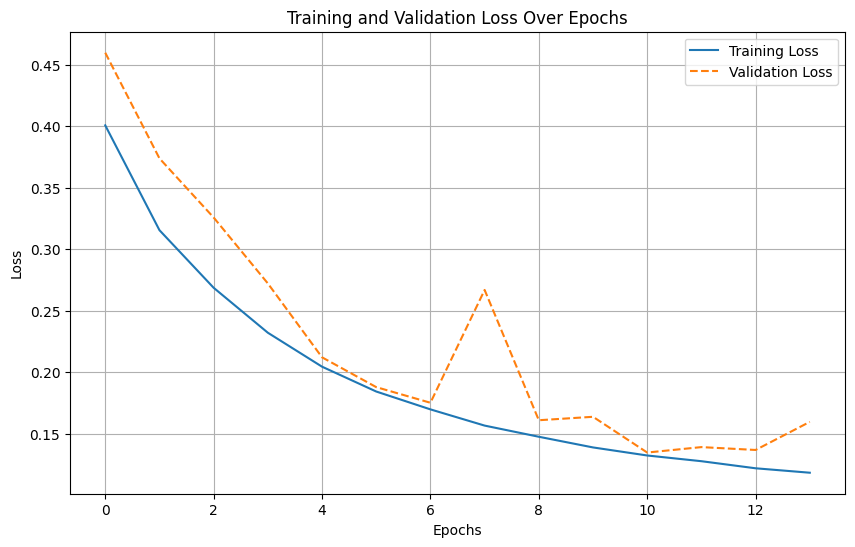

In [ ]:
import matplotlib.pyplot as plt

# Extract the loss and validation loss from the history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss values
plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss', linestyle='--')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

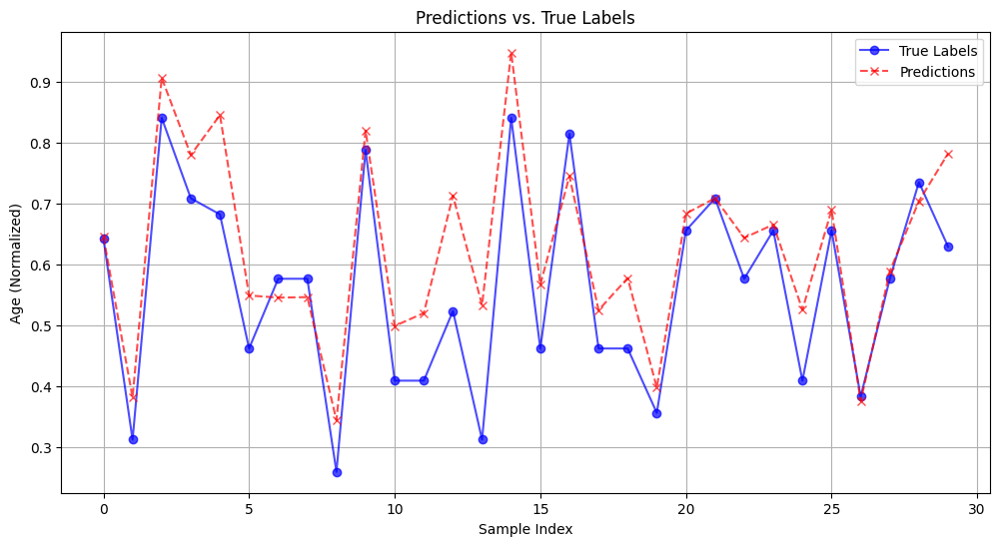

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Initialize lists to store true labels and predictions
true_labels = []
predictions = []

# Retrieve 30 images and their corresponding labels
num_samples = 30
for element in val_dataset.take(1):  # Assume `dataset` provides batches
    images = element[0][0][:num_samples]  # Take the first `num_samples` images
    genders = element[0][1][:num_samples]  # Corresponding gender inputs
    ages = element[1][:num_samples]  # Corresponding true ages

    # Iterate over the samples
    for i in range(num_samples):
        test_img = tf.expand_dims(images[i], axis=0)  # Shape: (1, 256, 256, 3)
        test_gender = tf.expand_dims(genders[i], axis=0)  # Shape: (1, 1)

        # Make a prediction
        prediction = model.predict((test_img, test_gender), verbose=0)  # Disable verbose

        # Store true label and prediction
        true_labels.append(ages[i].numpy())
        predictions.append(prediction[0][0])  # Extract the predicted value

# Plot the predictions and true labels as line plots
plt.figure(figsize=(12, 6))
plt.plot(range(num_samples), true_labels, label='True Labels', color='blue', marker='o', linestyle='-', alpha=0.7)
plt.plot(range(num_samples), predictions, label='Predictions', color='red', marker='x', linestyle='--', alpha=0.7)
plt.title('Predictions vs. True Labels')
plt.xlabel('Sample Index')
plt.ylabel('Age (Normalized)')
plt.legend()
plt.grid(True)
plt.show()


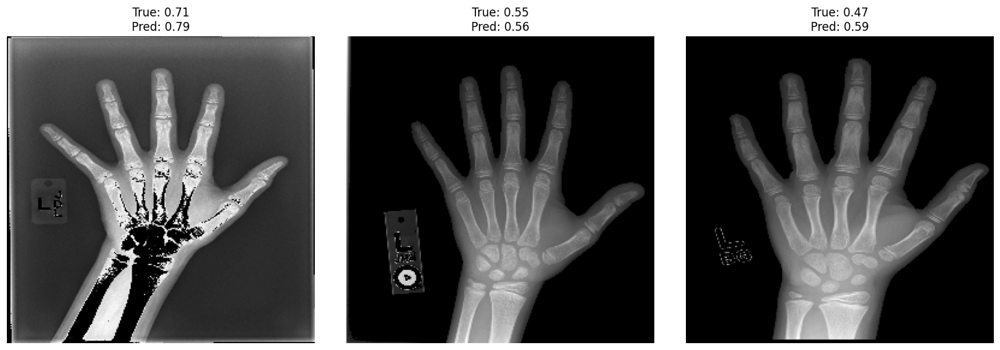

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import random

# Function to select and plot random samples
def plot_random_predictions(val_dataset, model, num_samples=3):
    # Retrieve a batch from the dataset
    for element in val_dataset.take(1):  # Assume `val_dataset` provides batches
        images = element[0][0]  # Validation images
        genders = element[0][1]  # Corresponding gender inputs
        true_labels = element[1]  # Corresponding true ages

        # Randomly select indices
        indices = random.sample(range(len(images)), num_samples)

        # Plot the selected images with true labels vs. predictions
        plt.figure(figsize=(15, 5))
        for i, idx in enumerate(indices):
            # Prepare the inputs for prediction
            test_img = tf.expand_dims(images[idx], axis=0)  # Shape: (1, 256, 256, 1)
            test_gender = tf.expand_dims(genders[idx], axis=0)  # Shape: (1, 1)

            # Make a prediction
            prediction = model.predict((test_img, test_gender), verbose=0)  # Disable verbose

            # Plot the image
            plt.subplot(1, num_samples, i + 1)
            plt.imshow(tf.squeeze(images[idx]), cmap='gray')  # Show image in grayscale
            plt.axis('off')  # Remove axes
            plt.title(f"True: {true_labels[idx].numpy():.2f}\nPred: {prediction[0][0]:.2f}", fontsize=12)

        plt.tight_layout()
        plt.show()
        break  # Exit after processing one batch

# Call the function with the validation dataset and model
plot_random_predictions(val_dataset, model)


### Training without balanced dataset

In [ ]:
#create dataset
batch_size = 32
train_dataset = create_dataset(train_clahe_dfd, batch_size, is_validation = True)
val_dataset = create_dataset(valid_clahe_dfd, batch_size, is_validation = True)


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Create the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitors the validation loss
    patience=3,          # Number of epochs with no improvement before stopping
    restore_best_weights=True  # Restore model weights from the epoch with the best value
)

# Create the model
model = create_deeper_model(input_shape_image=(256, 256, 1), input_shape_gender=(1,))

# Train the model with the early stopping callback
history = model.fit(
    train_dataset,  # Outputs ((image, gender), label)
    validation_data=val_dataset,  # Outputs ((image, gender), label)
    epochs=20,       # Set a high maximum epoch count
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping]  # Add the callback here
)


Epoch 1/20
    393/Unknown 79s 172ms/step - loss: 0.4020 - mae: 0.1449

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


393/393 ━━━━━━━━━━━━━━━━━━━━ 84s 183ms/step - loss: 0.4020 - mae: 0.1449 - val_loss: 0.3928 - val_mae: 0.1552
Epoch 2/20
393/393 ━━━━━━━━━━━━━━━━━━━━ 76s 177ms/step - loss: 0.3434 - mae: 0.1244 - val_loss: 0.3441 - val_mae: 0.1330
Epoch 3/20
393/393 ━━━━━━━━━━━━━━━━━━━━ 71s 177ms/step - loss: 0.3064 - mae: 0.1090 - val_loss: 0.3107 - val_mae: 0.1247
Epoch 4/20
393/393 ━━━━━━━━━━━━━━━━━━━━ 85s 184ms/step - loss: 0.2760 - mae: 0.0962 - val_loss: 0.4191 - val_mae: 0.2506
Epoch 5/20
393/393 ━━━━━━━━━━━━━━━━━━━━ 72s 179ms/step - loss: 0.2556 - mae: 0.0901 - val_loss: 0.2880 - val_mae: 0.1248
Epoch 6/20
393/393 ━━━━━━━━━━━━━━━━━━━━ 84s 184ms/step - loss: 0.2360 - mae: 0.0846 - val_loss: 0.2721 - val_mae: 0.1295
Epoch 7/20
393/393 ━━━━━━━━━━━━━━━━━━━━ 73s 183ms/step - loss: 0.2205 - mae: 0.0814 - val_loss: 0.3065 - val_mae: 0.1723
Epoch 8/20
393/393 ━━━━━━━━━━━━━━━━━━━━ 83s 184ms/step - loss: 0.2036 - mae: 0.0761 - val_loss: 0.2384 - val_mae: 0.1131
Epoch 9/20
393/393 ━━━━━━━━━━━━━━━━━━━━ 74s

In [ ]:
model.save('base-cnn-unbalanced.keras')

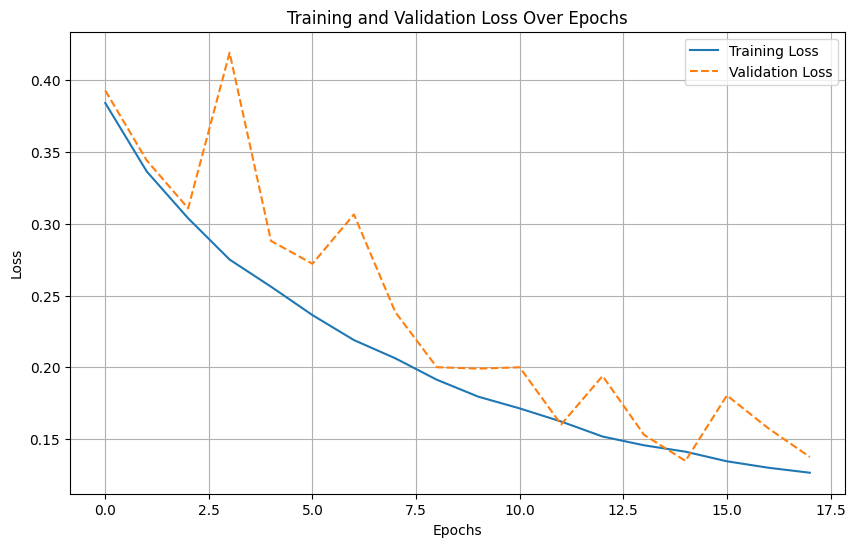

In [ ]:
import matplotlib.pyplot as plt

# Extract the loss and validation loss from the history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot the loss values
plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss', linestyle='--')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

## Training InceptionV4

In [ ]:
model = Inceptionv4_with_gender(input_shape_image = (256, 256, 1),input_shape_gender=(1,))
#optimizer = tf.keras.optimizers.SGD(learning_rate=0.005)

# Compile the model
#model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "Inceptionv4_with_gender"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 256, 256, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_stem_1th (Conv2D)    │ (None, 127, 127, 32)   │            320 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_stem_1th               │ (None, 127, 127, 32)   │            128 │ conv_stem_1th[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_48             │ (None, 127, 127, 32)   │              0 │ bn_stem_1th[0][0]      │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_stem_2nd (Conv2D)    │ (None, 125, 125, 32)   │          9,248 │ activation_48[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_stem_2nd               │ (None, 125, 125, 32)   │            128 │ conv_stem_2nd[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_49             │ (None, 125, 125, 32)   │              0 │ bn_stem_2nd[0][0]      │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_stem_3rd (Conv2D)    │ (None, 125, 125, 64)   │         18,496 │ activation_49[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_stem_3rd               │ (None, 125, 125, 64)   │            256 │ conv_stem_3rd[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_50             │ (None, 125, 125, 64)   │              0 │ bn_stem_3rd[0][0]      │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv_stem_1stbranch_2     │ (None, 62, 62, 96)     │         55,392 │ activation_50[0][0]    │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_stem_1stbranch_2       │ (None, 62, 62, 96)     │            384 │ conv_stem_1stbranch_2… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_1stbranch_1          │ (None, 62, 62, 64)     │              0 │ activation_50[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_51             │ (None, 62, 62, 96)     │              0 │ bn_stem_1stbranch_2[0… │
│ (Activation)              │                        │                │                        │
├──────────────────────

 Total params: 43,665,537 (166.57 MB)

 Trainable params: 43,602,369 (166.33 MB)

 Non-trainable params: 63,168 (246.75 KB)

In [ ]:
import time
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Create the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitors the validation loss
    patience=3,          # Number of epochs with no improvement before stopping
    restore_best_weights=True  # Restore model weights from the epoch with the best value
)

# Create the model checkpoint callback
checkpoint_path = "inception_model_checkpoint.weights.h5"  # Path to save the model checkpoint
model_checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,  # Save only the model with the best validation loss
    save_weights_only=True  # Save only the weights (not the entire model structure)
)

# Track the training time
start_time = time.time()

# Train the model with early stopping and model checkpointing
try:
    history = model.fit(
        train_dataset,  # Outputs ((image, gender), label)
        validation_data=val_dataset,  # Outputs ((image, gender), label)
        epochs=20,       # Set a high maximum epoch count
        batch_size=32,
        verbose=1,
        callbacks=[early_stopping, model_checkpoint]  # Add callbacks here
    )
except KeyboardInterrupt:
    print("Training interrupted. Model checkpoint saved.")

# Calculate and print the total training time
end_time = time.time()
total_training_time = end_time - start_time
print(f"Total training time: {total_training_time:.2f} seconds")

# To resume training if needed:
# Load the weights from the checkpoint
# model.load_weights(checkpoint_path)
# Resume training from the loaded weights


Epoch 1/20
    811/Unknown 851s 814ms/step - loss: 0.4283 - mae: 0.1617

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


811/811 ━━━━━━━━━━━━━━━━━━━━ 889s 861ms/step - loss: 0.4282 - mae: 0.1617 - val_loss: 0.3809 - val_mae: 0.1489
Epoch 2/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 593s 730ms/step - loss: 0.2843 - mae: 0.0901 - val_loss: 0.2972 - val_mae: 0.1229
Epoch 3/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 593s 730ms/step - loss: 0.2199 - mae: 0.0732 - val_loss: 0.2588 - val_mae: 0.1368
Epoch 4/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 631s 741ms/step - loss: 0.1699 - mae: 0.0616 - val_loss: 0.1705 - val_mae: 0.0767
Epoch 5/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 617s 734ms/step - loss: 0.1331 - mae: 0.0542 - val_loss: 0.1578 - val_mae: 0.0840
Epoch 6/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 637s 753ms/step - loss: 0.1061 - mae: 0.0493 - val_loss: 0.1230 - val_mae: 0.0648
Epoch 7/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 605s 731ms/step - loss: 0.0867 - mae: 0.0453 - val_loss: 0.1001 - val_mae: 0.0577
Epoch 8/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 602s 708ms/step - loss: 0.0759 - mae: 0.0435 - val_loss: 0.1029 - val_mae: 0.0657
Epoch 9/20
811/811 ━━━━━━━━━━━━━━━━

In [ ]:
model.save('inception-v4-balanced.keras')

## Training Attention-CNN

In [ ]:
model = attention_cnn(input_shape_image = (256, 256, 1),input_shape_gender=(1,))

In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20            │ (None, 256, 256, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ random_rotation_8         │ (None, 256, 256, 1)    │              0 │ input_layer_20[0][0]   │
│ (RandomRotation)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_16 (Conv2D)        │ (None, 256, 256, 32)   │            320 │ random_rotation_8[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_16    │ (None, 256, 256, 32)   │            128 │ conv2d_16[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_16 (ELU)              │ (None, 256, 256, 32)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_8           │ (None, 128, 128, 32)   │              0 │ elu_16[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_17 (Conv2D)        │ (None, 128, 128, 64)   │         18,496 │ max_pooling2d_8[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_17    │ (None, 128, 128, 64)   │            256 │ conv2d_17[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_17 (ELU)              │ (None, 128, 128, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d… │ (None, 64)             │              0 │ elu_17[0][0]           │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d_5    │ (None, 64)             │              0 │ elu_17[0][0]           │
│ (GlobalMaxPooling2D)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_10 (Dense)          │ (None, 8)              │            512 │ global_average_poolin… │
│                           │                        │                │ global_max_pooling2d_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_11 (Dense)          │ (None, 64)             │            512 │ dense_10[0][0],        │
│                           │                        │                │ dense_10[1][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_5 (Add)               │ (None, 64)             │              0 │ dense_11[0][0],        │
│                           │                        │                │ dense_11[1][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_5 (Reshape)  

 Total params: 2,184,746 (8.33 MB)

 Trainable params: 2,183,786 (8.33 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Create the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitors the validation loss
    patience=3,          # Number of epochs with no improvement before stopping
    restore_best_weights=True  # Restore model weights from the epoch with the best value
)

# Create the model
model = attention_cnn(input_shape_image=(256, 256, 1), input_shape_gender=(1,))

# Train the model with the early stopping callback
history = model.fit(
    train_dataset,  # Outputs ((image, gender), label)
    validation_data=val_dataset,  # Outputs ((image, gender), label)
    epochs=20,       # Set a high maximum epoch count
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping]  # Add the callback here
)


Epoch 1/20
    811/Unknown 238s 239ms/step - loss: 0.4243 - mae: 0.1728

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


811/811 ━━━━━━━━━━━━━━━━━━━━ 242s 244ms/step - loss: 0.4243 - mae: 0.1728 - val_loss: 0.4630 - val_mae: 0.2547
Epoch 2/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 198s 243ms/step - loss: 0.3061 - mae: 0.1126 - val_loss: 0.3916 - val_mae: 0.2085
Epoch 3/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 200s 241ms/step - loss: 0.2490 - mae: 0.0886 - val_loss: 0.2719 - val_mae: 0.1098
Epoch 4/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 196s 241ms/step - loss: 0.2092 - mae: 0.0746 - val_loss: 0.2335 - val_mae: 0.1001
Epoch 5/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 203s 242ms/step - loss: 0.1843 - mae: 0.0693 - val_loss: 0.2047 - val_mae: 0.0935
Epoch 6/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 197s 241ms/step - loss: 0.1605 - mae: 0.0615 - val_loss: 0.1894 - val_mae: 0.0860
Epoch 7/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 196s 241ms/step - loss: 0.1452 - mae: 0.0585 - val_loss: 0.1473 - val_mae: 0.0646
Epoch 8/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 198s 243ms/step - loss: 0.1308 - mae: 0.0542 - val_loss: 0.1409 - val_mae: 0.0657
Epoch 9/20
811/811 ━━━━━━━━━━━━━━━━

In [ ]:
model.save('attention_cnn.keras')

### Training Attention-CNN Clahe+Masked Dataset

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Create the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitors the validation loss
    patience=3,          # Number of epochs with no improvement before stopping
    restore_best_weights=True  # Restore model weights from the epoch with the best value
)

# Create the model
model = attention_cnn(input_shape_image=(256, 256, 1), input_shape_gender=(1,))

# Train the model with the early stopping callback
history = model.fit(
    train_dataset,  # Outputs ((image, gender), label)
    validation_data=val_dataset,  # Outputs ((image, gender), label)
    epochs=20,       # Set a high maximum epoch count
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping]  # Add the callback here
)


Epoch 1/20
    814/Unknown 207s 235ms/step - loss: 0.4496 - mae: 0.1996

/usr/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


814/814 ━━━━━━━━━━━━━━━━━━━━ 210s 239ms/step - loss: 0.4495 - mae: 0.1996 - val_loss: 0.3957 - val_mae: 0.1944
Epoch 2/20
814/814 ━━━━━━━━━━━━━━━━━━━━ 256s 240ms/step - loss: 0.3251 - mae: 0.1356 - val_loss: 0.3500 - val_mae: 0.1881
Epoch 3/20
814/814 ━━━━━━━━━━━━━━━━━━━━ 200s 237ms/step - loss: 0.2700 - mae: 0.1146 - val_loss: 0.2687 - val_mae: 0.1244
Epoch 4/20
814/814 ━━━━━━━━━━━━━━━━━━━━ 204s 240ms/step - loss: 0.2315 - mae: 0.1018 - val_loss: 0.2499 - val_mae: 0.1183
Epoch 5/20
814/814 ━━━━━━━━━━━━━━━━━━━━ 200s 237ms/step - loss: 0.2022 - mae: 0.0912 - val_loss: 0.2118 - val_mae: 0.1019
Epoch 6/20
814/814 ━━━━━━━━━━━━━━━━━━━━ 196s 240ms/step - loss: 0.1792 - mae: 0.0829 - val_loss: 0.1944 - val_mae: 0.0970
Epoch 7/20
814/814 ━━━━━━━━━━━━━━━━━━━━ 202s 240ms/step - loss: 0.1644 - mae: 0.0786 - val_loss: 0.1797 - val_mae: 0.0918
Epoch 8/20
814/814 ━━━━━━━━━━━━━━━━━━━━ 202s 240ms/step - loss: 0.1516 - mae: 0.0735 - val_loss: 0.1660 - val_mae: 0.0855
Epoch 9/20
814/814 ━━━━━━━━━━━━━━━━

## Transfer-learning ResNet50 with images only

In [ ]:
import time
from tensorflow.keras.callbacks import EarlyStopping

model = transfer_learn_resnet50_image()
# Create the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitors the validation loss
    patience=3,          # Number of epochs with no improvement before stopping
    restore_best_weights=True  # Restore model weights from the epoch with the best value
)

# Track the training time
start_time = time.time()

# Train the model with early stopping and model checkpointing

history = model.fit(
    train_dataset,  # Outputs ((image, gender), label)
    validation_data=val_dataset,  # Outputs ((image, gender), label)
    epochs=20,       # Set a high maximum epoch count
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping])  # Add callbacks here


# Calculate and print the total training time
end_time = time.time()
total_training_time = end_time - start_time
print(f"Total training time: {total_training_time:.2f} seconds")

# To resume training if needed:
# Load the weights from the checkpoint
# model.load_weights(checkpoint_path)
# Resume training from the loaded weights


Epoch 1/20
    811/Unknown 365s 368ms/step - loss: 0.0946 - mae: 0.0738

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


811/811 ━━━━━━━━━━━━━━━━━━━━ 378s 384ms/step - loss: 0.0946 - mae: 0.0738 - val_loss: 0.0649 - val_mae: 0.0514
Epoch 2/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 276s 339ms/step - loss: 0.0571 - mae: 0.0443 - val_loss: 0.0647 - val_mae: 0.0513
Epoch 3/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 275s 338ms/step - loss: 0.0502 - mae: 0.0388 - val_loss: 0.0642 - val_mae: 0.0503
Epoch 4/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 327s 343ms/step - loss: 0.0440 - mae: 0.0339 - val_loss: 0.0634 - val_mae: 0.0498
Epoch 5/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 274s 337ms/step - loss: 0.0411 - mae: 0.0317 - val_loss: 0.0614 - val_mae: 0.0481
Epoch 6/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 322s 337ms/step - loss: 0.0368 - mae: 0.0283 - val_loss: 0.0601 - val_mae: 0.0468
Epoch 7/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 275s 337ms/step - loss: 0.0345 - mae: 0.0264 - val_loss: 0.0614 - val_mae: 0.0477
Epoch 8/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 322s 337ms/step - loss: 0.0331 - mae: 0.0254 - val_loss: 0.0616 - val_mae: 0.0484
Epoch 9/20
811/811 ━━━━━━━━━━━━━━━━

In [ ]:
model.save('saved_models/resnet50_images_only.keras')

## Transfer-learning ResNet50

In [ ]:
# Example usage
model = transfer_learn_resnet50()
model.summary()



94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 256, 256, 3)    │              0 │ input_layer_1[0][0],   │
│                           │                        │                │ input_layer_1[0][0],   │
│                           │                        │                │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ resnet50 (Functional)     │ (None, 8, 8, 2048)     │     23,587,712 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d  │ (None, 2048)           │              0 │ resnet50[0][0]         │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 512)            │      1,049,088 │ global_average_poolin… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_2             │ (None, 1)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 512)            │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 64)             │            128 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 576)            │              0 │ dropout[0][0],         │
│ (Concatenate)             │                        │                │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1024)           │        590,848 │ concatenate_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 1024)           │              0 │ dense_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 1024)           │      1,049,600 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 1)              │          1,025 │ dense_3[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 26,278,401 (100.24 MB)

 Trainable params: 2,690,689 (10.26 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
# Ensure the base model is frozen
base_model = model.get_layer('resnet50')  # Get the base ResNet50 layer
base_model.trainable = False  # Keep the base model frozen for transfer learning

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),  # Learning rate for added layers
    loss=rmse_loss,
    metrics=['mae']
)

# Create the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',       # Monitor validation loss
    patience=3,               # Stop after 3 epochs with no improvement
    restore_best_weights=True # Restore the best model weights
)

# Train the model
history = model.fit(
    train_dataset,  # ((image, gender), label)
    validation_data=val_dataset,  # ((image, gender), label)
    epochs=20,  # Train for a reasonable number of epochs
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping]  # Add early stopping
)

Epoch 1/20
    811/Unknown 107s 103ms/step - loss: 0.6852 - mae: 0.5055

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


811/811 ━━━━━━━━━━━━━━━━━━━━ 121s 120ms/step - loss: 0.6852 - mae: 0.5055 - val_loss: 0.4927 - val_mae: 0.4442
Epoch 2/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 119s 103ms/step - loss: 0.5719 - mae: 0.4840 - val_loss: 0.2735 - val_mae: 0.2340
Epoch 3/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 85s 103ms/step - loss: 0.1432 - mae: 0.1024 - val_loss: 0.1010 - val_mae: 0.0723
Epoch 4/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 142s 102ms/step - loss: 0.0959 - mae: 0.0660 - val_loss: 0.1071 - val_mae: 0.0780
Epoch 5/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 85s 103ms/step - loss: 0.0883 - mae: 0.0610 - val_loss: 0.1007 - val_mae: 0.0735
Epoch 6/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 89s 108ms/step - loss: 0.0851 - mae: 0.0586 - val_loss: 0.0970 - val_mae: 0.0714
Epoch 7/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 137s 102ms/step - loss: 0.0835 - mae: 0.0575 - val_loss: 0.0951 - val_mae: 0.0675
Epoch 8/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 141s 102ms/step - loss: 0.0833 - mae: 0.0569 - val_loss: 0.0964 - val_mae: 0.0693
Epoch 9/20
811/811 ━━━━━━━━━━━━━━━━━━━

In [ ]:
model.save('Resnet50-transfer-learning.keras')

## Transfer-learning ResNet50 Lower layers

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Get the base ResNet50 layer
base_model = model.get_layer('resnet50')

# Unfreeze lower layers for fine-tuning
for layer in base_model.layers[:10]:  # Adjust the range as needed
    layer.trainable = True  # Unfreeze the first 10 layers (example)

# Keep other layers frozen
for layer in base_model.layers[10:]:
    layer.trainable = False

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-5),  # Lower learning rate for fine-tuning
    loss=rmse_loss,
    metrics=['mae']
)

# Create the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',       # Monitor validation loss
    patience=3,               # Stop after 3 epochs with no improvement
    restore_best_weights=True # Restore the best model weights
)

# Train the model
history = model.fit(
    train_dataset,  # ((image, gender), label)
    validation_data=val_dataset,  # ((image, gender), label)
    epochs=20,  # Train for a reasonable number of epochs
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping]  # Add early stopping
)


Epoch 1/20
    811/Unknown 196s 211ms/step - loss: 0.1064 - mae: 0.0743

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


811/811 ━━━━━━━━━━━━━━━━━━━━ 207s 225ms/step - loss: 0.1064 - mae: 0.0743 - val_loss: 0.1045 - val_mae: 0.0739
Epoch 2/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 171s 205ms/step - loss: 0.0945 - mae: 0.0649 - val_loss: 0.1023 - val_mae: 0.0741
Epoch 3/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 201s 204ms/step - loss: 0.0913 - mae: 0.0627 - val_loss: 0.0951 - val_mae: 0.0677
Epoch 4/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 201s 204ms/step - loss: 0.0878 - mae: 0.0608 - val_loss: 0.0979 - val_mae: 0.0707
Epoch 5/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 166s 203ms/step - loss: 0.0854 - mae: 0.0591 - val_loss: 0.0911 - val_mae: 0.0654
Epoch 6/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 171s 210ms/step - loss: 0.0842 - mae: 0.0582 - val_loss: 0.0907 - val_mae: 0.0650
Epoch 7/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 166s 203ms/step - loss: 0.0826 - mae: 0.0571 - val_loss: 0.0913 - val_mae: 0.0664
Epoch 8/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 203s 204ms/step - loss: 0.0816 - mae: 0.0562 - val_loss: 0.0903 - val_mae: 0.0646
Epoch 9/20
811/811 ━━━━━━━━━━━━━━━━

In [ ]:
#model summary
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 256, 256, 3)    │              0 │ input_layer_1[0][0],   │
│                           │                        │                │ input_layer_1[0][0],   │
│                           │                        │                │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ resnet50 (Functional)     │ (None, 8, 8, 2048)     │     23,587,712 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d  │ (None, 2048)           │              0 │ resnet50[0][0]         │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 512)            │      1,049,088 │ global_average_poolin… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_2             │ (None, 1)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 512)            │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 64)             │            128 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 576)            │              0 │ dropout[0][0],         │
│ (Concatenate)             │                        │                │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1024)           │        590,848 │ concatenate_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 1024)           │              0 │ dense_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 1024)           │      1,049,600 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 1)              │          1,025 │ dense_3[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 31,687,557 (120.88 MB)

 Trainable params: 2,704,577 (10.32 MB)

 Non-trainable params: 23,573,824 (89.93 MB)

 Optimizer params: 5,409,156 (20.63 MB)

In [ ]:
model.save('Resnet50-transfer-learning-lower-layers.keras')

## Training Carpal Bone method

In [ ]:
# Instantiate the model
model = create_carpal_model(input_shape_image=(102, 102, 1), input_shape_gender=(1,))

model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 102, 102, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ random_rotation_1         │ (None, 102, 102, 1)    │              0 │ input_layer_2[0][0]    │
│ (RandomRotation)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 102, 102, 32)   │            320 │ random_rotation_1[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 102, 102, 32)   │            128 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_4 (ELU)               │ (None, 102, 102, 32)   │              0 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 51, 51, 32)     │              0 │ elu_4[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 51, 51, 64)     │         18,496 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 51, 51, 64)     │            256 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_5 (ELU)               │ (None, 51, 51, 64)     │              0 │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5           │ (None, 25, 25, 64)     │              0 │ elu_5[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 25, 25, 128)    │         73,856 │ max_pooling2d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_6     │ (None, 25, 25, 128)    │            512 │ conv2d_6[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ elu_6 (ELU)               │ (None, 25, 25, 128)    │              0 │ batch_normalization_6… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 12, 12, 128)    │              0 │ elu_6[0][0]            │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 12, 12, 256)    │        295,168 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7

 Total params: 2,162,945 (8.25 MB)

 Trainable params: 2,161,985 (8.25 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
#creating cropped dataset
def load_image(img_path):
    # Load PNG image lazily and decode it as grayscale
    img = tf.io.read_file(img_path)

    img = tf.image.decode_png(img, channels=1)  # Grayscale (1 channel)
    img = custom_crop(img)
    return img

def preprocess_image_carpal(img, sex, label):
    # new_img,sex,label = custom_crop(img,sex, label)

    # Return the processed image and label
    return (img, tf.expand_dims(sex, axis=-1)), label  # Ensure `sex` has shape (1,)


def augment_image(img, sex, label, aug_rot_range):

    # img = tf.image.convert_image_dtype(img, dtype=tf.float32)

    # Apply augmentations (e.g., random rotations)
    img = tf.image.random_flip_left_right(img)

    # # Add Gaussian noise
    # noise = tf.random.normal(shape=tf.shape(img), mean=0.0, stddev=0.1, dtype=img.dtype)
    # img = img + noise
    # img = tf.clip_by_value(img, 0.0, 1.0)  # Ensure pixel values stay in [0, 1]

    inputs = (img, tf.expand_dims(sex, axis=-1))  # Combine image and sex into inputs
    return inputs, label

def custom_crop(image):
    # Unpack the tuple (image, gender, label)
    # Get the original image dimensions
    height, width = 256,256

    # Calculate the crop boundaries based on percentages
    left_crop = tf.cast(0.3 * width, tf.int32)
    right_crop = tf.cast(0.7 * width, tf.int32)
    top_crop = tf.cast(0.5 * height, tf.int32)
    bottom_crop = tf.cast(0.9 * height, tf.int32)


    # Crop the image (assuming image is [height, width, channels])
    cropped_image = image[top_crop:bottom_crop, left_crop:right_crop]


    cropped_image = tf.image.resize(cropped_image, (102, 102))


    # Return the tuple (cropped_image, gender) and the original label
    return cropped_image


def load_and_preprocess_carpal(img_path, sex, label, aug_num, aug_rot_range, is_validation=False):
    # Load the image
    img = load_image(img_path)

    # Preprocess the image
    inputs, label = preprocess_image_carpal(img, sex, label)

    if is_validation:
        # For validation, wrap the tuple in a single-element Dataset
        return tf.data.Dataset.from_tensors((inputs, label))



    # Create multiple augmentations for training
    def augment_fn(_):
        return augment_image(img, sex, label, aug_rot_range)

    augmentations_ds = tf.data.Dataset.range(aug_num).map(augment_fn)
    return augmentations_ds

def create_dataset_carpal(df, batch_size, is_validation = False, shuffle=True):
    img_paths = df['img_path'].values
    labels = df['boneage'].values
    sexes = df['male'].values
    aug_nums = None
    if is_validation:
      aug_nums = np.zeros(len(labels))
    else:
      aug_nums = df['augmentations_needed'].values

    # Create a Dataset object from the metadata
    metadata_ds = tf.data.Dataset.from_tensor_slices((img_paths, sexes, labels, aug_nums))

    # Load and preprocess images lazily
    dataset = metadata_ds.flat_map(
        lambda img_path, sex, label, aug_num: load_and_preprocess_carpal(img_path, sex, label, aug_num, aug_rot_range=10,is_validation = is_validation)
    )

    # Shuffle if needed
    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)

    # Batch the dataset
    dataset = dataset.batch(batch_size=batch_size)

    # Prefetch for performance
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

In [ ]:
#create dataset
batch_size = 32
train_dataset_carpal = create_dataset_carpal(train_clahe_dfd, batch_size)
val_dataset_carpal = create_dataset_carpal(valid_clahe_dfd, batch_size, is_validation = True)
test_dataset_carpal = create_dataset_carpal(test_clahe_dfd, batch_size, is_validation = True)

Image Batch Shape: (32, 102, 102, 1)
Gender Batch Shape: (32, 1)
Label Batch Shape: (32,)


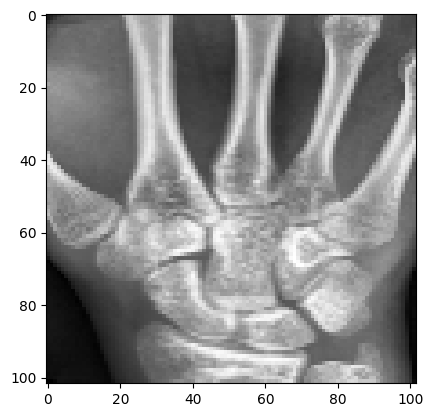

tf.Tensor([ True], shape=(1,), dtype=bool)
tf.Tensor(0.947136563876652, shape=(), dtype=float64)


In [ ]:
#test images in dataset
for element in train_dataset_carpal.take(1):
    images = element[0][0]
    genders = element[0][1]
    labels = element[1]
    print("Image Batch Shape:", images.shape)
    print("Gender Batch Shape:", genders.shape)
    print("Label Batch Shape:", labels.shape)

    plt.imshow(images[1],cmap='gray')
    plt.show()
    print(genders[1])
    print(labels[1])

In [ ]:
import time
from tensorflow.keras.callbacks import EarlyStopping

# Create the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitors the validation loss
    patience=3,          # Number of epochs with no improvement before stopping
    restore_best_weights=True  # Restore model weights from the epoch with the best value
)

# Track the training time
start_time = time.time()

# Train the model with early stopping and model checkpointing

history = model.fit(
    train_dataset_carpal,  # Outputs ((image, gender), label)
    validation_data=val_dataset_carpal,  # Outputs ((image, gender), label)
    epochs=20,       # Set a high maximum epoch count
    batch_size=32,
    verbose=1,
    callbacks=[early_stopping])  # Add callbacks here


# Calculate and print the total training time
end_time = time.time()
total_training_time = end_time - start_time
print(f"Total training time: {total_training_time:.2f} seconds")




Epoch 1/20
    811/Unknown 36s 44ms/step - loss: 0.3328 - mae: 0.1169

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


811/811 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step - loss: 0.3328 - mae: 0.1169 - val_loss: 0.3299 - val_mae: 0.1324
Epoch 2/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.2787 - mae: 0.0960 - val_loss: 0.3069 - val_mae: 0.1274
Epoch 3/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 38s 46ms/step - loss: 0.2433 - mae: 0.0853 - val_loss: 0.2300 - val_mae: 0.0841
Epoch 4/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step - loss: 0.2114 - mae: 0.0757 - val_loss: 0.2193 - val_mae: 0.0910
Epoch 5/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step - loss: 0.1913 - mae: 0.0718 - val_loss: 0.1982 - val_mae: 0.0877
Epoch 6/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1699 - mae: 0.0657 - val_loss: 0.2018 - val_mae: 0.1025
Epoch 7/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 37s 44ms/step - loss: 0.1556 - mae: 0.0632 - val_loss: 0.1624 - val_mae: 0.0741
Epoch 8/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/step - loss: 0.1432 - mae: 0.0603 - val_loss: 0.1579 - val_mae: 0.0763
Epoch 9/20
811/811 ━━━━━━━━━━━━━━━━━━━━ 37s 45ms/st

In [ ]:
model.save('saved_models/cnn_carpal.keras')

# Performance Assessment

## Test dataset and plot function

In [ ]:
# load test dataset
test_clahe_dfd["img_path"] = test_clahe_dfd["img_path"].str.replace(r".*?preprocess", "/content/datasets", regex=True)
test_clahe_dfd["img_path"] =test_clahe_dfd["img_path"].str.replace(r".*?preprocess", "/content/datasets", regex=True)

NameError: name 'test_clahe_dfd' is not defined

In [ ]:
test_clahe_dfd

,img_path,boneage,male
0,/content/datasets/test_clahe/4458.png,0.528499,True
1,/content/datasets/test_clahe/4452.png,0.688614,True
2,/content/datasets/test_clahe/4454.png,0.611174,True
3,/content/datasets/test_clahe/4548.png,0.665547,False
4,/content/datasets/test_clahe/4495.png,0.394799,False
...,...,...,...
195,/content/datasets/test_clahe/4547.png,0.784683,False
196,/content/datasets/test_clahe/4474.png,0.638126,False
197,/content/datasets/test_clahe/4496.png,0.705388,False
198,/content/datasets/test_clahe/4538.png,0.424532,False


In [ ]:
#create dataset
batch_size = 32
test_dataset = create_dataset(test_clahe_dfd, batch_size, is_validation = True)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from sklearn.metrics import mean_absolute_error

def plot_predictions_with_images(dataset, model, rescale_params=None):
    """
    Generates predictions and true labels from the given dataset using the provided model.
    Calculates MAE and:
    1. Plots normalized predictions vs true labels.
    2. Plots rescaled predictions vs true labels (if rescale_params is provided).
    3. Displays three random images with true and predicted ages.

    Args:
        dataset: The test dataset.
        model: The trained TensorFlow model for prediction.
        rescale_params: A tuple (min_label, max_label) for rescaling predictions and true labels.

    Returns:
        None
    """
    # Initialize lists to store true labels, predictions, and images
    true_labels = []
    predictions = []
    image_samples = []
    gender_samples = []

    # Helper function for rescaling
    def rescale(value, min_label, max_label):
        return value * (max_label - min_label) + min_label

    # Generate predictions and collect data
    for element in dataset:
        images = element[0][0]  # Image inputs
        genders = element[0][1]  # Gender inputs
        ages = element[1]  # True age labels

        for i in range(len(images)):
            test_img = tf.expand_dims(images[i], axis=0)  # Shape: (1, 256, 256, 3)
            test_gender = tf.expand_dims(genders[i], axis=0)  # Shape: (1, 1)

            # Make a prediction
            prediction = model.predict((test_img, test_gender), verbose=0)

            # Store true label, prediction, and sample data
            true_labels.append(ages[i].numpy())
            predictions.append(prediction[0][0])
            image_samples.append(images[i].numpy())
            gender_samples.append(genders[i].numpy())

    # Calculate Mean Absolute Error (MAE)
    mae_score = mean_absolute_error(true_labels, predictions)
    print(f"Mean Absolute Error (MAE) [Scaled]: {mae_score}")

    # Plot 1: Normalized Predictions vs True Labels
    subset_indices = np.random.choice(len(true_labels), size=int(0.2 * len(true_labels)), replace=False)
    subset_indices.sort()  # Optional: Keep subset in order
    true_labels_subset = [true_labels[i] for i in subset_indices]
    predictions_subset = [predictions[i] for i in subset_indices]

    plt.figure(figsize=(12, 6))
    plt.plot(range(len(true_labels_subset)), true_labels_subset, label='True Labels', color='blue', marker='o', linestyle='-', alpha=0.7)
    plt.plot(range(len(predictions_subset)), predictions_subset, label='Predictions', color='red', marker='x', linestyle='--', alpha=0.7)
    plt.title('Predictions vs. True Labels (Scaled)')
    plt.xlabel('Sample Index (Subset)')
    plt.ylabel('Age (Scaled)')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Rescale true labels and predictions if rescale_params is provided
    if rescale_params:
        min_label, max_label = rescale_params
        true_labels_rescaled = [rescale(label, min_label, max_label) for label in true_labels]
        predictions_rescaled = [rescale(pred, min_label, max_label) for pred in predictions]

        # Calculate MAE for rescaled values
        mae_rescaled = mean_absolute_error(true_labels_rescaled, predictions_rescaled)
        print(f"Mean Absolute Error (MAE) [Rescaled]: {mae_rescaled}")

        # Plot 2: Rescaled Predictions vs True Labels
        true_labels_rescaled_subset = [true_labels_rescaled[i] for i in subset_indices]
        predictions_rescaled_subset = [predictions_rescaled[i] for i in subset_indices]

        plt.figure(figsize=(12, 6))
        plt.plot(range(len(true_labels_rescaled_subset)), true_labels_rescaled_subset, label='True Labels', color='blue', marker='o', linestyle='-', alpha=0.7)
        plt.plot(range(len(predictions_rescaled_subset)), predictions_rescaled_subset, label='Predictions', color='red', marker='x', linestyle='--', alpha=0.7)
        plt.title('Predictions vs. True Labels (months)')
        plt.xlabel('Sample Index (Subset)')
        plt.ylabel('Age (months)')
        plt.legend()
        plt.grid(True)
        plt.show()

    # Display 3 random images with true and predicted ages
    random_indices = np.random.choice(len(image_samples), size=3, replace=False)

    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(random_indices):
        img = image_samples[idx]
        true_age = true_labels[idx]
        predicted_age = predictions[idx]

        # Display image
        plt.subplot(1, 3, i + 1)
        plt.imshow(img.astype("uint8"),cmap='grey')  # Ensure image is in the correct format
        plt.axis("off")

        # Display true and predicted ages
        plt.title(f"True: {true_age:.3f} months\nPredicted: {predicted_age:.3f} months", fontsize= 18)

    plt.tight_layout()
    plt.show()


In [ ]:
saved_models_dir = os.path.join(current_path,"saved_models/")

## Base CNN (4layer) - carpal - balanced

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

model = tf.keras.models.load_model(saved_models_dir + "cnn_carpal.keras", custom_objects={'rmse_loss':rmse_loss})

In [ ]:
plot_predictions_with_images(test_dataset_carpal, model, rescale_params=(min_label, max_label))

NameError: name 'test_dataset_carpal' is not defined

## Base CNN (4layer) -carpal + normal

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

carpal_model = tf.keras.models.load_model(saved_models_dir + 'cnn_carpal.keras', custom_objects={'rmse_loss':rmse_loss})
cnn_model = tf.keras.models.load_model(saved_models_dir + 'base_cnn_balanced.keras', custom_objects={'rmse_loss':rmse_loss})



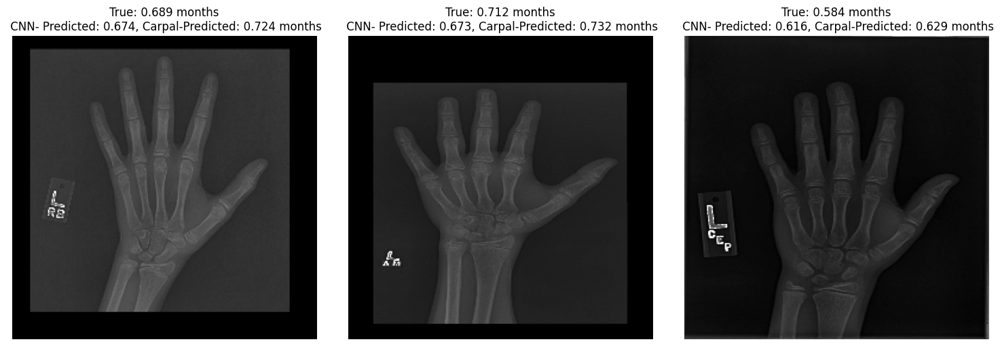

In [ ]:
# Initialize lists to store true labels, predictions, and images
true_labels = []
predictions_cnn = []
predictions_carpal = []
image_samples = []
gender_samples = []

# Helper function for rescaling
def rescale(value, min_label, max_label):
    return value * (max_label - min_label) + min_label

# Generate predictions and collect data
for element in test_dataset:
    images = element[0][0]  # Image inputs
    genders = element[0][1]  # Gender inputs
    ages = element[1]  # True age labels



    for i in range(len(images)):
        test_img = tf.expand_dims(images[i], axis=0)  # Shape: (1, 256, 256, 3)
        test_img_carpal = tf.expand_dims(custom_crop(images[i]), axis=0)  # Shape: (1, 256, 256, 3)
        test_gender = tf.expand_dims(genders[i], axis=0)  # Shape: (1, 1)

        # Make a prediction
        cnn_prediction = cnn_model.predict((test_img, test_gender), verbose=0)
        carpal_prediction = carpal_model.predict((test_img_carpal, test_gender), verbose=0)

        # Store true label, prediction, and sample data
        true_labels.append(ages[i].numpy())
        predictions_cnn.append(cnn_prediction[0][0])
        predictions_carpal.append(carpal_prediction[0][0])
        image_samples.append(images[i].numpy())
        gender_samples.append(genders[i].numpy())

random_indices = np.random.choice(len(image_samples), size=3, replace=False)

plt.figure(figsize=(15, 5))
for i, idx in enumerate(random_indices):
    img = image_samples[idx]
    true_age = true_labels[idx]
    cnn_predicted_age = predictions_cnn[idx]
    carpal_predicted_age = predictions_carpal[idx]

    # Display image
    plt.subplot(1, 3, i + 1)
    plt.imshow(img.astype("uint8"),cmap='grey')  # Ensure image is in the correct format
    plt.axis("off")

    # Display true and predicted ages
    plt.title(f"True: {true_age:.3f} months\n CNN- Predicted: {cnn_predicted_age:.3f}, Carpal-Predicted: {carpal_predicted_age:.3f} months")

plt.tight_layout()
plt.show()


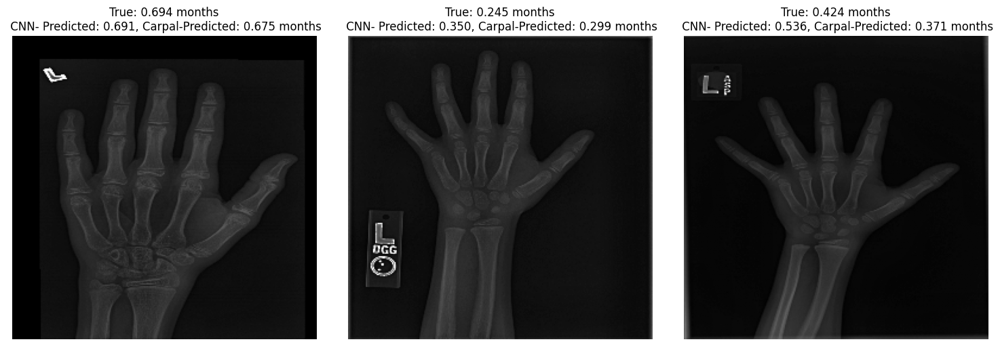

In [ ]:
# Initialize lists to store true labels, predictions, and images
true_labels = []
predictions_cnn = []
predictions_carpal = []
image_samples = []
gender_samples = []

# Helper function for rescaling
def rescale(value, min_label, max_label):
    return value * (max_label - min_label) + min_label

# Generate predictions and collect data
for element in test_dataset:
    images = element[0][0]  # Image inputs
    genders = element[0][1]  # Gender inputs
    ages = element[1]  # True age labels



    for i in range(len(images)):
        test_img = tf.expand_dims(images[i], axis=0)  # Shape: (1, 256, 256, 3)
        test_img_carpal = tf.expand_dims(custom_crop(images[i]), axis=0)  # Shape: (1, 256, 256, 3)
        test_gender = tf.expand_dims(genders[i], axis=0)  # Shape: (1, 1)

        # Make a prediction
        cnn_prediction = cnn_model.predict((test_img, test_gender), verbose=0)
        carpal_prediction = carpal_model.predict((test_img_carpal, test_gender), verbose=0)

        # Store true label, prediction, and sample data
        true_labels.append(ages[i].numpy())
        predictions_cnn.append(cnn_prediction[0][0])
        predictions_carpal.append(carpal_prediction[0][0])
        image_samples.append(images[i].numpy())
        gender_samples.append(genders[i].numpy())

random_indices = np.random.choice(len(image_samples), size=3, replace=False)

plt.figure(figsize=(15, 5))
for i, idx in enumerate(random_indices):
    img = image_samples[idx]
    true_age = true_labels[idx]
    cnn_predicted_age = predictions_cnn[idx]
    carpal_predicted_age = predictions_carpal[idx]

    # Display image
    plt.subplot(1, 3, i + 1)
    plt.imshow(img.astype("uint8"),cmap='grey')  # Ensure image is in the correct format
    plt.axis("off")

    # Display true and predicted ages
    plt.title(f"True: {true_age:.3f} months\n CNN- Predicted: {cnn_predicted_age:.3f}, Carpal-Predicted: {carpal_predicted_age:.3f} months")

plt.tight_layout()
plt.show()


In [ ]:
def dec_fus_cnn_and_carpal(test_dataset, cnn_model, carpal_model, carpal_weight=0.5, threshold=0.667, plot=True):
    """
    Function to predict ages using CNN and Carpal models with decision fusion.
    Parameters:
        - test_dataset: Dataset to evaluate
        - cnn_model: Pre-trained CNN model
        - carpal_model: Pre-trained Carpal bone model
        - carpal_weight: Weight for the Carpal model prediction
        - threshold: Threshold to decide when to include Carpal model prediction
        - plot: If True, display random sample predictions
    Returns:
        - mean_absolute_error: Mean absolute error of the predictions
    """
    true_labels = []
    fused_predictions = []
    predictions_cnn = []
    predictions_carpal = []
    image_samples = []
    gender_samples = []

    for element in test_dataset:
        images = element[0][0]
        genders = element[0][1]
        ages = element[1]

        for i in range(len(images)):
            test_img = tf.expand_dims(images[i], axis=0)
            test_img_carpal = tf.expand_dims(custom_crop(images[i]), axis=0)
            test_gender = tf.expand_dims(genders[i], axis=0)

            # Make predictions
            cnn_prediction = cnn_model.predict((test_img, test_gender), verbose=0)[0][0]
            carpal_prediction = carpal_model.predict((test_img_carpal, test_gender), verbose=0)[0][0]

            # Decision fusion
            if cnn_prediction >= threshold:
                fused_prediction = (1 - carpal_weight) * cnn_prediction + carpal_weight * carpal_prediction
            else:
                fused_prediction = cnn_prediction

            # Collect predictions and true labels
            true_labels.append(ages[i].numpy())
            predictions_cnn.append(cnn_prediction)
            predictions_carpal.append(carpal_prediction)
            fused_predictions.append(fused_prediction)
            image_samples.append(images[i].numpy())
            gender_samples.append(genders[i].numpy())

    # Calculate Mean Absolute Error (MAE)
    true_labels = np.array(true_labels)
    fused_predictions = np.array(fused_predictions)
    mean_absolute_error = np.mean(np.abs(true_labels - fused_predictions))

    if plot:
        # Display some random predictions
        random_indices = np.random.choice(len(image_samples), size=3, replace=False)

        plt.figure(figsize=(15, 5))
        for i, idx in enumerate(random_indices):
            img = image_samples[idx]
            true_age = true_labels[idx]
            cnn_predicted_age = predictions_cnn[idx]
            carpal_predicted_age = predictions_carpal[idx]
            fused_predicted_age = fused_predictions[idx]

            # Display image
            plt.subplot(1, 3, i + 1)
            plt.imshow(img.astype("uint8"), cmap='gray')
            plt.axis("off")

            # Display true and predicted ages
            plt.title(f"True: {true_age:.3f} months\n"
                      f"CNN: {cnn_predicted_age:.3f}\n"
                      f"Carpal: {carpal_predicted_age:.3f}\n"
                      f"Fused: {fused_predicted_age:.3f}", fontsize=18)

        plt.tight_layout()
        plt.show()

    return mean_absolute_error


In [ ]:
import time
import tensorflow as tf

def dec_fus_cnn_and_carpal_single_image(test_img, test_gender, cnn_model, carpal_model, carpal_weight=0.3, threshold=0.5):
    """
    Function to predict age using CNN and Carpal models with decision fusion for a single image.
    Parameters:
        - test_img: Single image to predict (shape: (height, width, channels))
        - test_gender: Gender of the individual (shape: (1,))
        - cnn_model: Pre-trained CNN model
        - carpal_model: Pre-trained Carpal bone model
        - carpal_weight: Weight for the Carpal model prediction
        - threshold: Threshold to decide when to include Carpal model prediction
    Returns:
        - fused_prediction: The final fused prediction for the input image
        - inference_time: Time it took to calculate the predictions
    """
    # Expand dimensions of the input to match the model input shape (batch size of 1)
    test_img_carpal = tf.expand_dims(custom_crop(test_img), axis=0)
    test_img = tf.expand_dims(test_img, axis=0)
    test_gender = tf.expand_dims(test_gender, axis=0)

    # Measure inference time

    # Make predictions
    cnn_prediction = cnn_model.predict((test_img, test_gender), verbose=0)[0][0]
    carpal_prediction = carpal_model.predict((test_img_carpal, test_gender), verbose=0)[0][0]

    # Decision fusion
    if cnn_prediction >= threshold:
        fused_prediction = (1 - carpal_weight) * cnn_prediction + carpal_weight * carpal_prediction
    else:
        fused_prediction = cnn_prediction

    # Calculate inference time


    # Print the prediction
    print(f"Fused Prediction: {fused_prediction:.4f}")


    return fused_prediction


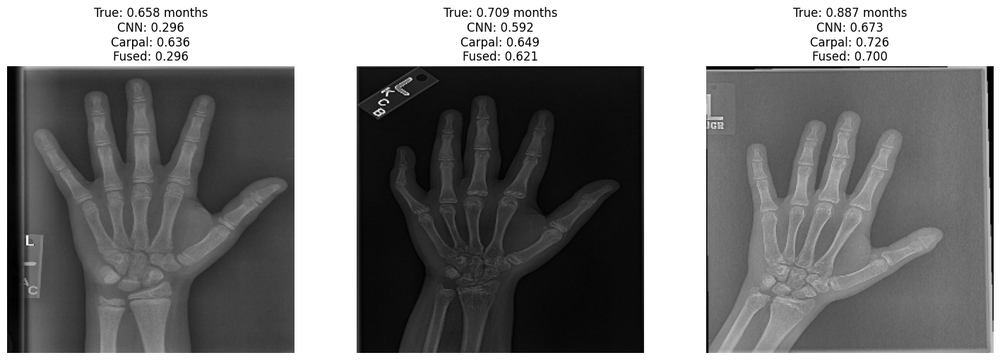

Mean Absolute Error: 0.070


In [ ]:
#Assuming `test_dataset`, `cnn_model`, and `carpal_model` are defined and loaded
mean_error = dec_fus_cnn_and_carpal(test_dataset, cnn_model, carpal_model, threshold = 0.5, carpal_weight=0.5 )
print(f"Mean Absolute Error: {mean_error:.3f}")

Grid search for best decision fusion mechanism

In [ ]:
def grid_search_threshold_weight(test_dataset, cnn_model, carpal_model, thresholds, carpal_weights):
    """
    Perform a grid search over threshold and carpal_weight to find the best parameters.
    Parameters:
        - test_dataset: Dataset to evaluate
        - cnn_model: Pre-trained CNN model
        - carpal_model: Pre-trained Carpal bone model
        - thresholds: List of thresholds to evaluate
        - carpal_weights: List of carpal weights to evaluate
    Returns:
        - best_params: Dictionary with the best threshold, carpal_weight, and the corresponding MAE
    """
    best_mae = float('inf')
    best_params = {'threshold': None, 'carpal_weight': None, 'mae': None}

    for threshold in thresholds:
        for carpal_weight in carpal_weights:
            print(f"Evaluating threshold={threshold:.3f}, carpal_weight={carpal_weight:.3f}...")
            mae = dec_fus_cnn_and_carpal(test_dataset, cnn_model, carpal_model,
                                         carpal_weight=carpal_weight, threshold=threshold, plot=False)
            print(f"MAE: {mae:.3f}")

            if mae < best_mae:
                best_mae = mae
                best_params = {'threshold': threshold, 'carpal_weight': carpal_weight, 'mae': mae}

    return best_params


In [ ]:
# Define grid search parameters
thresholds = np.linspace(0.3, 0.7, 5)  # Generates 5 values between 0.3 and 0.7
carpal_weights = np.linspace(0.3, 0.7, 5)  # Generates 5 values between 0.3 and 0.7
# Perform grid search
best_params = grid_search_threshold_weight(test_dataset, cnn_model, carpal_model, thresholds, carpal_weights)

# Output best parameters
print(f"Best Parameters:\nThreshold: {best_params['threshold']}\nCarpal Weight: {best_params['carpal_weight']}\nMAE: {best_params['mae']:.3f}")


Evaluating threshold=0.300, carpal_weight=0.300...
MAE: 0.072
Evaluating threshold=0.300, carpal_weight=0.400...
MAE: 0.071
Evaluating threshold=0.300, carpal_weight=0.500...
MAE: 0.069
Evaluating threshold=0.300, carpal_weight=0.600...
MAE: 0.069
Evaluating threshold=0.300, carpal_weight=0.700...
MAE: 0.069
Evaluating threshold=0.400, carpal_weight=0.300...
MAE: 0.073
Evaluating threshold=0.400, carpal_weight=0.400...
MAE: 0.071
Evaluating threshold=0.400, carpal_weight=0.500...
MAE: 0.070
Evaluating threshold=0.400, carpal_weight=0.600...
MAE: 0.070
Evaluating threshold=0.400, carpal_weight=0.700...
MAE: 0.070
Evaluating threshold=0.500, carpal_weight=0.300...
MAE: 0.073
Evaluating threshold=0.500, carpal_weight=0.400...
MAE: 0.072
Evaluating threshold=0.500, carpal_weight=0.500...
MAE: 0.070
Evaluating threshold=0.500, carpal_weight=0.600...
MAE: 0.070
Evaluating threshold=0.500, carpal_weight=0.700...
MAE: 0.069
Evaluating threshold=0.600, carpal_weight=0.300...
MAE: 0.076
Evaluati

## Base CNN (4layer) - balanced

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

model = tf.keras.models.load_model(saved_models_dir + 'base-cnn-balanced.keras', custom_objects={'rmse_loss':rmse_loss})

ValueError: File not found: filepath=/content/drive/.shortcut-targets-by-id/1SdnBZOzsEir7hBdU_PsKhixJYL4F6ZI4/ML_HD_C2/saved_models/base-cnn-balanced.keras. Please ensure the file is an accessible `.keras` zip file.

Mean Absolute Error (MAE) [Scaled]: 0.07927769152140515


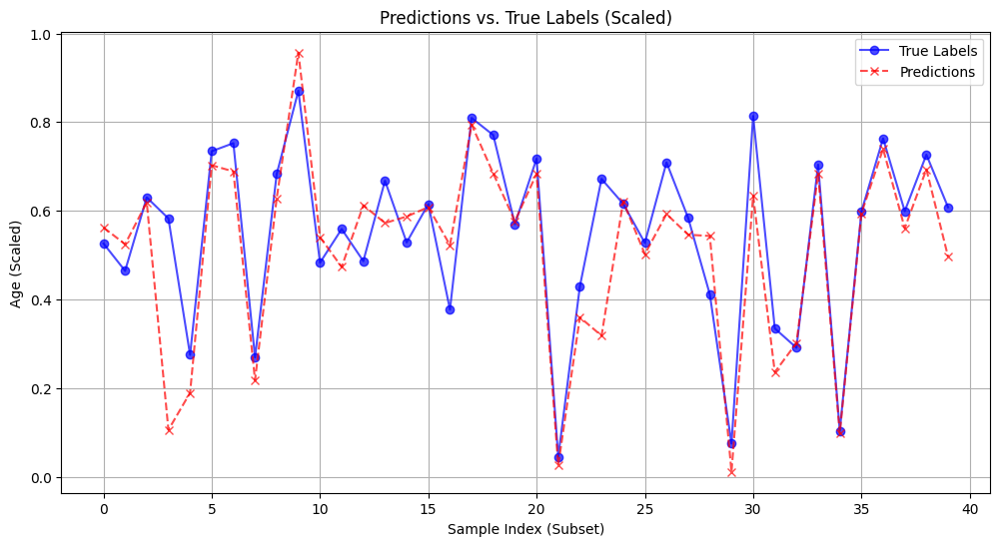

Mean Absolute Error (MAE) [Rescaled]: 17.99603597535897


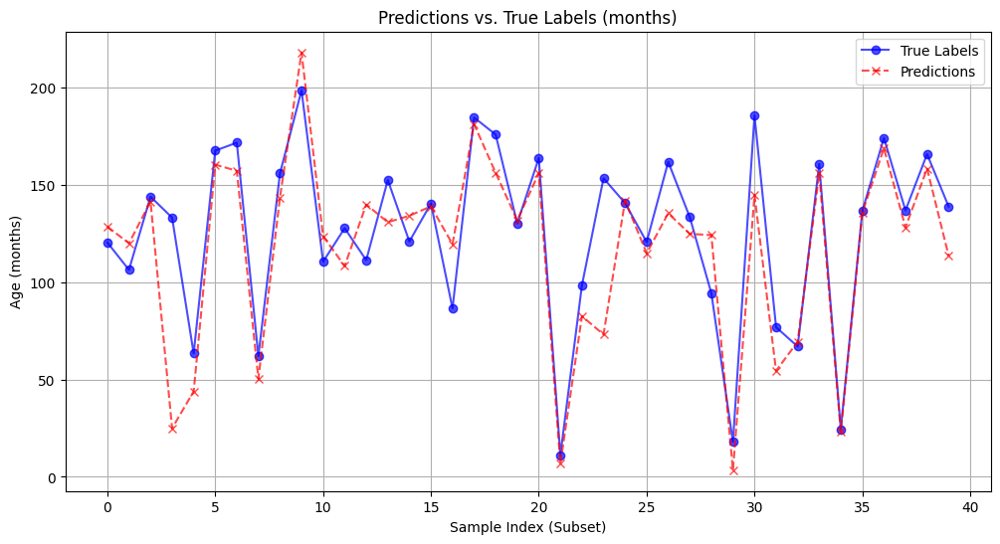

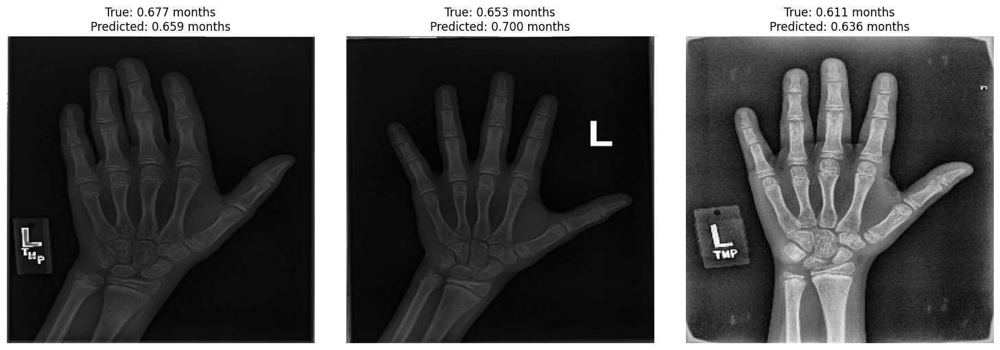

In [ ]:
plot_predictions_with_images(test_dataset, model, rescale_params=(min_label, max_label))

## Base CNN (4layer) - unbalanced

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

model = tf.keras.models.load_model(saved_models_dir + 'base-cnn-unbalanced.keras', custom_objects={'rmse_loss':rmse_loss})

ValueError: File not found: filepath=/content/drive/.shortcut-targets-by-id/1SdnBZOzsEir7hBdU_PsKhixJYL4F6ZI4/ML_HD_C2/saved_models/base-cnn-unbalanced.keras. Please ensure the file is an accessible `.keras` zip file.

Mean Absolute Error (MAE) [Scaled]: 0.08585431372197153


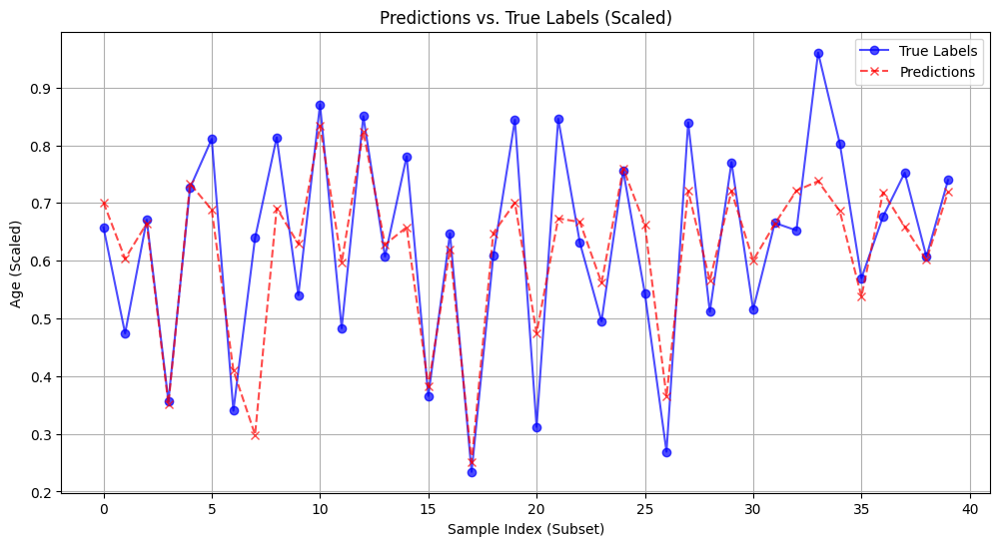

Mean Absolute Error (MAE) [Rescaled]: 19.488929214887538


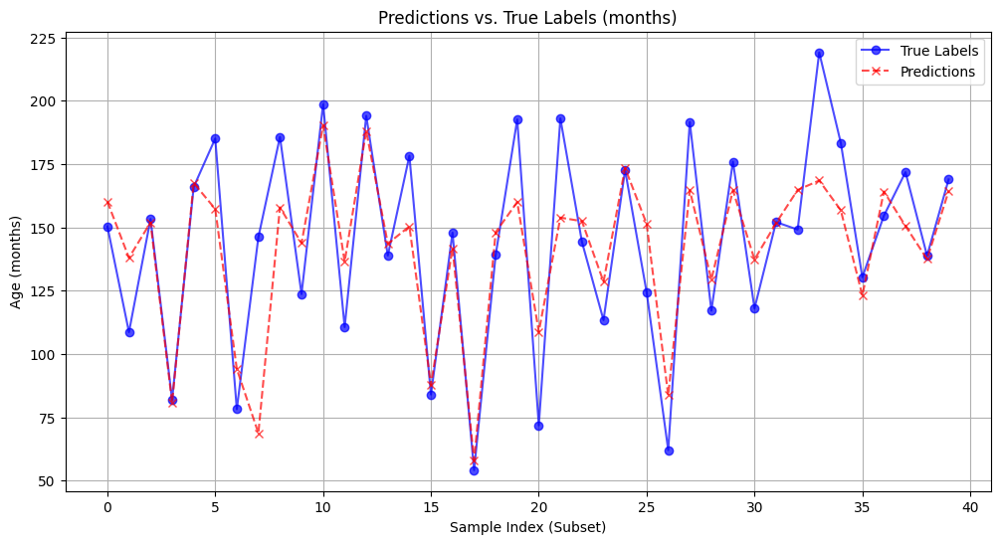

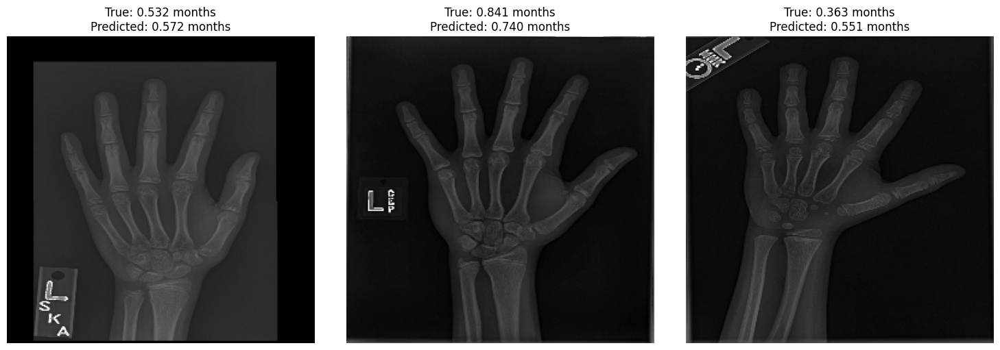

In [ ]:
plot_predictions_with_images(test_dataset, model, rescale_params=(min_label, max_label))

## Inception-v4-balanced

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

model = tf.keras.models.load_model(saved_models_dir + 'inception_v4_balanced.keras', custom_objects={'rmse_loss':rmse_loss})

Mean Absolute Error (MAE) [Scaled]: 0.041501559965746934


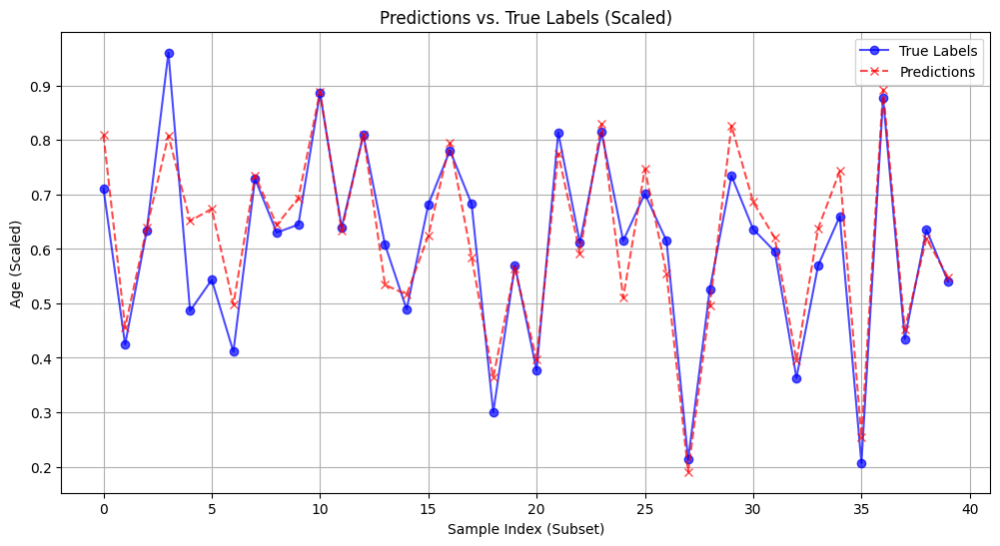

Mean Absolute Error (MAE) [Rescaled]: 9.420854112224555


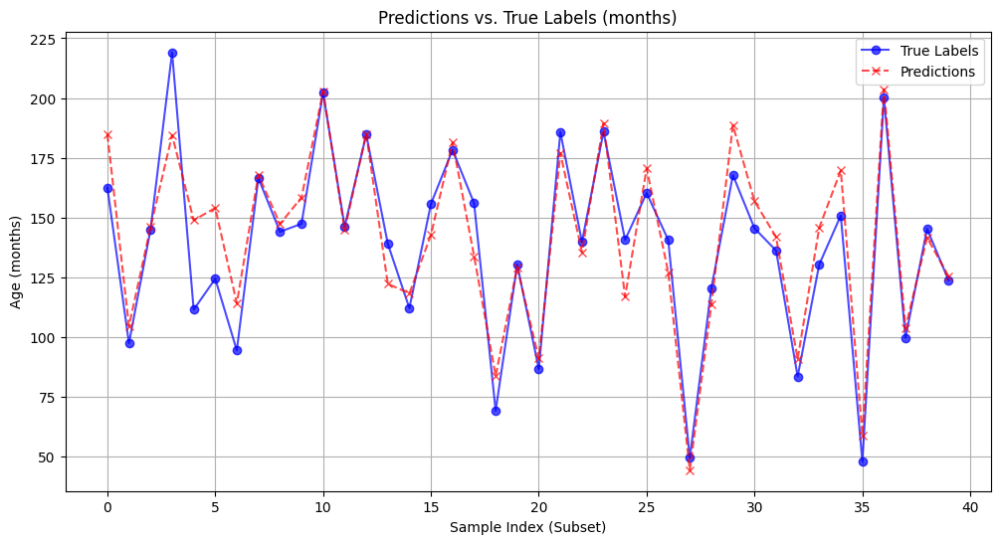

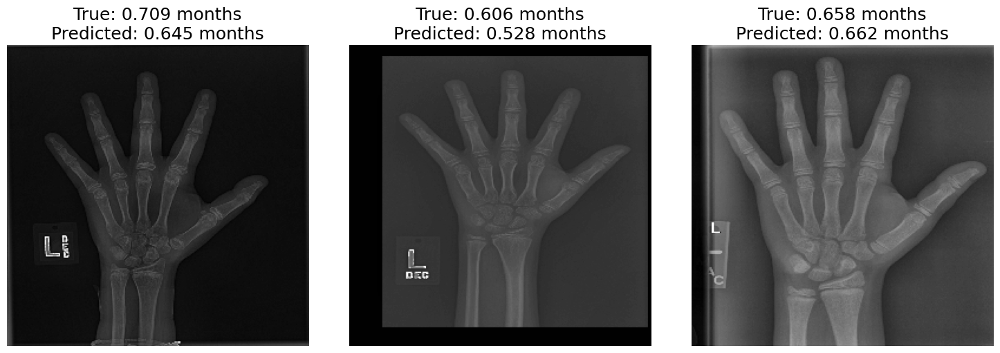

In [ ]:
plot_predictions_with_images(test_dataset, model, rescale_params=(min_label, max_label))

## Inception-v4-carpal-fusion

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

carpal_model = tf.keras.models.load_model(saved_models_dir + 'cnn_carpal.keras', custom_objects={'rmse_loss':rmse_loss})
inception_model = tf.keras.models.load_model(saved_models_dir + 'inception_v4_balanced.keras', custom_objects={'rmse_loss':rmse_loss})



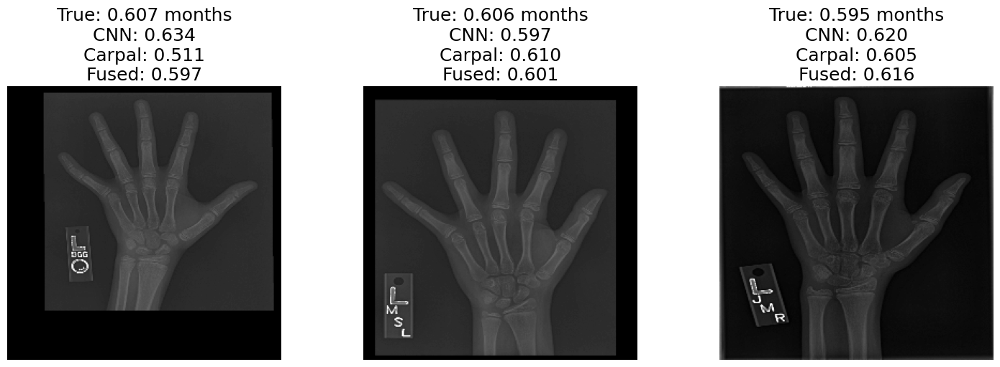

Mean Absolute Error: 0.040


In [ ]:
#Assuming `test_dataset`, `cnn_model`, and `carpal_model` are defined and loaded
mean_error = dec_fus_cnn_and_carpal(test_dataset, inception_model, carpal_model, threshold = 0.5, carpal_weight=0.3)
print(f"Mean Absolute Error: {mean_error:.3f}")

In [ ]:
# Define grid search parameters
thresholds = np.linspace(0.3, 0.7, 5)  # Generates 5 values between 0.3 and 0.7
carpal_weights = np.linspace(0.3, 0.7, 5)  # Generates 5 values between 0.3 and 0.7
# Perform grid search
best_params = grid_search_threshold_weight(test_dataset, inception_model, carpal_model, thresholds, carpal_weights)

# Output best parameters
print(f"Best Parameters:\nThreshold: {best_params['threshold']}\nCarpal Weight: {best_params['carpal_weight']}\nMAE: {best_params['mae']:.3f}")


Evaluating threshold=0.300, carpal_weight=0.300...
MAE: 0.042
Evaluating threshold=0.300, carpal_weight=0.400...
MAE: 0.044
Evaluating threshold=0.300, carpal_weight=0.500...
MAE: 0.047
Evaluating threshold=0.300, carpal_weight=0.600...
MAE: 0.050
Evaluating threshold=0.300, carpal_weight=0.700...
MAE: 0.053
Evaluating threshold=0.400, carpal_weight=0.300...
MAE: 0.040
Evaluating threshold=0.400, carpal_weight=0.400...
MAE: 0.041
Evaluating threshold=0.400, carpal_weight=0.500...
MAE: 0.043
Evaluating threshold=0.400, carpal_weight=0.600...
MAE: 0.045
Evaluating threshold=0.400, carpal_weight=0.700...
MAE: 0.048
Evaluating threshold=0.500, carpal_weight=0.300...
MAE: 0.040
Evaluating threshold=0.500, carpal_weight=0.400...
MAE: 0.041
Evaluating threshold=0.500, carpal_weight=0.500...
MAE: 0.042
Evaluating threshold=0.500, carpal_weight=0.600...
MAE: 0.043
Evaluating threshold=0.500, carpal_weight=0.700...
MAE: 0.045
Evaluating threshold=0.600, carpal_weight=0.300...
MAE: 0.040
Evaluati

## Attention-CNN with CBAMs

In [ ]:
def spatial_avg(x): return tf.reduce_mean(x, axis=-1, keepdims=True)
def spatial_max(x): return tf.reduce_max(x, axis=-1, keepdims=True)
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

model = tf.keras.models.load_model(saved_models_dir + 'attention_cnn.keras', custom_objects={'spatial_avg': spatial_avg,'spatial_max':spatial_max,'rmse_loss':rmse_loss})

Mean Absolute Error (MAE) [Scaled]: 0.04826664206283361


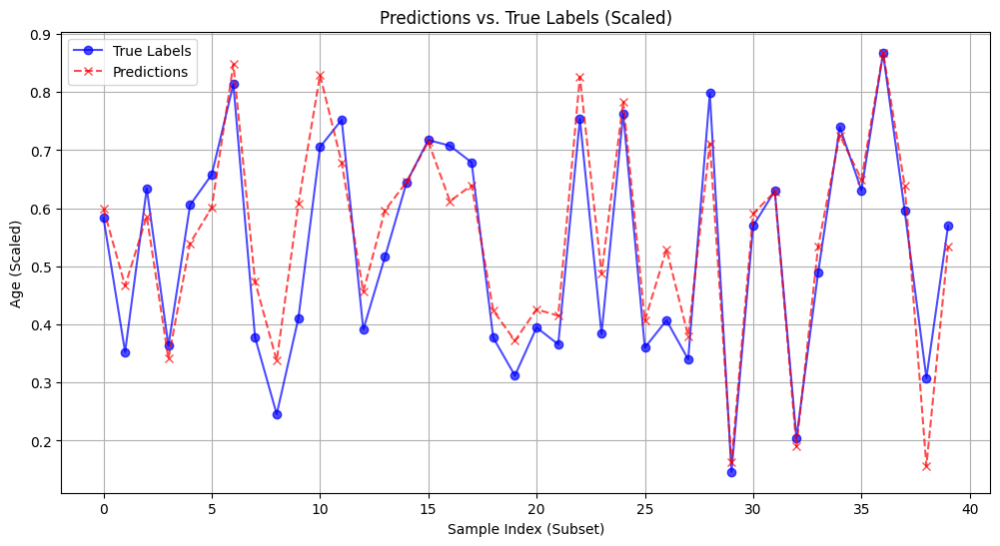

Mean Absolute Error (MAE) [Rescaled]: 10.956527748263229


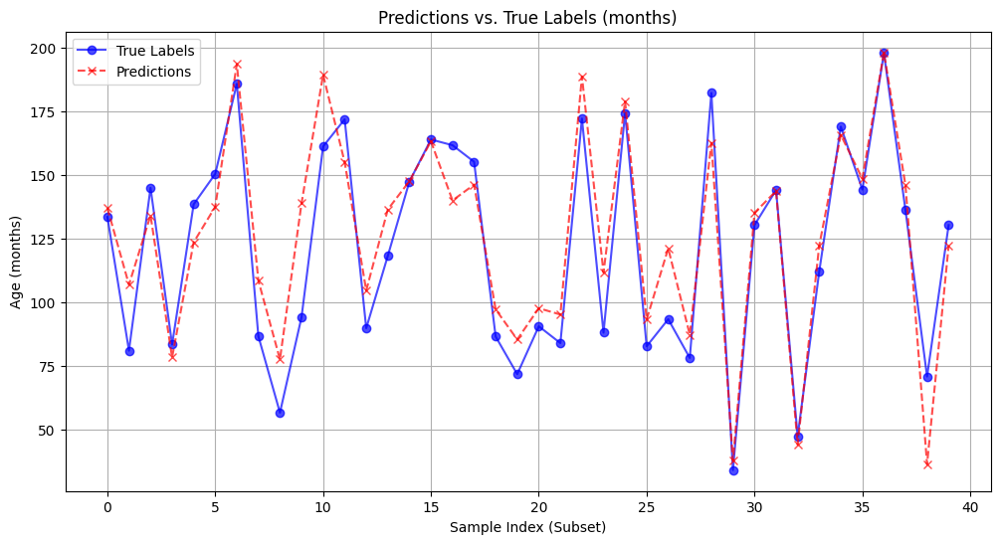

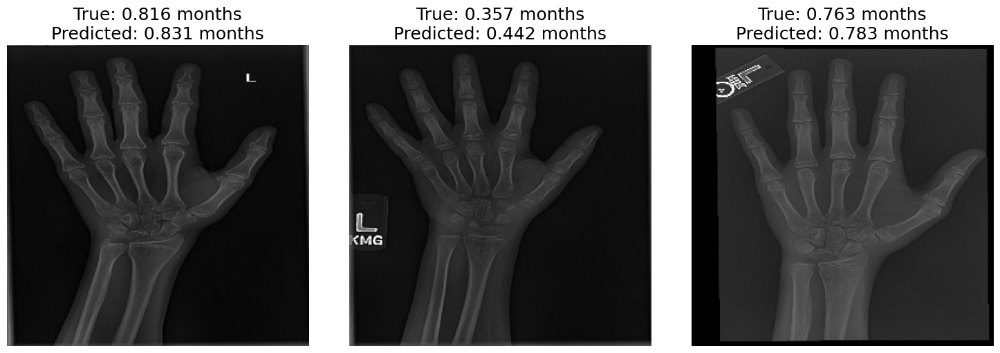

In [ ]:
plot_predictions_with_images(test_dataset, model, rescale_params=(min_label, max_label))

### Attention-CNN with CBAMs using Clahe+Masked Dataset

Mean Absolute Error (MAE) [Scaled]: 0.08303851102544728


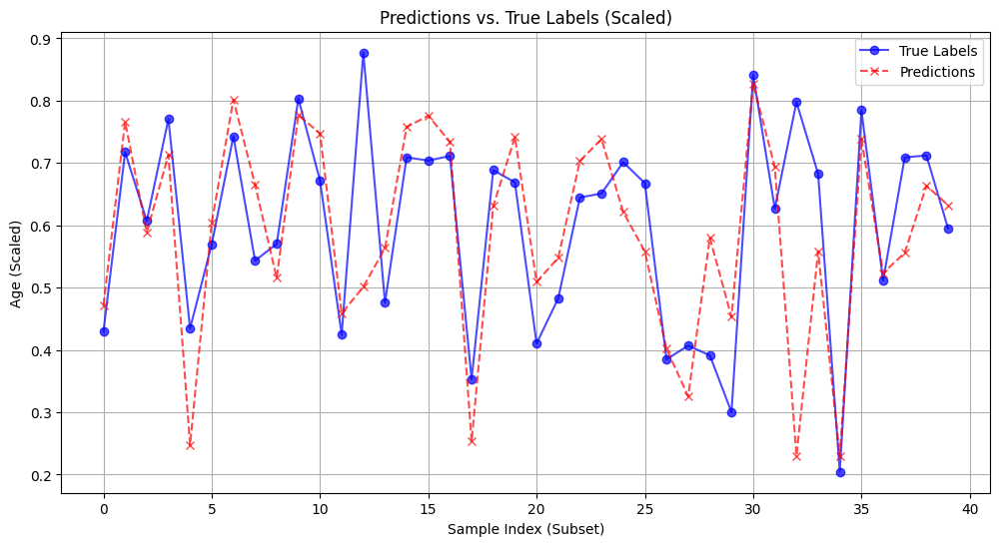

Mean Absolute Error (MAE) [Rescaled]: 18.84974200277653


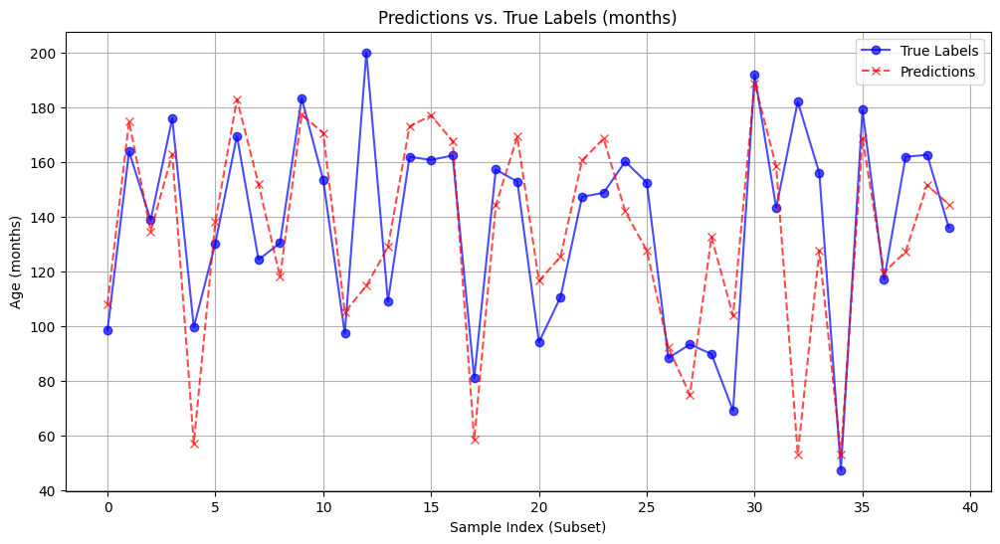

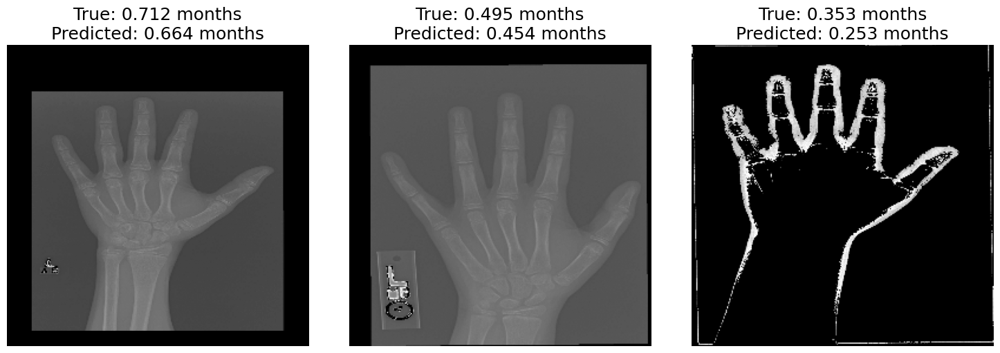

In [ ]:
plot_predictions_with_images(test_dataset, model, rescale_params=(min_label, max_label))

## ResNet50 Pre-trained

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

model = tf.keras.models.load_model('resnet50_images_only.keras', custom_objects={'rmse_loss':rmse_loss})

Mean Absolute Error (MAE) [Scaled]: 0.0456698181100973


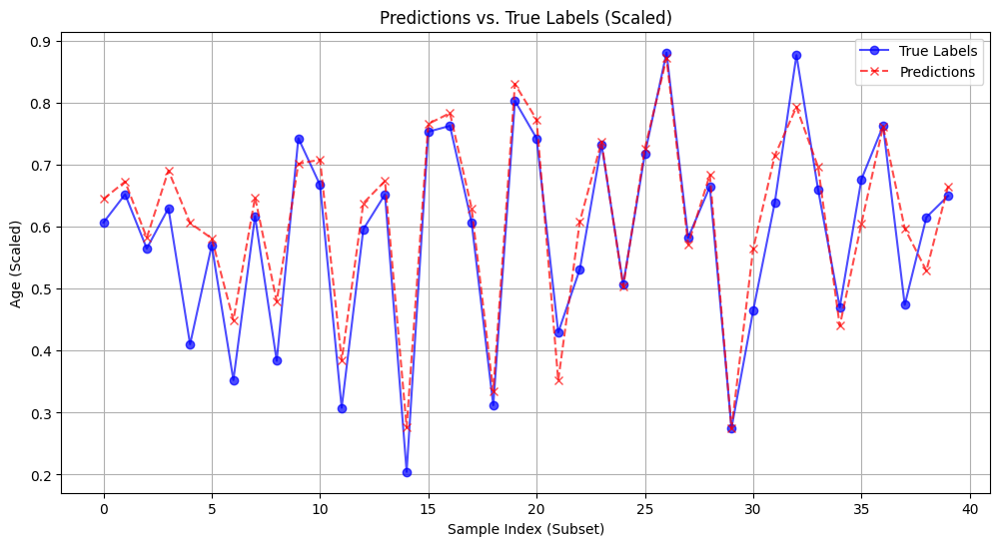

Mean Absolute Error (MAE) [Rescaled]: 10.367048710992087


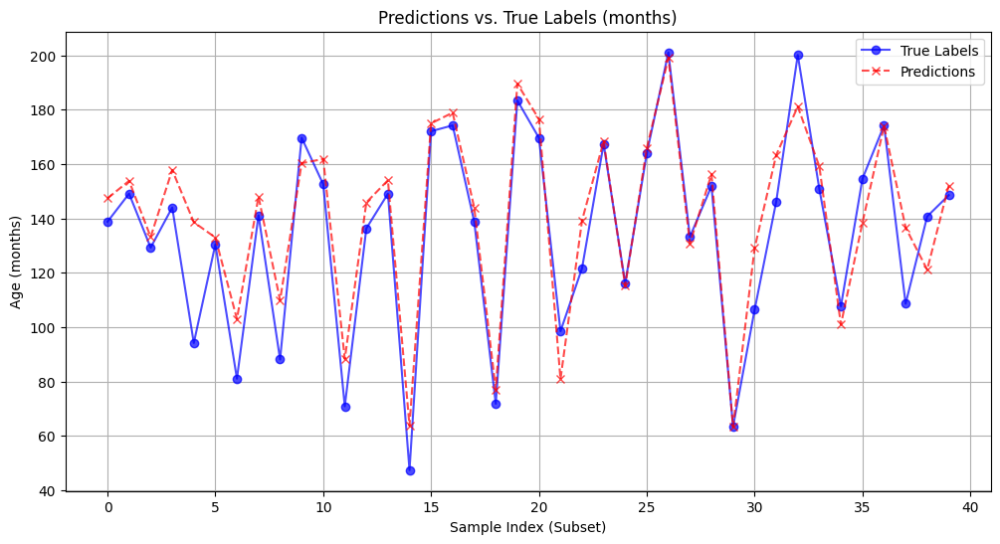

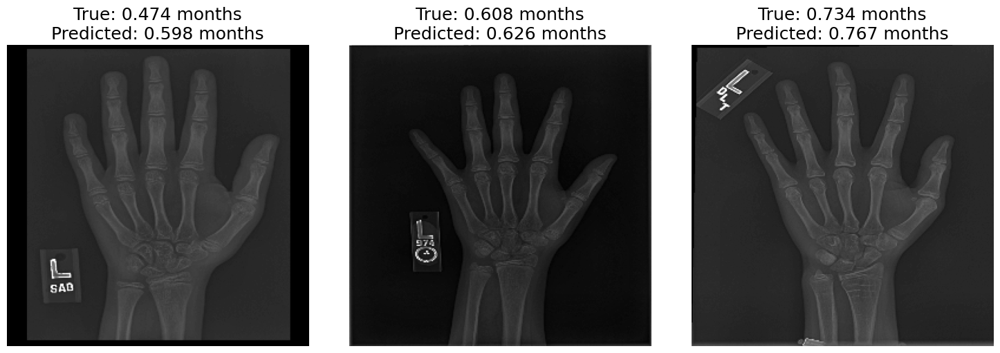

In [ ]:
plot_predictions_with_images(test_dataset, model, rescale_params=(min_label, max_label))

## ResNet50 Transfer Learning + Gender

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

model = tf.keras.models.load_model(saved_models_dir + 'resnet50_transfer_learning.keras', custom_objects={'rmse_loss':rmse_loss})

Mean Absolute Error (MAE) [Scaled]: 0.065014327065546


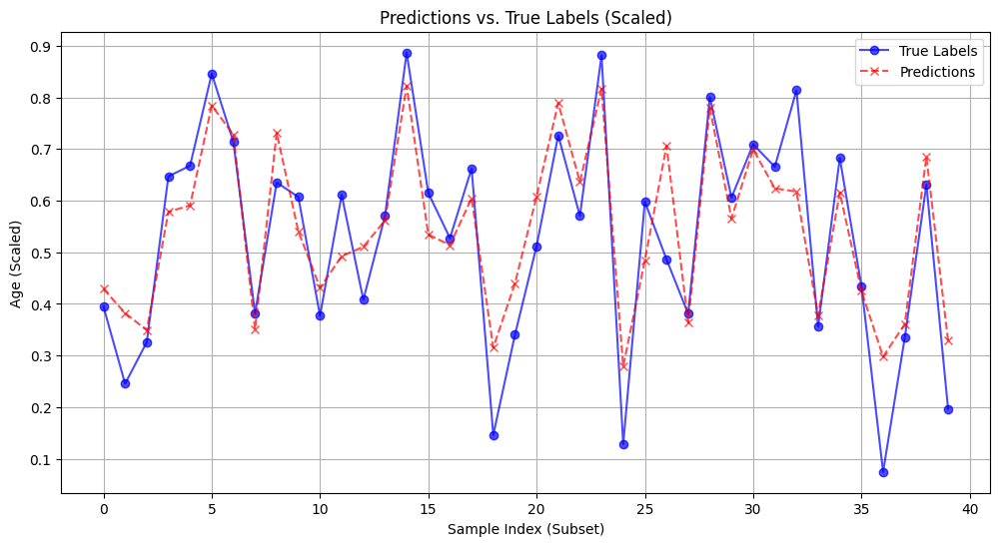

Mean Absolute Error (MAE) [Rescaled]: 14.758252243878939


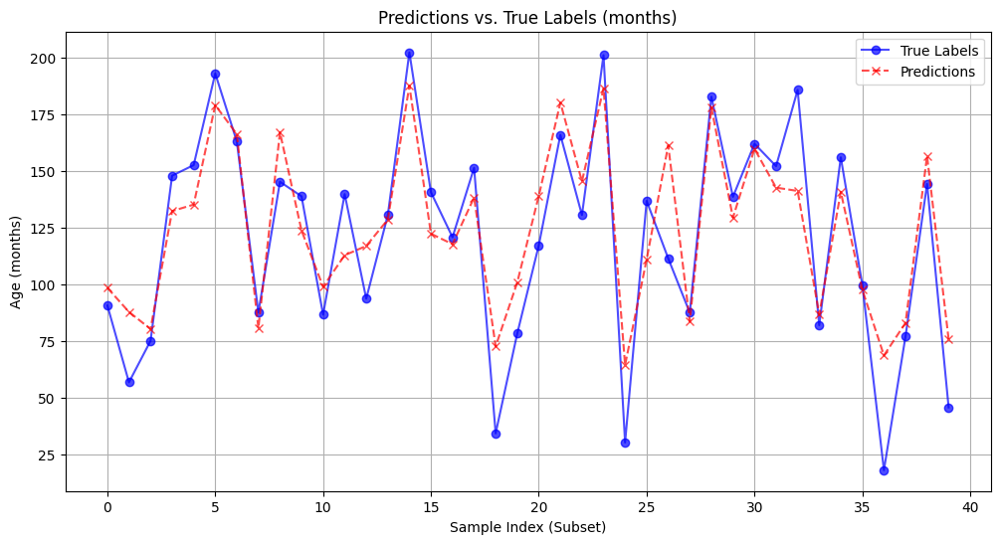

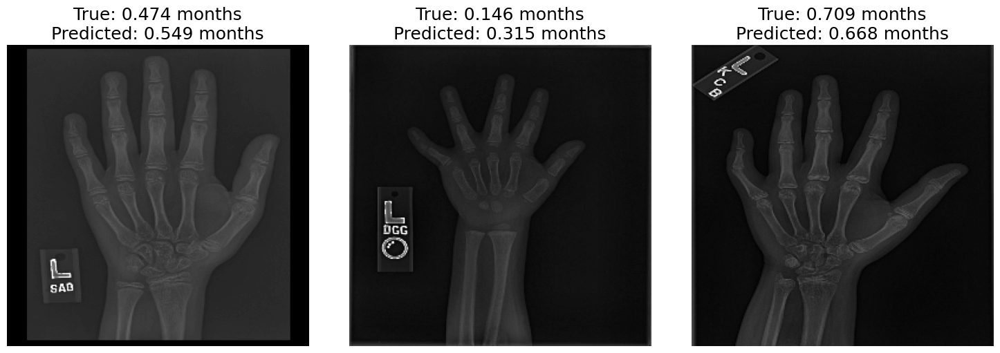

In [ ]:
plot_predictions_with_images(test_dataset, model, rescale_params=(min_label, max_label))

## ResNet 50 Transfer Leraning + Gender (trainable low layer)

In [ ]:
def rmse_loss(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

model = tf.keras.models.load_model(saved_models_dir + 'resnet50_transfer_learning_lower_layers.keras', custom_objects={'rmse_loss':rmse_loss})

Mean Absolute Error (MAE) [Scaled]: 0.0673536261432659


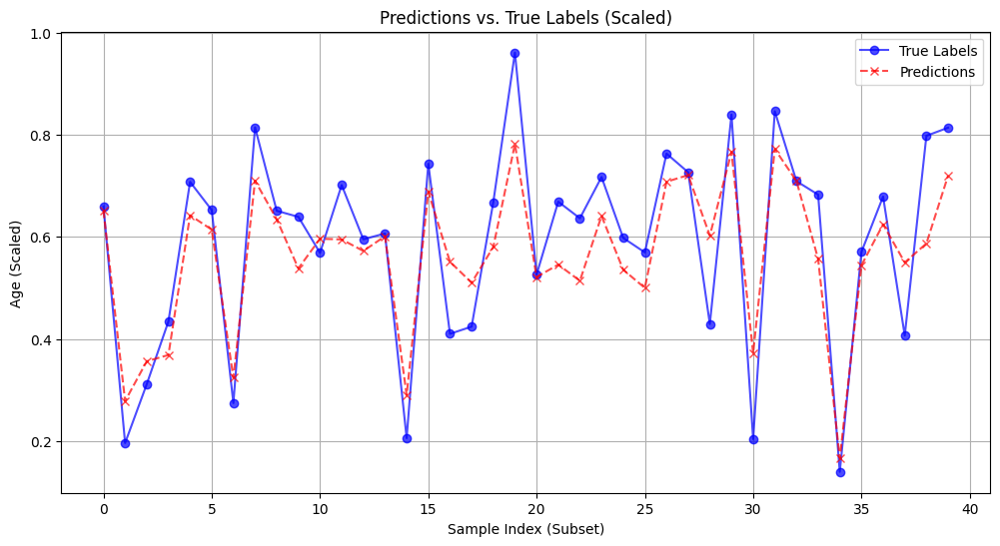

Mean Absolute Error (MAE) [Rescaled]: 15.289273134521359


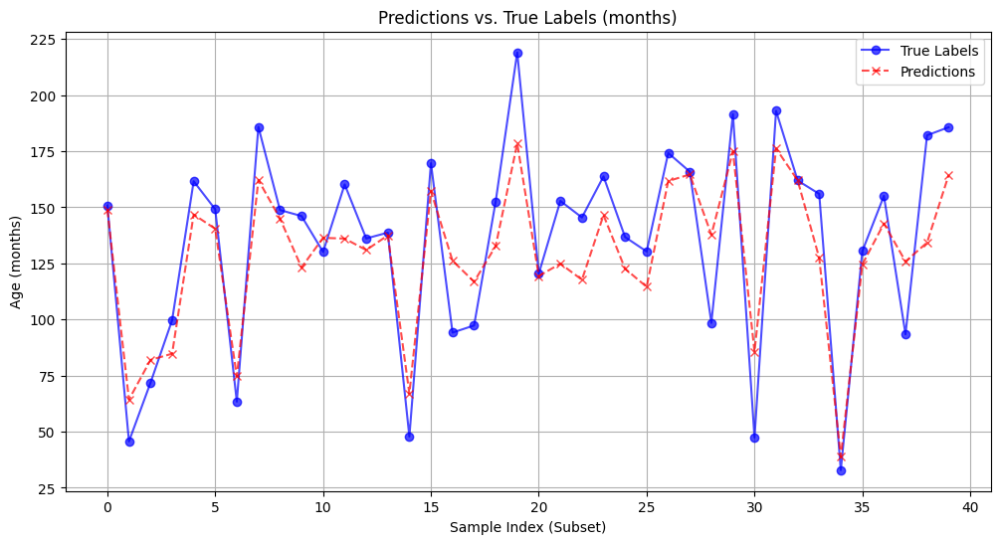

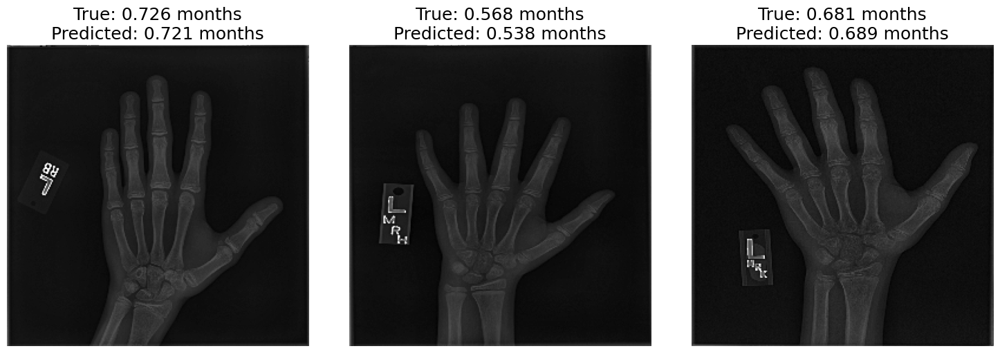

In [ ]:
plot_predictions_with_images(test_dataset, model, rescale_params=(min_label, max_label))

# Demo

In [ ]:
#only for demo
import shutil
shutil.copytree(test_clahe_imdir, '/content/datasets/test_clahe')

## Libraries and Paths

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from PIL import Image
import cv2
import random
import numpy as np
import tensorflow as tf
import os
from sklearn.metrics import mean_absolute_error
import time
import pandas as pd
from scipy.signal import find_peaks

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd '/content/drive/MyDrive/ML_HD_C2'

/content/drive/.shortcut-targets-by-id/1SdnBZOzsEir7hBdU_PsKhixJYL4F6ZI4/ML_HD_C2


In [ ]:
# Correct paths to preprocessed datasets
train_dir = '/content/drive/MyDrive/ML_HD_C2/preprocess/training_clahe/'
val_dir = '/content/drive/MyDrive/ML_HD_C2/preprocess/validation_clahe/'
test_dir = '/content/drive/MyDrive/ML_HD_C2/preprocess/test_clahe/'


# Define the paths for the preprocessed images
test_raw_dir = '/content/drive/MyDrive/ML_HD_C2/preprocess/test_raw'
test_clahe_masked_dir = '/content/drive/MyDrive/ML_HD_C2/preprocess/test_clahe_masked'

# Define the path to the Test Set Images directory
test_images_dir = '/content/drive/MyDrive/ML_HD_C2/dataset/Test Set Images'
cleaned_training_dir = '/content/drive/MyDrive/ML_HD_C2/dataset/boneage-training-cleaned-dataset'

raw_dir = '/content/drive/MyDrive/ML_HD_C2/preprocess/training_raw/'
clahe_dir = '/content/drive/MyDrive/ML_HD_C2/preprocess/training_clahe/'
clahe_masked_dir = '/content/drive/MyDrive/ML_HD_C2/preprocess/training_clahe_masked/'


# Paths to metadata files
train_metadata_path = '/content/drive/MyDrive/ML_HD_C2/dataset/train.csv'
val_metadata_path = '/content/drive/MyDrive/ML_HD_C2/dataset/validation.csv'
test_metadata_path = '/content/drive/MyDrive/ML_HD_C2/dataset/test.xlsx'

# Load metadata
train_metadata = pd.read_csv(train_metadata_path)
val_metadata = pd.read_csv(val_metadata_path)
test_metadata = pd.read_excel(test_metadata_path)

NameError: name 'pd' is not defined

## Functions Used in Preprocesing

In [ ]:
def create_bright_mask(image, peaks,valleys, plot=True):
    # Create a binary mask for pixels within the desired range based on the valleys
    _, bright_mask = cv2.threshold(image, valleys[0][0], 255, cv2.THRESH_TOZERO)
    _, bright_mask = cv2.threshold(bright_mask, valleys[-1][0], 255, cv2.THRESH_TOZERO_INV)
    _, bright_mask = cv2.threshold(bright_mask, valleys[0][0], 255, cv2.THRESH_BINARY)
    # Invert the mask so that the regions we want to keep are white (255) and everything else is black (0)
    inverted_bright_mask = cv2.bitwise_not(bright_mask)

    # Apply the mask to the original image to retain the region of interest
    masked_image = cv2.bitwise_and(image, image, mask=bright_mask)

    # Plot the original image, mask, and the masked result
    if plot:
        plt.figure(figsize=(15, 5))

        # Plot the original image
        plt.subplot(1, 3, 1)
        plt.imshow(image, cmap='gray')
        plt.title("Original Image")
        plt.xticks([]); plt.yticks([])

        # Plot the binary mask
        plt.subplot(1, 3, 2)
        plt.imshow(bright_mask, cmap='gray')
        plt.title("Binary Mask (Region of Interest)")
        plt.xticks([]); plt.yticks([])

        # Plot the masked image
        plt.subplot(1, 3, 3)
        plt.imshow(masked_image, cmap='gray')
        plt.title("Masked Image (Region of Interest)")
        plt.xticks([]); plt.yticks([])

        plt.tight_layout()
        plt.show()

    return masked_image

# Function to apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
def clahe_enhancement(img):

    # Create a CLAHE object with default parameters
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_clahe = clahe.apply(img)  # Apply CLAHE

    # Return the enhanced image
    return img_clahe

# Function to collect image dimensions
def collect_image_dimensions(directory):
    widths = []
    heights = []
    for filename in os.listdir(directory):
        if filename.endswith('.png'):
            image_path = os.path.join(directory, filename)
            with Image.open(image_path) as img:
                width, height = img.size
                widths.append(width)
                heights.append(height)
    return widths, heights

# Optimized function to compute pixel intensities
def compute_pixel_distribution(directory, sample_size=400):
    pixel_values = []

    # List image files and randomly sample 200 images
    image_files = [f for f in os.listdir(directory) if f.endswith(('.png', '.jpg', '.jpeg'))]
    sample_images = random.sample(image_files, min(sample_size, len(image_files)))

    # Efficiently collect pixel values
    for image_name in sample_images:
        image_path = os.path.join(directory, image_name)
        try:
            with Image.open(image_path) as img:
                img = img.convert('L')  # Ensure image is grayscale
                img_array = np.array(img)
                pixel_values.append(img_array.flatten())  # Store flattened image
        except Exception as e:
            print(f"Error processing {image_name}: {e}")

    # Concatenate all pixel arrays into a single array for plotting
    return np.concatenate(pixel_values)

#create a function to find peaks in the image

import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Function to find peaks
def find_peaks(arr, width=3, min_amount=200):
    peaks = []
    for i in range(1, len(arr)):
        if arr[i] > min_amount and all(arr[i] >= x for x in arr[max(0, i - width // 2):min(len(arr), i + 1 + width // 2)]):
            peaks.append((i, arr[i]))
    return peaks

# Function to find valleys
def find_valleys(histogram, peaks):
    valleys = []
    previous = peaks[0][0]
    for pos, _ in peaks[1:]:
        sublist = histogram[previous:pos]
        valley = sublist.argmin() + previous
        valleys.append((valley, histogram[valley]))
        previous = pos
    return valleys
def detect_peaks_valleys(image, plot=True):

    # Compute the histogram
    hist, bins = np.histogram(image.ravel(), 256, [0, 255])

    # Smooth the histogram
    smooth = np.convolve(hist, np.ones((5,)) / 5, mode='same')

    # Detect peaks and valleys
    peaks = find_peaks(smooth, width=9)
    valleys = find_valleys(smooth, peaks)

    # Plot the image and histogram if required
    if plot:
        plt.figure(figsize=(12, 6))

        # Plot the image
        plt.subplot(1, 3, 1)
        plt.imshow(image, cmap='gray')
        plt.title("Image")
        plt.xticks([])
        plt.yticks([])

        # Plot the original histogram
        plt.subplot(1, 3, 2)
        plt.plot(hist, label="Histogram")
        plt.title("Original Histogram")
        plt.xlim([0, 255])
        plt.xlabel("Pixel Value")
        plt.ylabel("Number of Pixels")
        plt.grid()

        # Plot the smoothed histogram with peaks and valleys
        plt.subplot(1, 3, 3)
        plt.plot(smooth, label="Smoothed Histogram")
        plt.plot([x for x, _ in peaks], [x for _, x in peaks], 'go', label="Peaks")
        plt.plot([x for x, _ in valleys], [x for _, x in valleys], 'ro', label="Valleys")
        plt.title("Smoothed Histogram with Peaks and Valleys")
        plt.xlim([0, 255])
        plt.xlabel("Pixel Value")
        plt.ylabel("Number of Pixels")
        plt.legend()
        plt.grid()

        plt.tight_layout()
        plt.show()

    return peaks, valleys

def segment_image(image, peaks, valleys):
    """
    Segment the image into different components using histogram peaks and valleys.
    """
    # Prepare valley boundaries
    boundaries = [0] + [int(valley[0]) for valley in valleys] + [255]  # Ensure boundaries are integers
    components = []

    # Segment the image based on intensity ranges
    for i in range(len(boundaries) - 1):
        lower, upper = boundaries[i], boundaries[i + 1]
        mask = cv2.inRange(image, lower, upper)  # Create a mask for the current range
        components.append(mask)

    return components

def plot_segmented_components(image, components):
    """
    Plot the original image alongside its segmented components.
    """
    n_components = len(components)
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, n_components + 1, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    # Segmented components
    for i, component in enumerate(components, start=2):
        plt.subplot(1, n_components + 1, i)
        plt.imshow(component, cmap='gray')
        plt.title(f"Component {i-1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


## Raw Data Exploration

### Image Counts and Gender Distribution

Training images: 12611
Validation images: 1425
Test images: 200


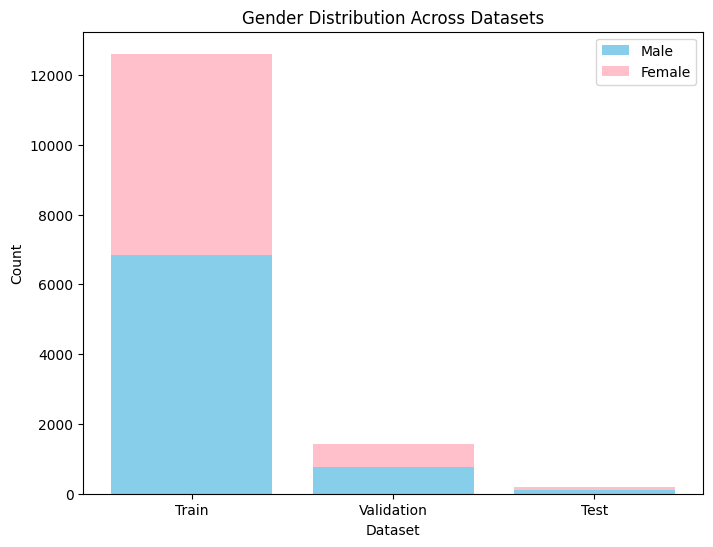

In [ ]:
# Dataset counts
train_count = len(os.listdir(train_dir))
val_count = len(os.listdir(val_dir))
test_count = len(os.listdir(test_dir))

print(f"Training images: {train_count}")
print(f"Validation images: {val_count}")
print(f"Test images: {test_count}")

# Gender distribution
train_male = train_metadata['male'].sum()
train_female = train_count - train_male

val_male = val_metadata['male'].sum()
val_female = val_count - val_male

test_male = test_metadata[test_metadata['Sex'] == 'M'].shape[0]
test_female = test_count - test_male

# Gender distribution plot
datasets = ['Train', 'Validation', 'Test']
male_counts = [train_male, val_male, test_male]
female_counts = [train_female, val_female, test_female]

fig, ax = plt.subplots(figsize=(8, 6))
ax.bar(datasets, male_counts, label='Male', color='skyblue')
ax.bar(datasets, female_counts, bottom=male_counts, label='Female', color='pink')
ax.set_ylabel('Count')
ax.set_xlabel('Dataset')
ax.set_title('Gender Distribution Across Datasets')
ax.legend()
plt.show()

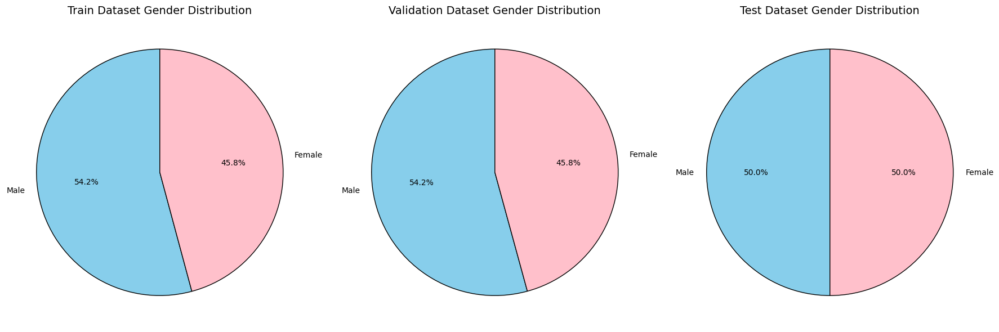

In [ ]:
# Calculate gender counts for each dataset
train_male = train_metadata['male'].sum()
train_female = len(train_metadata) - train_male

val_male = val_metadata['male'].sum()
val_female = len(val_metadata) - val_male

test_male = test_metadata[test_metadata['Sex'] == 'M'].shape[0]
test_female = test_metadata[test_metadata['Sex'] == 'F'].shape[0]

# Data for pie charts
datasets = {
    'Train': [train_male, train_female],
    'Validation': [val_male, val_female],
    'Test': [test_male, test_female]
}

# Labels and colors
labels = ['Male', 'Female']
colors = ['skyblue', 'pink']

# Plotting pie charts
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for ax, (dataset, counts) in zip(axes, datasets.items()):
    ax.pie(counts, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors, wedgeprops={'edgecolor': 'black'})
    ax.set_title(f'{dataset} Dataset Gender Distribution', fontsize=14)

plt.tight_layout()
plt.show()

### Raw Image Examples

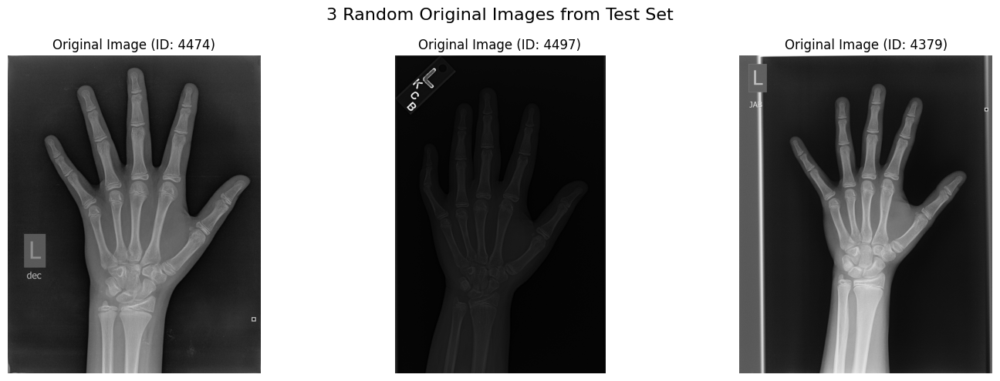

In [ ]:
# Randomly select 3 images
random_image_names = np.random.choice(os.listdir(test_images_dir), 3, replace=False)

# Plot the 3 randomly selected images
plt.figure(figsize=(15, 5))

for i, image_name in enumerate(random_image_names):
    # Load the image
    image_path = os.path.join(test_images_dir, image_name)
    image = np.array(Image.open(image_path).convert('L'))  # Convert to grayscale

    # Plot the image
    plt.subplot(1, 3, i + 1)
    plt.imshow(image, cmap='gray')
    plt.title(f"Original Image (ID: {os.path.splitext(image_name)[0]})")
    plt.axis('off')

plt.suptitle("3 Random Original Images from Test Set", fontsize=16)
plt.tight_layout()
plt.show()

## Exploratory Data Analysis (EDA)

###  Image Dimensions

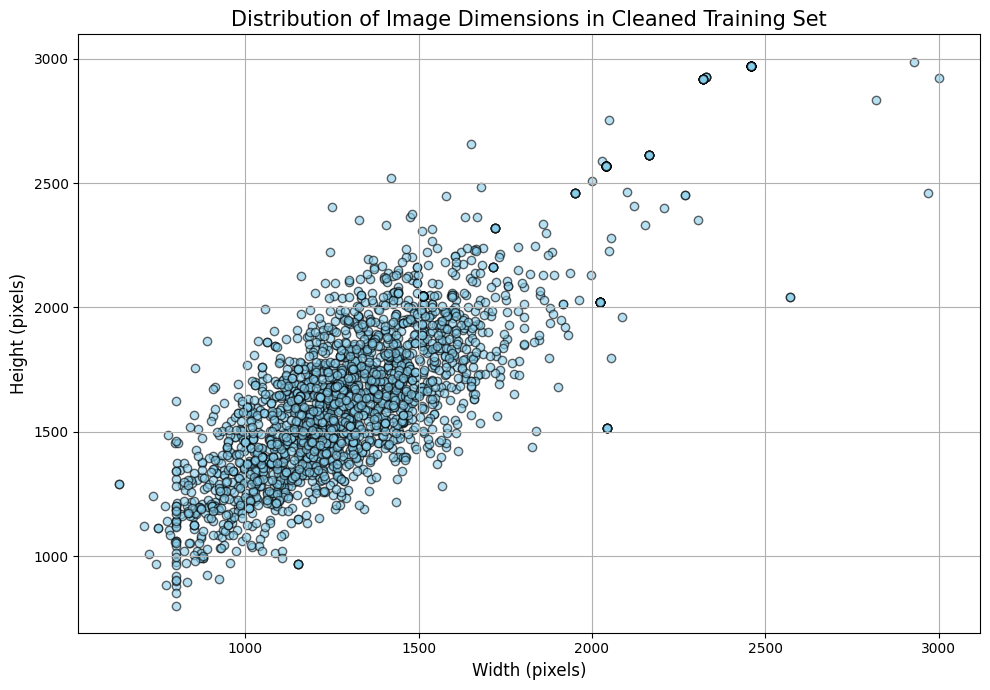

In [ ]:
# Collect image dimensions from cleaned_training_dir
widths_cleaned, heights_cleaned = collect_image_dimensions(cleaned_training_dir)

# Plotting the image dimensions for cleaned_training_dir
plt.figure(figsize=(10, 7))
plt.scatter(widths_cleaned, heights_cleaned, alpha=0.6, edgecolors='black', color='skyblue')
plt.xlabel('Width (pixels)', fontsize=12)
plt.ylabel('Height (pixels)', fontsize=12)
plt.title('Distribution of Image Dimensions in Cleaned Training Set', fontsize=15)
plt.grid(True)
plt.tight_layout()
plt.show()

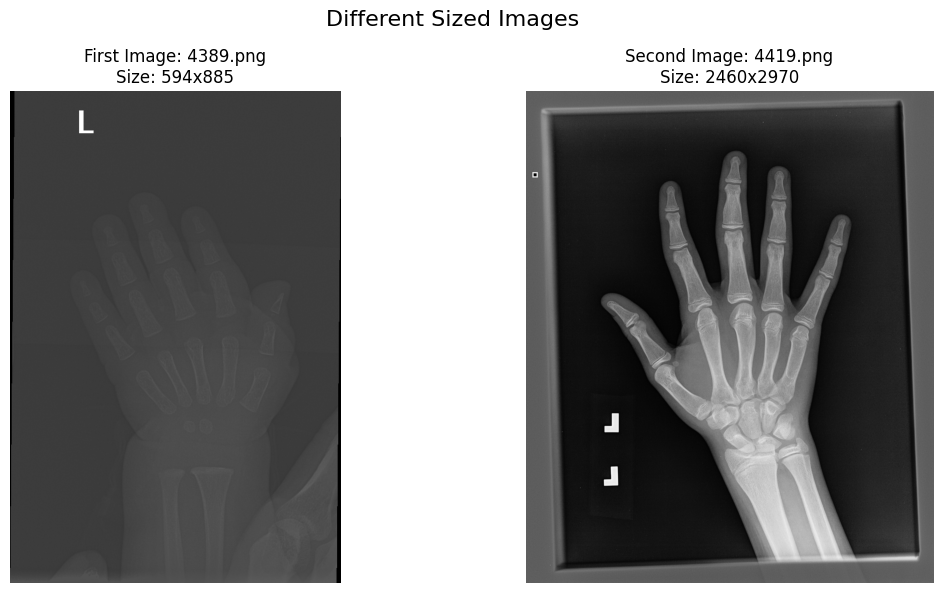

In [ ]:
# Initialize variables to store smallest and biggest images
smallest_image = None
biggest_image = None
smallest_size = float('inf')
biggest_size = 0

# Iterate through images to find smallest and biggest by area (width * height)
for image_name in os.listdir(test_images_dir):
    if image_name.endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(test_images_dir, image_name)
        with Image.open(image_path) as img:
            width, height = img.size
            size = width * height

            # Check for the smallest image
            if size < smallest_size:
                smallest_size = size
                smallest_image = (image_name, img.copy(), width, height)

            # Check for the biggest image
            if size > biggest_size:
                biggest_size = size
                biggest_image = (image_name, img.copy(), width, height)

# Plot the smallest and biggest images side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the smallest image
axes[0].imshow(smallest_image[1], cmap='gray')
axes[0].set_title(f'First Image: {smallest_image[0]}\nSize: {smallest_image[2]}x{smallest_image[3]}')
axes[0].axis('off')

# Plot the biggest image
axes[1].imshow(biggest_image[1], cmap='gray')
axes[1].set_title(f'Second Image: {biggest_image[0]}\nSize: {biggest_image[2]}x{biggest_image[3]}')
axes[1].axis('off')

plt.suptitle("Different Sized Images", fontsize=16)
plt.tight_layout()
plt.show()

### Pixel Intensity Distribution

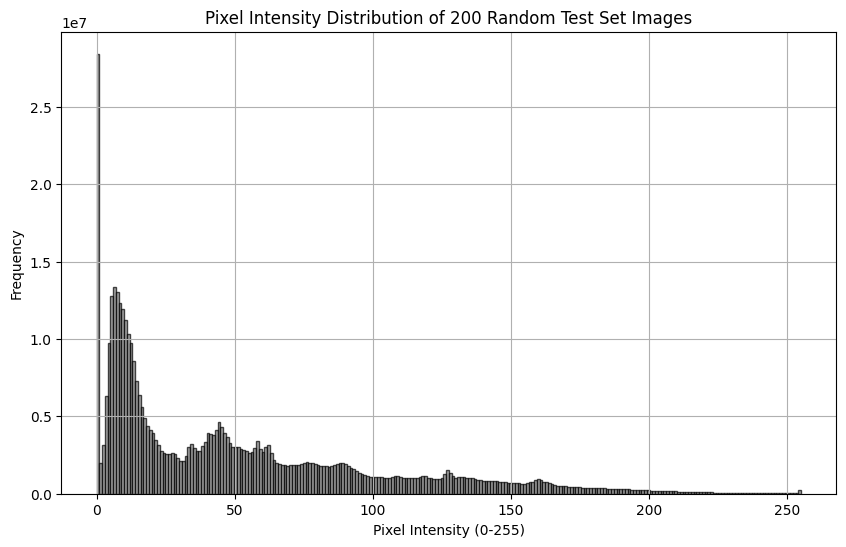

In [ ]:
# Compute pixel distribution for 200 random images
pixel_values = compute_pixel_distribution(cleaned_training_dir, sample_size=200)

# Plot the pixel intensity distribution
plt.figure(figsize=(10, 6))
plt.hist(pixel_values, bins=256, range=(0, 255), color='gray', edgecolor='black', alpha=0.7)
plt.title("Pixel Intensity Distribution of 200 Random Test Set Images")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

## Data Preprocessing

In [ ]:
import os
print(os.getcwd())

/content/drive/.shortcut-targets-by-id/1SdnBZOzsEir7hBdU_PsKhixJYL4F6ZI4/ML_HD_C2


In [ ]:
cd 'dataset/Test Set Images'

/content/drive/.shortcut-targets-by-id/1SdnBZOzsEir7hBdU_PsKhixJYL4F6ZI4/ML_HD_C2/dataset/Test Set Images


### Image Normalization

Below cell takes aprx 9 mins, do not need to run again

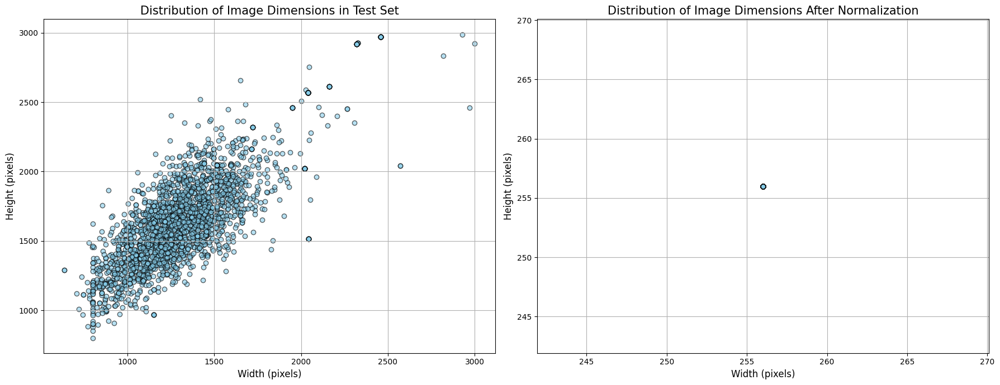

In [ ]:
# Collect image dimensions from both datasets
widths_original, heights_original = collect_image_dimensions(cleaned_training_dir)
widths_normalized, heights_normalized = collect_image_dimensions(raw_dir)

# Create subplots for side-by-side comparison
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Plot for the original dataset
axes[0].scatter(widths_original, heights_original, alpha=0.6, edgecolors='black', color='skyblue')
axes[0].set_xlabel('Width (pixels)', fontsize=12)
axes[0].set_ylabel('Height (pixels)', fontsize=12)
axes[0].set_title('Distribution of Image Dimensions in Test Set', fontsize=15)
axes[0].grid(True)

# Plot for the normalized dataset
axes[1].scatter(widths_normalized, heights_normalized, alpha=0.6, edgecolors='black', color='skyblue')
axes[1].set_xlabel('Width (pixels)', fontsize=12)
axes[1].set_ylabel('Height (pixels)', fontsize=12)
axes[1].set_title('Distribution of Image Dimensions After Normalization', fontsize=15)
axes[1].grid(True)

plt.tight_layout()
plt.show()

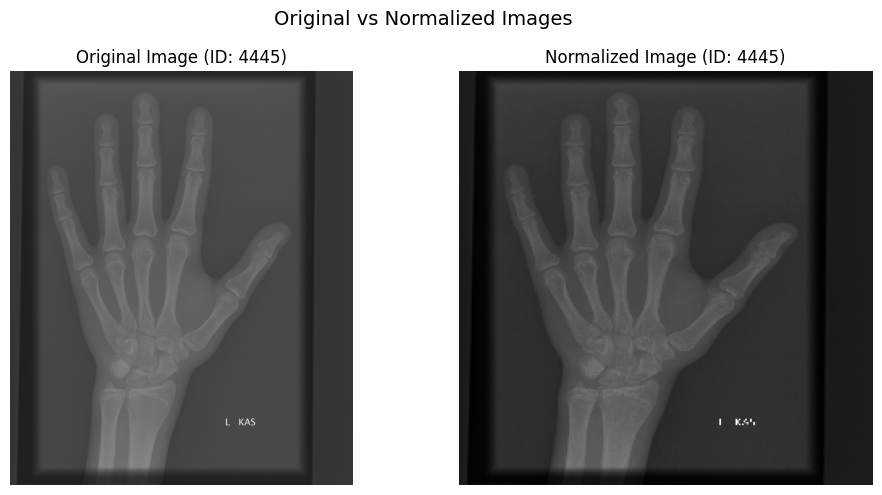

In [ ]:

# Randomly select an image from the original test images
random_image_name = np.random.choice(os.listdir(test_images_dir))

# Load the original image
original_image_path = os.path.join(test_images_dir, random_image_name)
original_image = np.array(Image.open(original_image_path).convert('L'))  # Convert to grayscale


# Load the corresponding normalized image from the preprocessed directory
normalized_image_path = os.path.join(test_raw_dir, random_image_name)

# Check if the normalized image exists
if os.path.exists(normalized_image_path):
    normalized_image = np.array(Image.open(normalized_image_path).convert('L'))  # Convert to grayscale
else:
    print(f"Normalized image not found: {normalized_image_path}")
    normalized_image = np.zeros_like(original_image)  # Placeholder if not found

# Extract Image ID for the title (remove file extension)
image_id = os.path.splitext(random_image_name)[0]

# Plot the original and normalized images side by side
plt.figure(figsize=(10, 5))

# Plot Original Image
plt.subplot(1, 2, 1)
plt.imshow(original_image, cmap='gray')
plt.title(f"Original Image (ID: {image_id})")
plt.axis('off')

# Plot Normalized Image
plt.subplot(1, 2, 2)
plt.imshow(normalized_image, cmap='gray')
plt.title(f"Normalized Image (ID: {image_id})")
plt.axis('off')

plt.suptitle("Original vs Normalized Images", fontsize=14)
plt.tight_layout()
plt.show()

### Contrast Enhancement with CLAHE and Masking Bright Regions

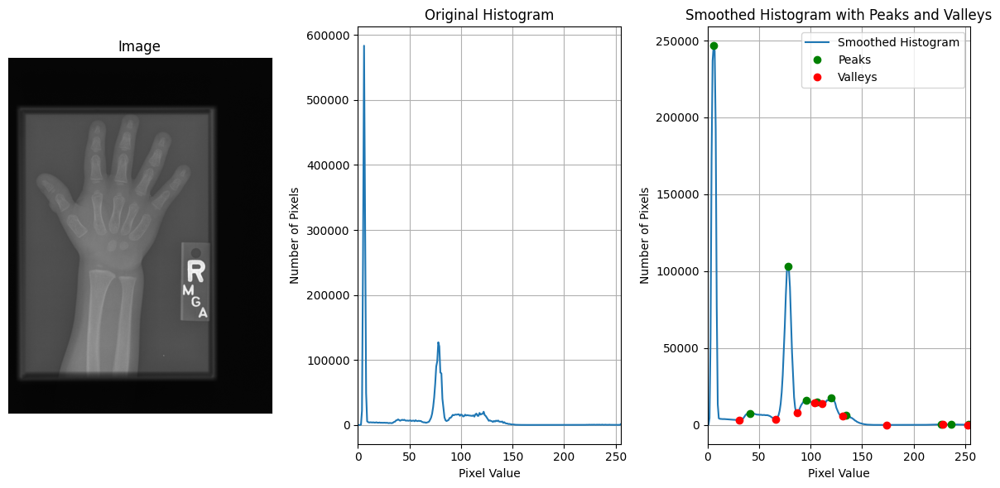

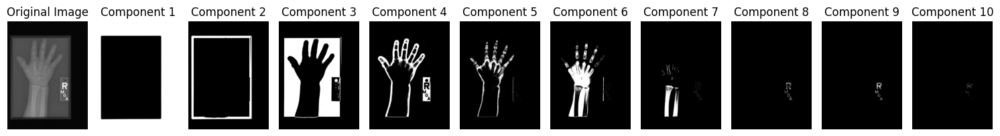

In [ ]:
img_path = os.path.join(test_images_dir,os.listdir(test_images_dir)[10])
image = cv2.imread(img_path,0)

# Detect peaks and valleys
peaks, valleys = detect_peaks_valleys(image)

# Segment the image into components
components = segment_image(image, peaks, valleys)

# Plot the segmented components
plot_segmented_components(image, components)


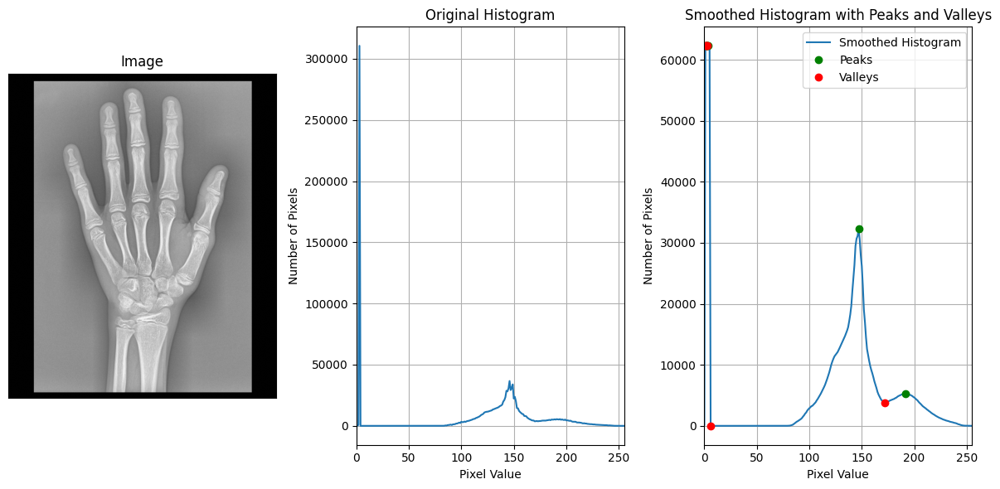

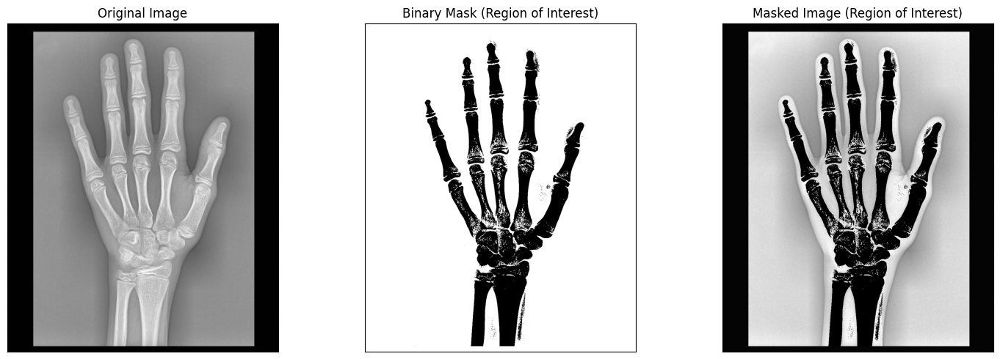

In [ ]:
# Randomly select an image from the directory
random_image_name = random.choice(os.listdir(test_images_dir))
img_path = os.path.join(test_images_dir, random_image_name)

# Load and process the image
img = cv2.imread(img_path, 0)
img = clahe_enhancement(img)
peaks, valleys = detect_peaks_valleys(img, plot=True)
newimg = create_bright_mask(img, peaks, valleys, plot=True)

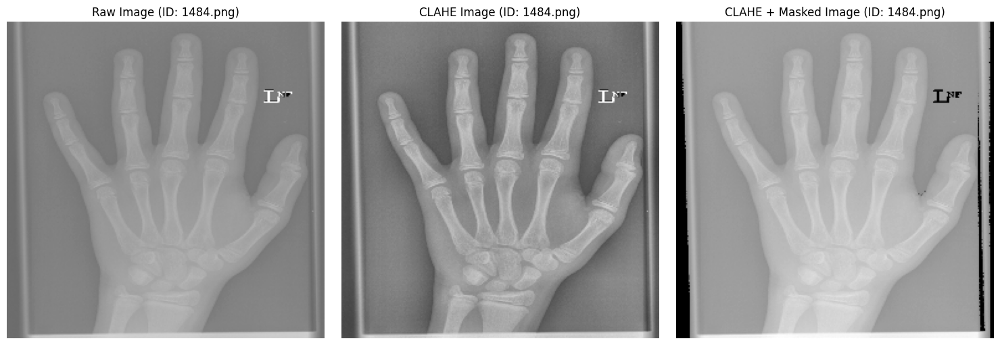

In [ ]:
# Randomly select an image filename from the raw directory
random_image_name = random.choice(os.listdir(raw_dir))

# Construct full paths for the different versions of the image
raw_image_path = os.path.join(raw_dir, random_image_name)
clahe_image_path = os.path.join(clahe_dir, random_image_name)
clahe_masked_image_path = os.path.join(clahe_masked_dir, random_image_name)

# Load images
raw_image = Image.open(raw_image_path)
clahe_image = Image.open(clahe_image_path)
clahe_masked_image = Image.open(clahe_masked_image_path)

# Plotting the images side by side
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(raw_image, cmap='gray')
plt.title(f"Raw Image (ID: {random_image_name})")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(clahe_image, cmap='gray')
plt.title(f"CLAHE Image (ID: {random_image_name})")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(clahe_masked_image, cmap='gray')
plt.title(f"CLAHE + Masked Image (ID: {random_image_name})")
plt.axis('off')

plt.tight_layout()
plt.show()

## Handling Data Imbalance

### Bone Age Distribution

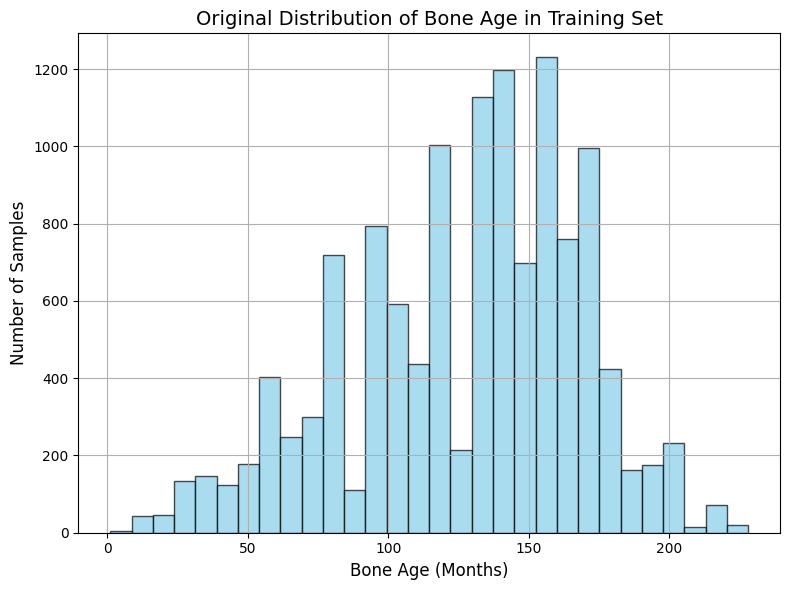

In [ ]:
# Plot the original bone age distribution
plt.figure(figsize=(8, 6))
plt.hist(train_metadata['boneage'], bins=30, alpha=0.7, color='skyblue', edgecolor='black')
plt.xlabel("Bone Age (Months)", fontsize=12)
plt.ylabel("Number of Samples", fontsize=12)
plt.title("Original Distribution of Bone Age in Training Set", fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

### Dynamic Augmentation Strategy

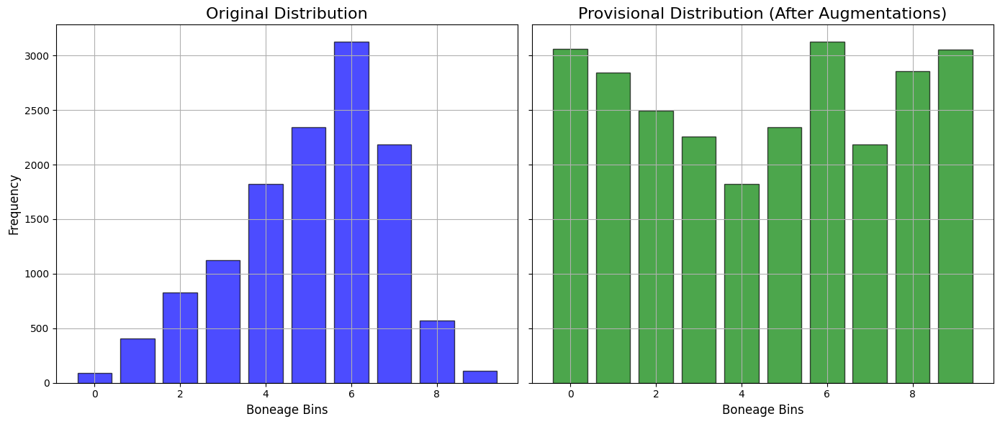

In [ ]:
# Normalize the bone age values between 0 and 1
min_boneage = train_metadata['boneage'].min()
max_boneage = train_metadata['boneage'].max()
train_metadata['normalized_boneage'] = (train_metadata['boneage'] - min_boneage) / (max_boneage - min_boneage)

# Assign bins to normalized bone age values
bin_edges = np.linspace(0, 1, 11)  # 10 bins between 0 and 1
train_metadata['bin'] = pd.cut(train_metadata['normalized_boneage'], bins=bin_edges, labels=False)

# Calculate frequency per bin
bin_counts = train_metadata['bin'].value_counts().sort_index()

# Determine augmentation factors
max_count = bin_counts.max()  # Bin with the highest frequency
augmentation_factors = {bin_idx: int(max_count / count) for bin_idx, count in bin_counts.items()}

# Calculate the provisional counts after augmentation
provisional_bin_counts = bin_counts.copy()
for bin_idx, count in bin_counts.items():
    augmentations_per_bin = (augmentation_factors[bin_idx] - 1) * count
    provisional_bin_counts[bin_idx] += augmentations_per_bin

# Plot the original and provisional distributions side by side
fig, ax = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Plot original distribution
ax[0].bar(bin_counts.index, bin_counts.values, color="blue", alpha=0.7, edgecolor='black')
ax[0].set_title("Original Distribution", fontsize=16)
ax[0].set_xlabel("Boneage Bins", fontsize=12)
ax[0].set_ylabel("Frequency", fontsize=12)
ax[0].grid(True)

# Plot provisional distribution (after augmentation)
ax[1].bar(provisional_bin_counts.index, provisional_bin_counts.values, color="green", alpha=0.7, edgecolor='black')
ax[1].set_title("Provisional Distribution (After Augmentations)", fontsize=16)
ax[1].set_xlabel("Boneage Bins", fontsize=12)
ax[1].grid(True)

plt.tight_layout()
plt.show()

##  Model Overview

### Retrieve trained models

In [ ]:
import tensorflow as tf
import os
from sklearn.metrics import mean_absolute_error
import time
import pandas as pd
import psutil
import gc
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Custom RMSE loss function
def rmse_loss(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))

# Custom functions for Attention CNN
def spatial_avg(x):
    return tf.reduce_mean(x, axis=-1, keepdims=True)

def spatial_max(x):
    return tf.reduce_max(x, axis=-1, keepdims=True)

# Function to get memory usage in MB (CPU)
def get_memory_usage():
    gc.collect()  # Force garbage collection
    process = psutil.Process(os.getpid())
    return process.memory_info().rss / (1024 * 1024)  # Convert to MB

# Function to reset GPU memory growth
def reset_gpu_memory():
    tf.keras.backend.clear_session()
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        try:
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
        except RuntimeError as e:
            print(e)

In [ ]:
# Define the path to saved models
saved_models_dir = '/content/drive/MyDrive/ML_HD_C2/saved_models/'

# Load all models
models = {
    "Base CNN Balanced": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'base_cnn_balanced.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "Base CNN Unbalanced": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'base_cnn_unbalanced.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "Attention CNN": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'attention_cnn.keras'),
        custom_objects={'spatial_avg': spatial_avg, 'spatial_max': spatial_max, 'rmse_loss': rmse_loss}
    ),
    "Inception V4 Balanced": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'inception_v4_balanced.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "ResNet50 Images Only": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'resnet50_images_only.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "ResNet50 Transfer Learning": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'resnet50_transfer_learning.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "ResNet50 Transfer Learning Lower Layers": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'resnet50_transfer_learning_lower_layers.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    )
}

### Model Performance Comparison

In [ ]:
#create dataset
batch_size = 32
test_dataset = create_dataset(test_clahe_dfd, batch_size, is_validation = True)

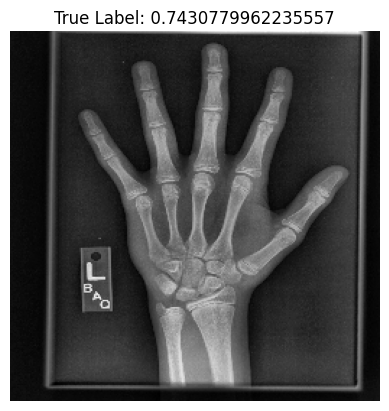

In [ ]:
random_int = np.random.randint(0, 31)
for element in test_dataset.take(1):
    random_image = element[0][0][random_int]  # Image
    random_gender = element[0][1][random_int]  # Gender
    random_label = element[1][random_int]  # Label

# Plot the selected image
plt.imshow(random_image.numpy().astype("uint8"), cmap='gray')
plt.axis("off")
plt.title(f"True Label: {random_label.numpy()}")
plt.show()

This code snippets takes some time, to make new prediction you need to run again

In [ ]:
# Initialize results list
results = []

# Reset GPU memory tracking
reset_gpu_memory()

# Evaluate each model
for model_name, model in models.items():
    print(f"\nEvaluating {model_name}...")

    # Count parameters
    param_count = model.count_params()

    # Calculate model size in MB
    model_size = os.path.getsize(os.path.join(saved_models_dir, model_name.replace(' ', '_').lower() + '.keras')) / (1024 * 1024)

    # Prepare the selected image for prediction
    test_im = tf.expand_dims(random_image, axis=0)
    test_gender = tf.expand_dims(random_gender, axis=0)

    # Measure inference time and memory
    start_time = time.time()
    memory_before_inference = get_memory_usage()

    single_prediction = model.predict((test_im, test_gender), verbose=0)

    memory_after_inference = get_memory_usage()
    inference_time = time.time() - start_time
    inference_memory_usage = max(memory_after_inference - memory_before_inference, 0)  # Avoid negative memory

    # Evaluate on the entire test dataset
    true_labels, predictions = [], []
    memory_before_test_eval = get_memory_usage()

    for element in test_dataset:
        images, genders, ages = element[0][0], element[0][1], element[1]
        for i in range(len(images)):
            img = tf.expand_dims(images[i], axis=0)
            gender = tf.expand_dims(genders[i], axis=0)
            prediction = model.predict((img, gender), verbose=0)
            true_labels.append(ages[i].numpy())
            predictions.append(prediction[0][0])

    memory_after_test_eval = get_memory_usage()
    eval_memory_usage = max(memory_after_test_eval - memory_before_test_eval, 0)  # Avoid negative memory

    # Compute Test MAE
    test_mae = mean_absolute_error(true_labels, predictions)

    # Store results
    results.append({
        'Model Name': model_name,
        'Parameters': param_count,
        'Model Size (MB)': model_size,
        'Inference Time (s)': inference_time,
        'Test MAE': test_mae,
        'Single Prediction': single_prediction.flatten()[0],
        'Inference Memory (MB)': inference_memory_usage,
        'Evaluation Memory (MB)': eval_memory_usage
    })


Evaluating Base CNN Balanced...

Evaluating Base CNN Unbalanced...

Evaluating Attention CNN...

Evaluating Inception V4 Balanced...

Evaluating ResNet50 Images Only...

Evaluating ResNet50 Transfer Learning...

Evaluating ResNet50 Transfer Learning Lower Layers...


In [ ]:
# Extract relevant data
model_names = [result['Model Name'] for result in results]
predictions = [result['Single Prediction'] for result in results]
parameters = [result['Parameters'] for result in results]
model_sizes = [result['Model Size (MB)'] for result in results]
inference_times = [result['Inference Time (s)'] for result in results]
test_mae = [result['Test MAE'] for result in results]
inference_memory = [result['Inference Memory (MB)'] for result in results]
evaluation_memory = [result['Evaluation Memory (MB)'] for result in results]

# Calculate prediction errors (absolute and percentage)
true_value = random_label.numpy()
absolute_errors = [abs(pred - true_value) for pred in predictions]
percentage_errors = [(error / true_value) * 100 if true_value != 0 else 0 for error in absolute_errors]

# Determine dynamic y-axis limits
min_pred = min(predictions + [true_value])
max_pred = max(predictions + [true_value])
y_margin = (max_pred - min_pred) * 0.2  # Add margin for visibility

### Model Predicitons

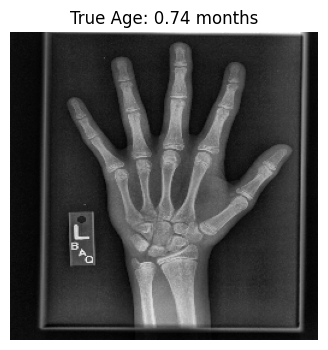

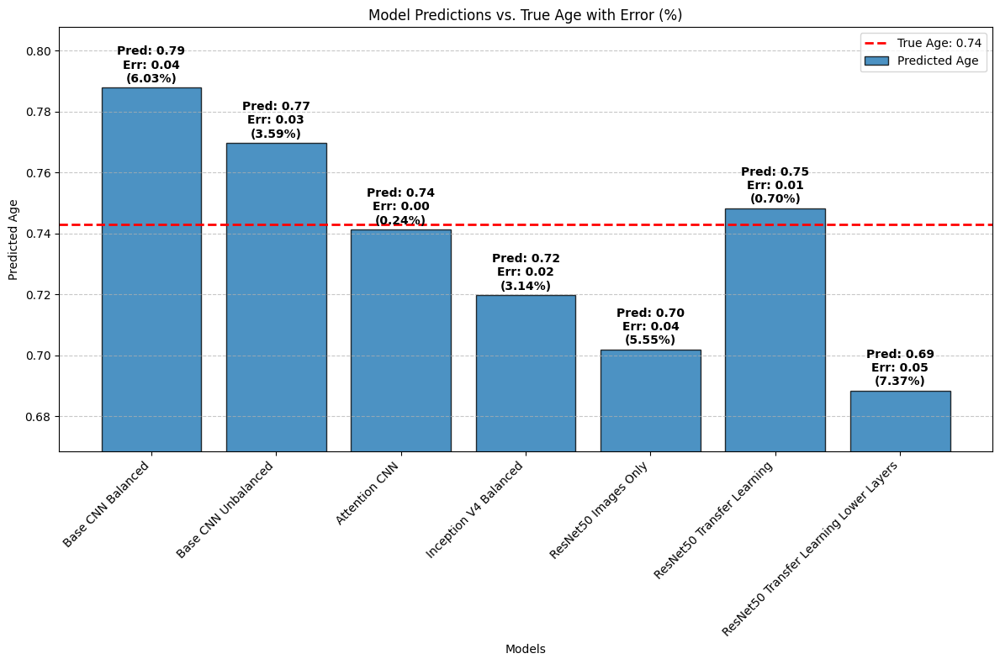

In [ ]:
# Plot the randomly selected test image with its true label
plt.figure(figsize=(4, 4))
plt.imshow(random_image.numpy().astype("uint8"), cmap='gray')
plt.axis('off')
plt.title(f"True Age: {random_label.numpy():.2f} months")
plt.show()

plt.figure(figsize=(12, 8))
bars = plt.bar(model_names, predictions, alpha=0.8, edgecolor='black', label='Predicted Age')

# Red dashed line for the true label
plt.axhline(y=true_value, color='red', linestyle='--', linewidth=2, label=f'True Age: {true_value:.2f}')

# Annotate each bar with absolute and percentage error
for bar, pred, abs_error, perc_error in zip(bars, predictions, absolute_errors, percentage_errors):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + y_margin * 0.05,
             f"Pred: {pred:.2f}\nErr: {abs_error:.2f}\n({perc_error:.2f}%)",
             ha='center', va='bottom', fontsize=10, color='black', fontweight='bold')

# Adjust y-axis dynamically
plt.ylim(min_pred - y_margin, max_pred + y_margin)

# Labels and title
plt.ylabel('Predicted Age')
plt.xlabel('Models')
plt.title('Model Predictions vs. True Age with Error (%)')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Number of Parameters

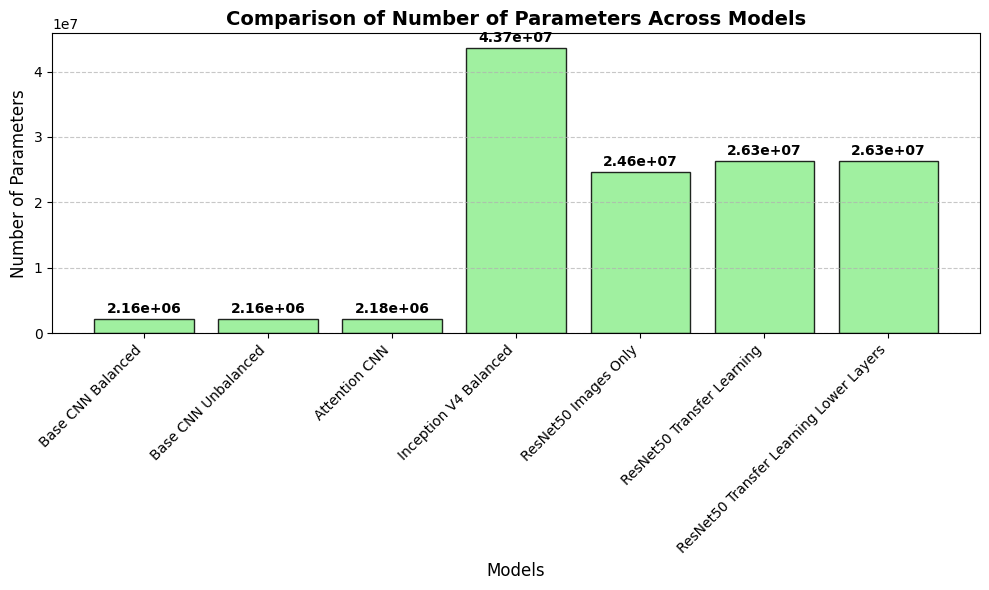

In [ ]:
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, parameters, color='lightgreen', edgecolor='black', alpha=0.85)

# Annotate values on the bars
for bar, value in zip(bars, parameters):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01 * max(parameters),
             f"{value:.2e}", ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylabel('Number of Parameters', fontsize=12)
plt.xlabel('Models', fontsize=12)
plt.title('Comparison of Number of Parameters Across Models', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Size of the Models

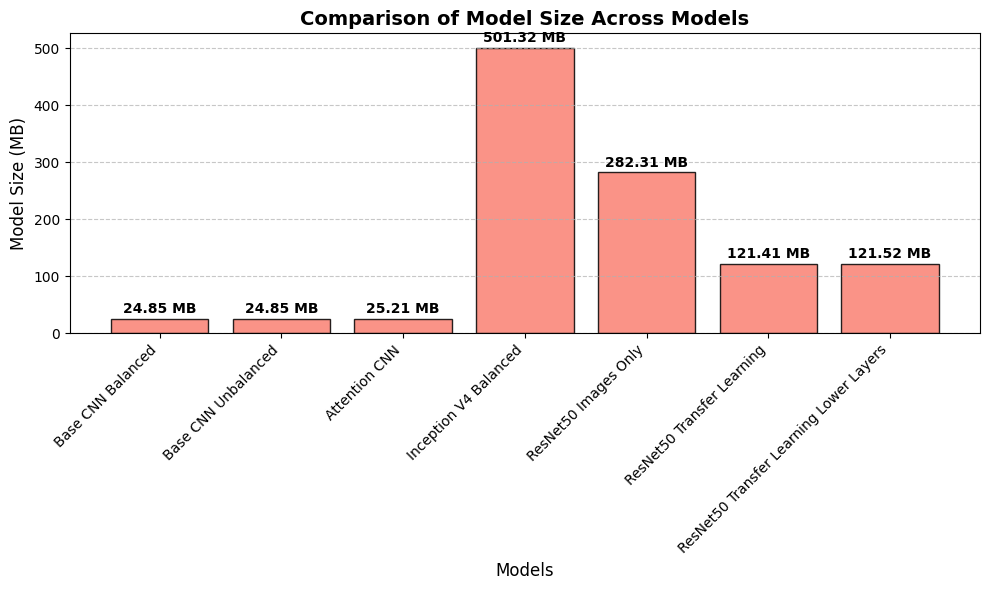

In [ ]:
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, model_sizes, color='salmon', edgecolor='black', alpha=0.85)

# Annotate values
for bar, value in zip(bars, model_sizes):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01 * max(model_sizes),
             f"{value:.2f} MB", ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylabel('Model Size (MB)', fontsize=12)
plt.xlabel('Models', fontsize=12)
plt.title('Comparison of Model Size Across Models', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Inference Time of the Models

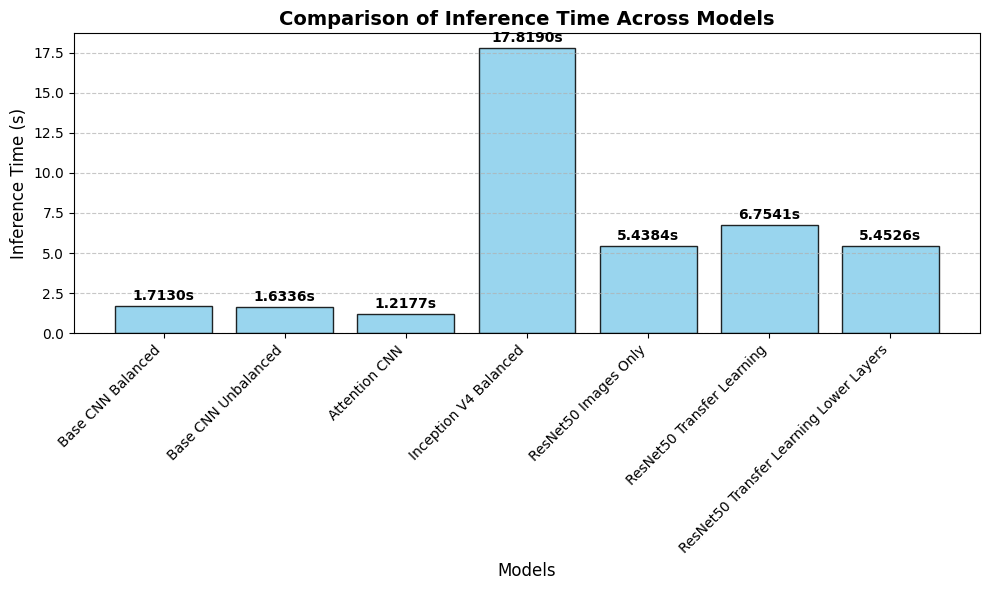

In [ ]:
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, inference_times, color='skyblue', edgecolor='black', alpha=0.85)

# Annotate values
for bar, value in zip(bars, inference_times):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01 * max(inference_times),
             f"{value:.4f}s", ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylabel('Inference Time (s)', fontsize=12)
plt.xlabel('Models', fontsize=12)
plt.title('Comparison of Inference Time Across Models', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Mean Absolute Errors of the Models

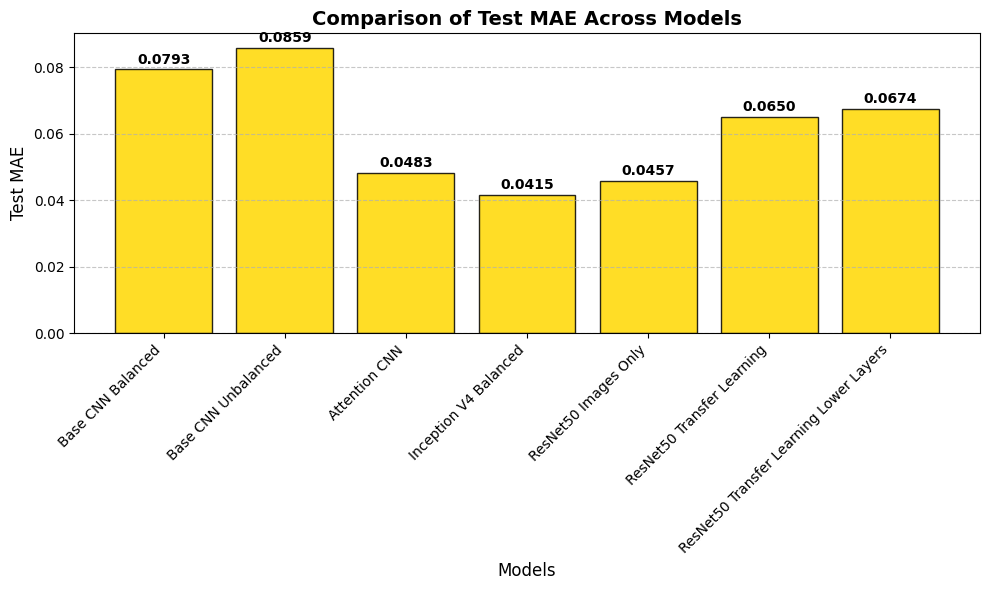

In [ ]:
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, test_mae, color='gold', edgecolor='black', alpha=0.85)

# Annotate values
for bar, value in zip(bars, test_mae):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01 * max(test_mae),
             f"{value:.4f}", ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylabel('Test MAE', fontsize=12)
plt.xlabel('Models', fontsize=12)
plt.title('Comparison of Test MAE Across Models', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Memory Usage of  Models

### Evaluation Memory Usage of Models

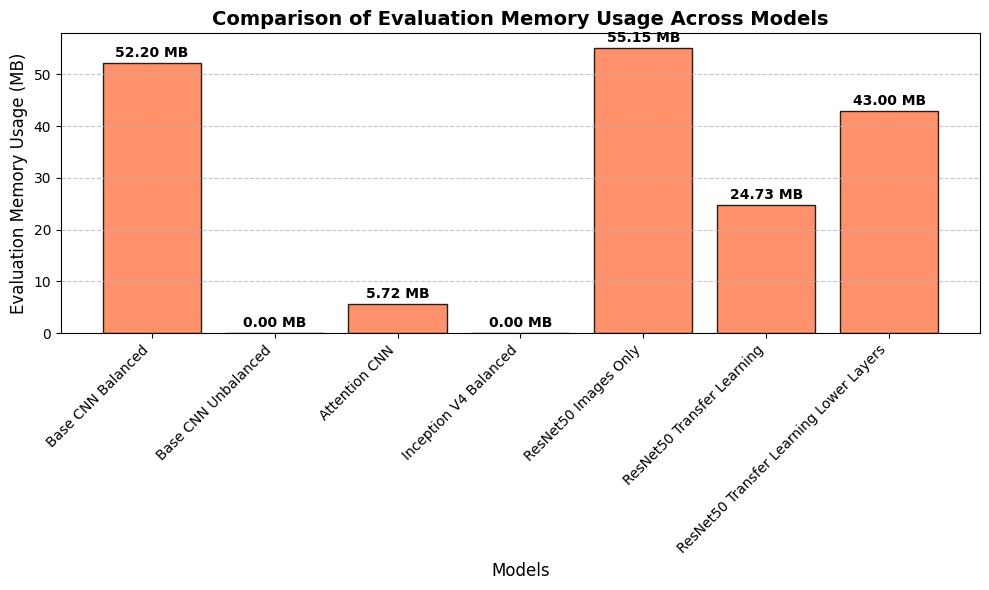

In [ ]:
plt.figure(figsize=(10, 6))
bars = plt.bar(model_names, evaluation_memory, color='coral', edgecolor='black', alpha=0.85)

# Annotate values
for bar, value in zip(bars, evaluation_memory):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01 * max(evaluation_memory),
             f"{value:.2f} MB", ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.ylabel('Evaluation Memory Usage (MB)', fontsize=12)
plt.xlabel('Models', fontsize=12)
plt.title('Comparison of Evaluation Memory Usage Across Models', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Comparison Table

In [ ]:
from tabulate import tabulate

# Prepare data for the comparison table
comparison_data = [
    [
        result['Model Name'],
        f"{result['Parameters']:,}",
        f"{result['Model Size (MB)']:.2f} MB",
        f"{result['Inference Time (s)']:.4f} s",
        f"{result['Inference Memory (MB)']:.2f} MB",
        f"{result['Evaluation Memory (MB)']:.2f} MB",
        f"{result['Test MAE']:.4f}",
        f"{result['Single Prediction']:.4f}"
    ]
    for result in results
]

# Define table headers
headers = [
    "Model Name",
    "Parameters",
    "Model Size (MB)",
    "Inference Time (s)",
    "Inference Memory (MB)",
    "Evaluation Memory (MB)",
    "Test MAE",
    "Single Prediction"
]

# Print the formatted comparison table
print("\n Model Comparison Table")
print("=" * 60)
print(tabulate(comparison_data, headers=headers, tablefmt="fancy_grid"))


 Model Comparison Table
╒═════════════════════════════════════════╤══════════════╤═══════════════════╤══════════════════════╤═════════════════════════╤══════════════════════════╤════════════╤═════════════════════╕
│ Model Name                              │ Parameters   │ Model Size (MB)   │ Inference Time (s)   │ Inference Memory (MB)   │ Evaluation Memory (MB)   │   Test MAE │   Single Prediction │
╞═════════════════════════════════════════╪══════════════╪═══════════════════╪══════════════════════╪═════════════════════════╪══════════════════════════╪════════════╪═════════════════════╡
│ Base CNN Balanced                       │ 2,162,945    │ 24.85 MB          │ 1.7130 s             │ 0.00 MB                 │ 52.20 MB                 │     0.0793 │              0.7878 │
├─────────────────────────────────────────┼──────────────┼───────────────────┼──────────────────────┼─────────────────────────┼──────────────────────────┼────────────┼─────────────────────┤
│ Base CNN Unbalanced    

In [ ]:
carpal_model = tf.keras.models.load_model(saved_models_dir + 'cnn_carpal.keras', custom_objects={'rmse_loss':rmse_loss})

True Label: 0.6081404575015066
Prediction for Base CNN Balanced: [[0.60549974]]
Prediction for Base CNN Unbalanced: [[0.6478567]]
Prediction for Attention CNN: [[0.6113594]]
Prediction for Inception V4 Balanced: [[0.69437623]]
Prediction for ResNet50 Images Only: [[0.62564564]]
Prediction for ResNet50 Transfer Learning: [[0.59312814]]
Prediction for ResNet50 Transfer Learning Lower Layers: [[0.5730187]]


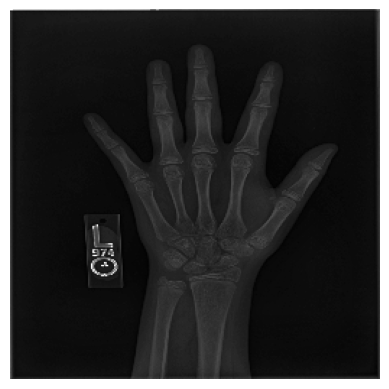

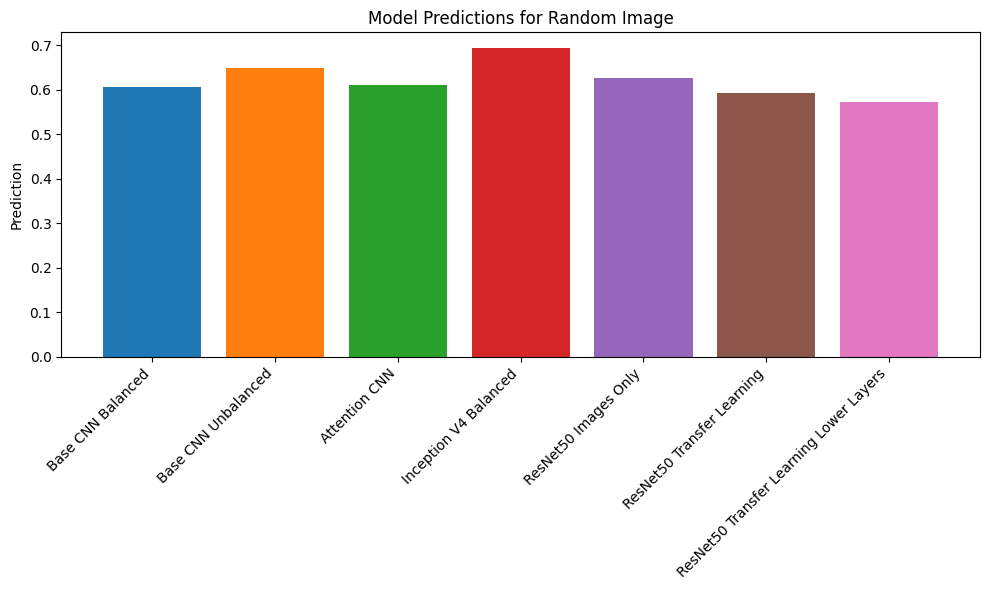

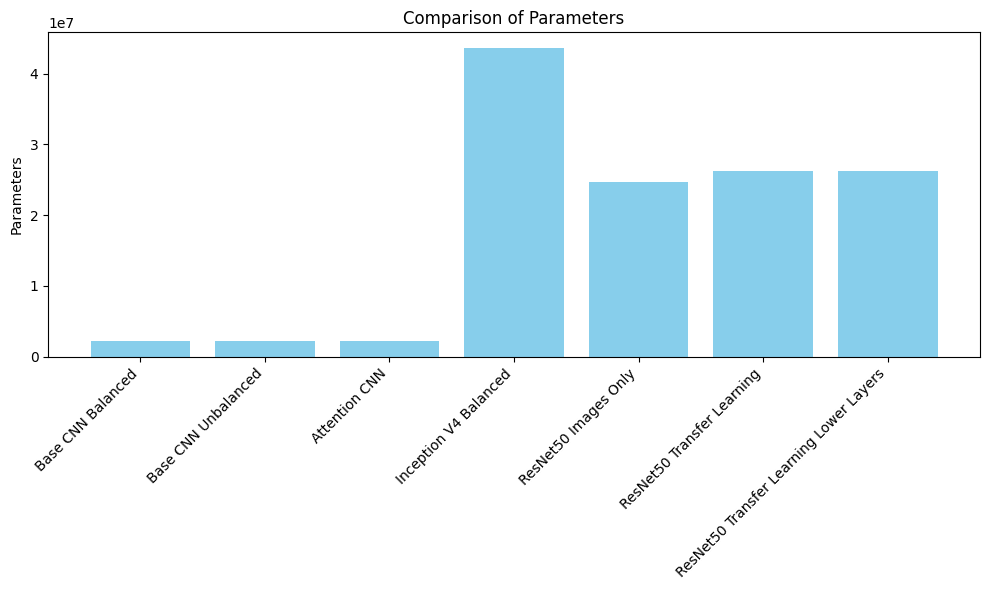

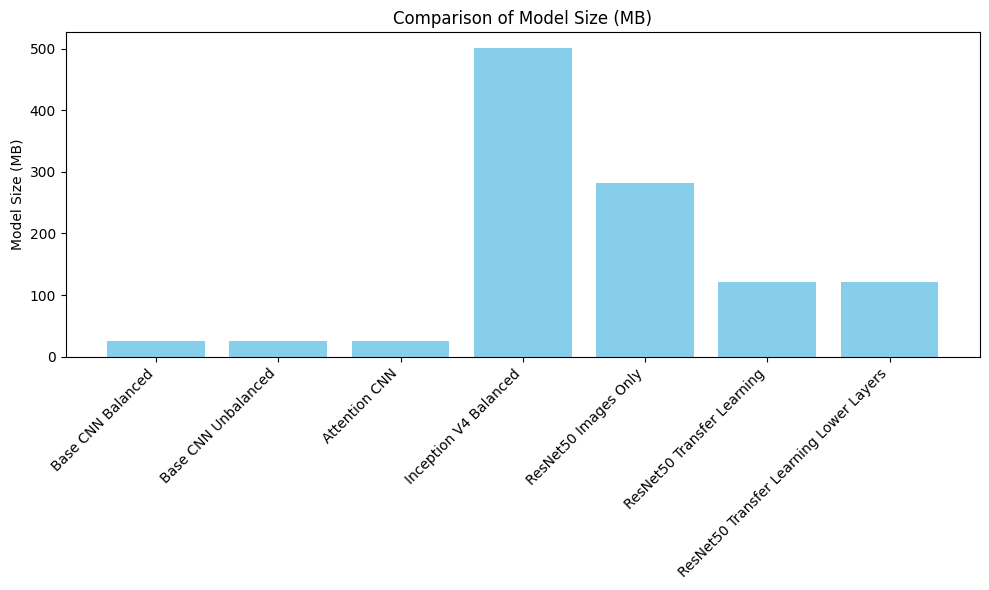

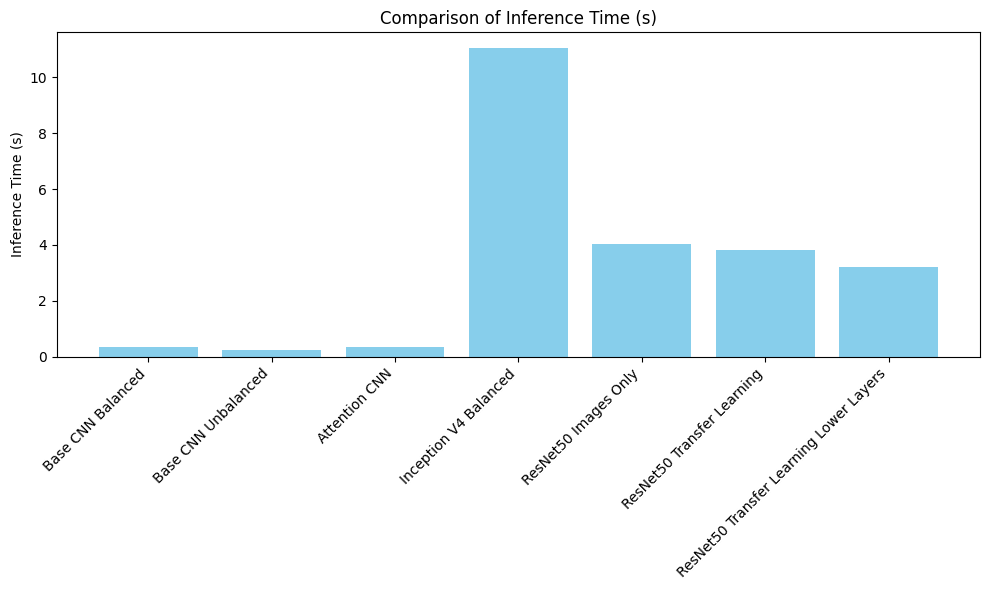

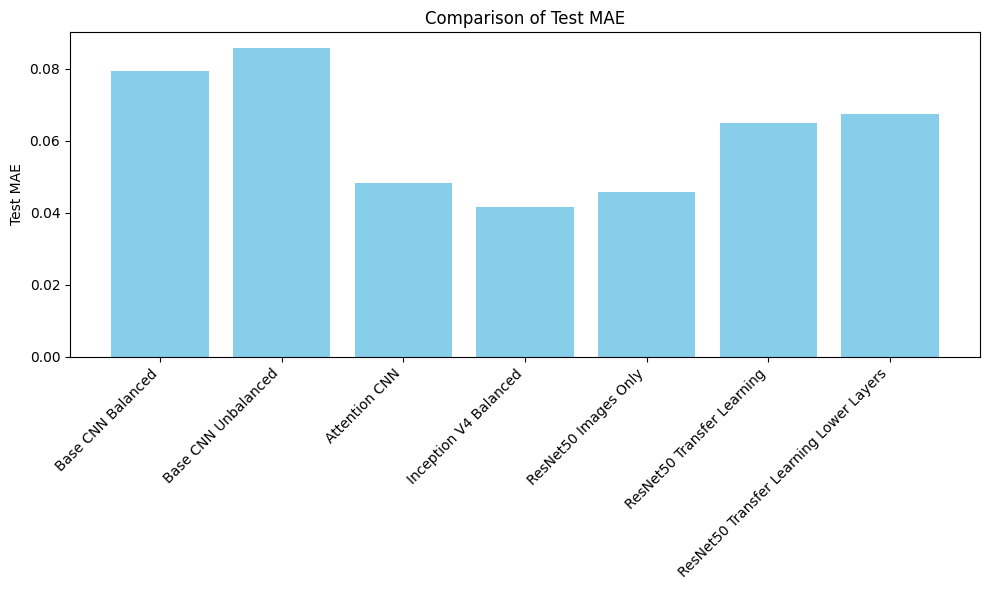


Model Comparison Table
Base CNN Balanced
  Parameters: 2,162,945
  Model Size: 24.85 MB
  Inference Time: 0.3581 s
  Test MAE: 0.0793
  Single Prediction: 0.6055

Base CNN Unbalanced
  Parameters: 2,162,945
  Model Size: 24.85 MB
  Inference Time: 0.2264 s
  Test MAE: 0.0859
  Single Prediction: 0.6479

Attention CNN
  Parameters: 2,184,746
  Model Size: 25.21 MB
  Inference Time: 0.3307 s
  Test MAE: 0.0483
  Single Prediction: 0.6114

Inception V4 Balanced
  Parameters: 43,665,537
  Model Size: 501.32 MB
  Inference Time: 11.0596 s
  Test MAE: 0.0415
  Single Prediction: 0.6944

ResNet50 Images Only
  Parameters: 24,637,313
  Model Size: 282.31 MB
  Inference Time: 4.0506 s
  Test MAE: 0.0457
  Single Prediction: 0.6256

ResNet50 Transfer Learning
  Parameters: 26,278,401
  Model Size: 121.41 MB
  Inference Time: 3.8197 s
  Test MAE: 0.0650
  Single Prediction: 0.5931

ResNet50 Transfer Learning Lower Layers
  Parameters: 26,278,401
  Model Size: 121.52 MB
  Inference Time: 3.2174 s

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import time
import os
from sklearn.metrics import mean_absolute_error

# Define your custom loss and utility functions
def rmse_loss(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))

def spatial_avg(x):
    return tf.reduce_mean(x, axis=-1, keepdims=True)

def spatial_max(x):
    return tf.reduce_max(x, axis=-1, keepdims=True)


models = {
    "Base CNN Balanced": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'base_cnn_balanced.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "Base CNN Unbalanced": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'base_cnn_unbalanced.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "Attention CNN": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'attention_cnn.keras'),
        custom_objects={'spatial_avg': spatial_avg, 'spatial_max': spatial_max, 'rmse_loss': rmse_loss}
    ),
    "Inception V4 Balanced": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'inception_v4_balanced.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "ResNet50 Images Only": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'resnet50_images_only.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "ResNet50 Transfer Learning": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'resnet50_transfer_learning.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    ),
    "ResNet50 Transfer Learning Lower Layers": tf.keras.models.load_model(
        os.path.join(saved_models_dir, 'resnet50_transfer_learning_lower_layers.keras'),
        custom_objects={'rmse_loss': rmse_loss}
    )
}
random_image, random_gender, random_label = None, None, None
random_int = np.random.randint(0, 31)
for element in test_dataset.take(1):
        random_image = element[0][0][random_int]  # Extract one image (shape: (1, height, width, channels))
        random_gender = element[0][1][random_int]  # Extract one gender (shape: (1, 1))
        random_label = element[1][random_int]  # Extract one label (shape: (1,))

#plot the image
plt.imshow(random_image.numpy().astype("uint8"), cmap='gray')
plt.axis("off")

#print the label
print(f"True Label: {random_label.numpy()}")
# Initialize result storage
results = []

# Evaluate models
for model_name, model in models.items():
    # Count parameters
    param_count = model.count_params()
    # Calculate model size
    model_size = os.path.getsize(os.path.join(saved_models_dir, model_name.replace(' ', '_').lower() + '.keras')) / (1024 * 1024)
    test_im = tf.expand_dims(random_image, axis=0)
    test_gender = tf.expand_dims(random_gender, axis=0)
    # Make a prediction
    # Measure inference time for one random image
    start_time = time.time()
    single_prediction = model.predict((test_im,test_gender), verbose=0)
    print(f"Prediction for {model_name}: {single_prediction}")
    inference_time = time.time() - start_time

    # Calculate test MAE for the entire dataset
    true_labels = []
    predictions = []
    for element in test_dataset:
          images = element[0][0]  # Image inputs
          genders = element[0][1]  # Gender inputs
          ages = element[1]  # True age labels

          for i in range(len(images)):
              test_img = tf.expand_dims(images[i], axis=0)  # Shape: (1, 256, 256, 3)
              test_gender = tf.expand_dims(genders[i], axis=0)  # Shape: (1, 1)

              # Make a prediction
              prediction = model.predict((test_img, test_gender), verbose=0)

              # Store true label, prediction, and sample data
              true_labels.append(ages[i].numpy())
              predictions.append(prediction[0][0])

    test_mae = mean_absolute_error(true_labels, predictions)

    # Store results
    results.append({
        'Model Name': model_name,
        'Parameters': param_count,
        'Model Size (MB)': model_size,
        'Inference Time (s)': inference_time,
        'Test MAE': test_mae,
        'Single Prediction': single_prediction.flatten()[0]  # Assuming scalar prediction
    })

# Plot predictions for single random image
plt.figure(figsize=(10, 6))
for result in results:
    plt.bar(result['Model Name'], result['Single Prediction'], label=result['Model Name'])

plt.ylabel('Prediction')
plt.title('Model Predictions for Random Image')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Plot comparative metrics
metrics = ['Parameters', 'Model Size (MB)', 'Inference Time (s)', 'Test MAE']
for metric in metrics:
    plt.figure(figsize=(10, 6))
    values = [result[metric] for result in results]
    plt.bar([result['Model Name'] for result in results], values, color='skyblue')
    plt.ylabel(metric)
    plt.title(f'Comparison of {metric}')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Print summary table
print("\nModel Comparison Table")
print("=" * 40)
for result in results:
    print(f"{result['Model Name']}\n"
          f"  Parameters: {result['Parameters']:,}\n"
          f"  Model Size: {result['Model Size (MB)']:.2f} MB\n"
          f"  Inference Time: {result['Inference Time (s)']:.4f} s\n"
          f"  Test MAE: {result['Test MAE']:.4f}\n"
          f"  Single Prediction: {result['Single Prediction']:.4f}\n")


In [ ]:
dec_fus_cnn_and_carpal_single_image(random_image,random_gender,models['Inception V4 Balanced'],carpal_model)

Fused Prediction: 0.6719


0.6719384253025055